In [116]:
import numpy as np
import matplotlib.pyplot as plt
from scipy import stats
import math

In [4]:
def build_toy_dataset(N):
  pi = np.array([0.4, 0.6])
  mus = [[1, 1], [-1, -1]]
  stds = [[0.1, 0.1], [0.1, 0.1]]
  x = np.zeros((N, 2), dtype=np.float32)
  for n in range(N):
    k = np.argmax(np.random.multinomial(1, pi))
    x[n, :] = np.random.multivariate_normal(mus[k], np.diag(stds[k]))
 
  return x
 
N = 500  # number of data points
D = 2  # dimensionality of data

x_train = build_toy_dataset(N)

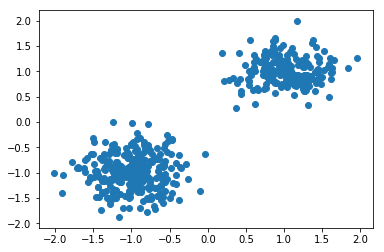

In [3]:
plt.scatter(x_train[:, 0], x_train[:, 1])
# plt.axis([-3, 3, -3, 3])
plt.show()

In [490]:
def gauss_my(X, means, covs, n_component):  # 自作のGauss関数
    n_size, ndim = np.shape(X)
    a = lambda i: np.sqrt(np.linalg.det(covs[:,:,i]).T*(2*np.pi)**ndim)
    b1 = lambda i: X-means[:, i].reshape(1, -1)
    b2 = lambda i: np.linalg.inv(covs[:,:,i])
    b3 = lambda i: np.dot(b1(i), b2(i))
    b4 = lambda i: np.exp(-0.5 * np.diag(np.dot(b3(i), b1(i).T)))
    b = np.hstack([b4(i).reshape(-1, 1) / a(i).reshape(-1, 1) for i in range(n_component)])
    return b.reshape(n_size, n_component)


def gauss_or(X, means, covs, n_component):  # scipyによるGauss関数
    mn_lst = np.array([stats.multivariate_normal(mean=means[:, i], cov=covs[:,:,i]) for i in range(n_component)])
    return np.array([mn_lst[i].pdf(X) for i in range(n_component)]).T


class GaussianMixture(object):

    def __init__(self, n_component):
        # ガウス分布の個数
        self.n_component = n_component
    
    # EMアルゴリズムを用いた最尤推定
    # f_factor: 忘却率
    # s_factor: スムージング定数
    def fit(self, X, f_factor, s_factor):
        # データの次元
        self.ndim = np.size(X, 1)

        # 前処理
        self.pre_process(X)
    
        # EステップとMステップを繰り返す
        for i in range(np.shape(X)[0]):
            xt = X[i, :].reshape(1, -1)
            self.print_self(xt)
            # Eステップ、負担率を計算
            self.resps = self.expectation(xt)
            # Mステップ、パラメータを更新
            self.maximization(xt, f_factor, s_factor)
            
            print("==============================================")
            print("Step:" + str(i) + " / resps:" + str(self.resps) + " / w:" + str(self.weights))
            print("==============================================")
            
            # # パラメータが収束したかを確認
            # if np.allclose(params, np.hstack((self.weights.ravel(), self.means.ravel(), self.covs.ravel()))):
            #     break
            # else:
            #     print("parameters may not have converged")

    # 前処理関数
    def pre_process(self, X):
        # 推定のための中間パラメータ値の初期化
        self.weights_f = (np.ones(self.n_component) / self.n_component).reshape(self.n_component)
        self.means_f = (np.random.uniform(X.min(), X.max(), (self.ndim, self.n_component))).reshape(self.ndim, self.n_component)
        self.covs_f = np.repeat(10 * np.eye(self.ndim), self.n_component).reshape(self.ndim, self.ndim, self.n_component)
        # 推定パラメータ値の算出        
        self.weights = (self.weights_f + s_factor) / (self.n_component * s_factor + self.weights_f.sum())  # 式(5.15)
        self.means = self.means_f / self.weights_f  # 式(5.10)
        self.covs = self.covs_f / self.weights_f - \
                np.array([np.dot(self.means[:, i].reshape(-1, 1), self.means[:,i].reshape(-1, 1).T) for i in range(self.n_component)]).T  # 式(5.12) 
        self.resps = self.weights
    
    # ガウス関数
    def gauss(self, X):  
        print("gauss func called...")
        # ガウス関数による分布確率の取得
        # ------ Choose one ------------
        val = gauss_my(X, self.means, self.covs, self.n_component)
#         val = gauss_or(X, self.means, self.covs, self.n_component)
        # ------ Choose one ------------
        return val

    # Eステップ
    def expectation(self, X):
        if (math.isnan(self.gauss(X).sum()) or self.gauss(X).sum() == 0):
            print("##### Gauss includes NaN !!!!!!!! #####")
            return self.resps
        else:
            self.resps = self.weights * self.gauss(X)
            self.resps /= self.resps.sum(axis=-1, keepdims=True)  # 式(5.7)
            print("gauss: " + str(self.gauss(X)))
            print("resps: " + str(self.resps))
            return self.resps

    # Mステップ
    def maximization(self, X, f_factor, s_factor):
        # 推定のための中間パラメータ値の更新
        self.weights_f = ((1 - f_factor) * self.weights_f + f_factor * self.resps).reshape(1, self.n_component) # 式(5.14) (5.17)
        self.means_f = (1 - f_factor) * self.means_f + f_factor * X.reshape(-1, 1) * self.resps.reshape(1, -1) # 式(5.18) 
        self.covs_f = (1 - f_factor) * self.covs_f + \
            f_factor * np.vstack([np.dot(X.T, X) * i] for i in self.resps.reshape(-1)).T  # 式(5.19) 
        # 推定パラメータ値の更新
        self.weights = (self.weights_f + s_factor) / (self.n_component * s_factor + self.weights_f.sum())  # 式(5.15)
        self.means = self.means_f / self.weights_f  # 式(5.10)
        self.covs = (self.covs_f / self.weights_f) - \
            np.array([np.dot(self.means[:, i].reshape(-1, 1), self.means[:,i].reshape(-1, 1).T) for i in range(self.n_component)]).T  # 式(5.12) 

    # 確率分布p(x)を計算
    def predict_proba(self, X):
        gauss = self.weights.reshape(-1, 1) * self.gauss(X)
        return np.sum(gauss, axis=-1)

    # クラスタリング
    def classify(self, X):
        joint_prob = self.weights.reshape(1, -1) * self.gauss(X)
        return np.argmax(joint_prob, axis=1)
    
    def print_self(self, X):
        print("============================")
        print(" Params list")
        print("============================")
        print("X: " + str(X))
        print("means: " + str(self.means))
        print("covs: " + str(self.covs))
        print("weights: " + str(self.weights))
        print("resps: " + str(self.resps))
        print("============================")



In [491]:
def create_toy_data(n_size, pi):
#     pi = np.array([0.8, 0.1, 0.01])
    mus = [[1, 1], [-1, -1], [2, -2]]
    stds = [[0.2, 0.1], [0.1, 0.1], [0.3, 0.3]]
    x = np.zeros((n_size, 2), dtype=np.float32)
    y = np.zeros((n_size, 1), dtype=np.float32)
    for n in range(n_size):
        k = np.argmax(np.random.multinomial(1, pi))
        x[n, :] = np.random.multivariate_normal(mus[k], np.diag(stds[k]))
        y[n] = k
    return x, y


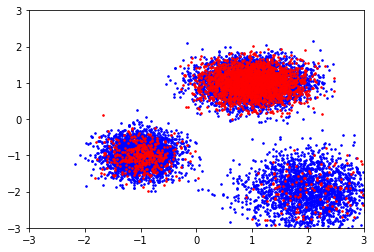

In [492]:
### データ作成
n_size = 10000
pi_train = np.array([0.5, 0.3, 0.2])
x_train, y_train = create_toy_data(n_size, pi_train) # Xは時系列で昇順
# x_train = X[:round(n_size*0.7), :]
# y_train = Y[:round(n_size*0.7)]
# x_test  = X[round(n_size*0.7):, :]
# y_test  = Y[round(n_size*0.7):]

n_size = 3000
pi_test = np.array([0.8, 0.15, 0.05])
x_test, y_test = create_toy_data(n_size, pi_test) # Xは時系列で昇順

plt.scatter(x_train[:, 0], x_train[:, 1], color='blue', marker='.', s=10)
plt.scatter(x_test[:, 0], x_test[:, 1], color='red', marker='.', s=10)
plt.axis([-3, 3, -3, 3])
plt.show()

In [531]:
### 学習ステップ
f_factor = 0.1
s_factor = 0.1
# init_weights = np.array([0.3, 0.3, 0.4])
# init_means = np.array([1.0, 0.0, 0.0])
# init_covs = np.array([[1.0, 0.0], [0.0, 0.0]])
model = GaussianMixture(3)
# model.set_init_params(init_weights, init_means, init_covs)
# model.set_init_weights(init_weights)
model.fit(x_train, f_factor, s_factor)

 Params list
X: [[1.2052262 1.4457104]]
means: [[ 9.0474167  -1.26354939 -1.09559147]
 [ 7.45294639 -1.7233128  -9.38972662]]
covs: [[[-51.85574902  28.40344295  28.79967934]
  [-67.42991165  -2.17749083 -10.28730434]]

 [[-67.42991165  -2.17749083 -10.28730434]
  [-25.54640986  27.03019298 -58.16696597]]]
weights: [0.33333333 0.33333333 0.33333333]
resps: [0.33333333 0.33333333 0.33333333]
gauss func called...
##### Gauss includes NaN !!!!!!!! #####
Step:0 / resps:[0.33333333 0.33333333 0.33333333] / w:[[0.33333333 0.33333333 0.33333333]]
 Params list
X: [[0.5478244 1.4273733]]
means: [[ 8.26319765 -1.01667183 -0.8655097 ]
 [ 6.8522228  -1.40641047 -8.30618291]]
covs: [[[-41.13517841  26.11163542  26.39614999]
  [-56.44703055  -1.2556171   -7.01484108]]

 [[-56.44703055  -1.2556171   -7.01484108]
  [-19.74394943  25.23101746 -41.78366659]]]
weights: [[0.33333333 0.33333333 0.33333333]]
resps: [0.33333333 0.33333333 0.33333333]
gauss func called...
##### Gauss includes NaN !!!!!!!! ###

/Users/masamitsuochiai/miniconda2/envs/py3env/lib/python3.6/site-packages/ipykernel_launcher.py:3: RuntimeWarning: invalid value encountered in sqrt
  This is separate from the ipykernel package so we can avoid doing imports until



X: [[0.951461  1.0964435]]
means: [[ 2.20531751 -0.20196244  0.05114035]
 [ 1.52164576 -0.86381873 -2.16514295]]
covs: [[[ 3.45455558  6.77459999  6.19272763]
  [-3.18084457 -0.21672377 -0.31092519]]

 [[-3.18084457 -0.21672377 -0.31092519]
  [ 6.09959865  6.12001209  1.53677705]]]
weights: [[0.27364556 0.33778267 0.38857178]]
resps: [[0.00088955 0.4402785  0.55883195]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.02584146 0.01617787 0.00133478]]
resps: [[0.54167614 0.41859402 0.03972984]]
Step:16 / resps:[[0.54167614 0.41859402 0.03972984]] / w:[[0.2956407  0.34389625 0.36046305]]
 Params list
X: [[-1.2912198 -0.9542708]]
means: [[ 1.96644818 -0.06284844  0.06084447]
 [ 1.44064146 -0.62739219 -2.12998788]]
covs: [[[ 3.03888538  6.09862251  6.13462184]
  [-2.49265082  0.04922489 -0.27626419]]

 [[-2.49265082  0.04922489 -0.27626419]
  [ 4.96545956  5.78944011  1.6336383 ]]]
weights: [[0.2956407  0.34389625 0.36046305]]
resps: [[0.54167

 Params list
X: [[0.8439804 1.1860434]]
means: [[ 1.26374547  0.08157151  0.66960403]
 [ 1.04376451 -0.88580834 -1.64153652]]
covs: [[[ 0.1714511   2.22454484  2.3925758 ]
  [-0.04754759 -0.29537032 -0.88844086]]

 [[-0.04754759 -0.29537032 -0.88844086]
  [ 0.20708024  1.27596935  0.54915825]]]
weights: [[0.34241251 0.2414401  0.41614739]]
resps: [[9.87314565e-01 1.26854347e-02 2.12202568e-10]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.21258279e-01 1.24791384e-02 1.13203347e-09]]
resps: [[9.83399489e-01 1.66005084e-02 2.59557649e-09]]
Step:48 / resps:[[9.83399489e-01 1.66005084e-02 2.59557649e-09]] / w:[[0.39150968 0.22626536 0.38222496]]
 Params list
X: [[0.45277336 1.4944378 ]]
means: [[ 1.16280793  0.08809054  0.66960403]
 [ 1.07797717 -0.86809282 -1.64153652]]
covs: [[[ 0.1624053   2.21045138  2.3925758 ]
  [-0.04702216 -0.27945375 -0.88844086]]

 [[-0.04702216 -0.27945375 -0.88844086]
  [ 0.16098256  1.30144918  0.54915825]]]
we

 Params list
X: [[0.5892111  0.21759096]]
means: [[ 0.86484692  1.53389161 -0.13779727]
 [ 1.06256023 -0.76670662 -1.06862012]]
covs: [[[ 0.24642084  1.00004152  1.50390686]
  [ 0.02037001 -0.90473399 -0.46195745]]

 [[ 0.02037001 -0.90473399 -0.46195745]
  [ 0.10503521  1.45526483  0.21065484]]]
weights: [[0.44338011 0.2349097  0.3217102 ]]
resps: [[8.39251957e-01 1.60748043e-01 1.60842035e-17]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.24777229e-02 1.25983582e-01 2.63953857e-08]]
resps: [[3.27311243e-01 6.72688564e-01 1.93015410e-07]]
Step:105 / resps:[[3.27311243e-01 6.72688564e-01 1.93015410e-07]] / w:[[0.43191219 0.27085631 0.2972315 ]]
 Params list
X: [[1.3724242 0.674979 ]]
means: [[ 0.84529731  1.28183191 -0.13779722]
 [ 1.00263035 -0.5040763  -1.06862004]]
covs: [[[ 0.2339497   0.90779218  1.50390679]
  [ 0.03427247 -0.84523605 -0.46195736]]

 [[ 0.03427247 -0.84523605 -0.46195736]
  [ 0.14463285  1.25650271  0.21065494]]]
w

Step:158 / resps:[[9.57402190e-01 4.25978101e-02 5.27880130e-23]] / w:[[0.68112704 0.14643108 0.17244188]]
 Params list
X: [[ 2.0968778 -2.116696 ]]
means: [[ 1.05305764  1.80627866  0.51150462]
 [ 0.93145819 -1.06119382 -1.98165544]]
covs: [[[ 0.32214191  0.38916509  1.19806306]
  [ 0.09980722 -0.66295248 -0.74175429]]

 [[ 0.09980722 -0.66295248 -0.74175429]
  [ 0.10972391  1.33552806  0.52992219]]]
weights: [[0.68112704 0.14643108 0.17244188]]
resps: [[9.57402190e-01 4.25978101e-02 5.27880130e-23]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.72526163e-33 2.35332583e-01 1.20479114e-03]]
resps: [[1.71427622e-31 9.94007215e-01 5.99278540e-03]]
Step:159 / resps:[[1.71427622e-31 9.94007215e-01 5.99278540e-03]] / w:[[0.62070665 0.21594237 0.16335098]]
 Params list
X: [[1.4369794 1.5733583]]
means: [[ 1.05305764  1.96611131  0.51996058]
 [ 0.93145819 -1.64173124 -1.98237571]]
covs: [[[ 0.32214191  0.19602085  1.20500725]
  [ 0.09980722 -0.

resps: [[1.32236460e-40 1.29929345e-14 1.00000000e+00]]
Step:242 / resps:[[1.32236460e-40 1.29929345e-14 1.00000000e+00]] / w:[[0.29900414 0.32145048 0.37954538]]
 Params list
X: [[0.78469926 0.87085223]]
means: [[ 1.16636007  1.86689981 -1.20872095]
 [ 1.14644256 -1.74640068 -1.05309214]]
covs: [[[ 0.08719317  0.17947341  0.06951106]
  [ 0.01572931  0.0193472  -0.00448646]]

 [[ 0.01572931  0.0193472  -0.00448646]
  [ 0.03215032  0.25272677  0.03476035]]]
weights: [[0.29900414 0.32145048 0.37954538]]
resps: [[1.32236460e-40 1.29929345e-14 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.58654529e-01 9.61213155e-09 3.61106662e-39]]
resps: [[9.99999984e-01 1.56891313e-08 6.95928028e-39]]
Step:243 / resps:[[9.99999984e-01 1.56891313e-08 6.95928028e-39]] / w:[[0.35371911 0.29699774 0.34928315]]
 Params list
X: [[0.64491224 0.93373764]]
means: [[ 1.06029452  1.8668998  -1.20872095]
 [ 1.06985456 -1.74640067 -1.05309214]]
covs: 

gauss func called...
gauss func called...
gauss func called...
gauss: [[4.71923245e-18 6.30599740e-27 8.48392578e-02]]
resps: [[5.48570807e-17 4.37382520e-26 1.00000000e+00]]
Step:266 / resps:[[5.48570807e-17 4.37382520e-26 1.00000000e+00]] / w:[[0.35242801 0.21339149 0.4341805 ]]
 Params list
X: [[ 2.0511365 -3.3128667]]
means: [[ 1.01985561  1.87815766 -1.16841732]
 [ 0.8506322  -1.70620007 -0.81007027]]
covs: [[[ 0.09069531  0.11937112  0.08463282]
  [ 0.00596679 -0.21754918 -0.01801842]]

 [[ 0.00596679 -0.21754918 -0.01801842]
  [ 0.11125819  1.34319748  0.06951811]]]
weights: [[0.35242801 0.21339149 0.4341805 ]]
resps: [[5.48570807e-17 4.37382520e-26 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.85447239e-38 1.73100428e-01 6.52898593e-38]]
resps: [[3.67756289e-37 1.00000000e+00 7.67433574e-37]]
Step:267 / resps:[[3.67756289e-37 1.00000000e+00 7.67433574e-37]] / w:[[0.32487752 0.27666773 0.39845475]]
 Params list
X:

gauss: [[4.68102760e-37 2.24919336e-02 1.17643528e-18]]
resps: [[6.64989888e-35 1.00000000e+00 6.42105579e-17]]
Step:287 / resps:[[6.64989888e-35 1.00000000e+00 6.42105579e-17]] / w:[[0.53798562 0.25058    0.21143438]]
 Params list
X: [[-1.148084  -0.6676366]]
means: [[ 1.22423145  1.62956965 -0.93320611]
 [ 0.8784403  -2.590567   -0.94947835]]
covs: [[[ 0.28510132  0.21593587  0.05740806]
  [-0.06450651 -0.00157528 -0.04323485]]

 [[-0.06450651 -0.00157528 -0.04323485]
  [ 0.10059523  0.446099    0.08762982]]]
weights: [[0.53798562 0.25058    0.21143438]]
resps: [[6.64989888e-35 1.00000000e+00 6.42105579e-17]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.84543260e-16 1.54556279e-10 1.66125482e+00]]
resps: [[8.95314193e-16 1.10260818e-10 1.00000000e+00]]
Step:288 / resps:[[8.95314193e-16 1.10260818e-10 1.00000000e+00]] / w:[[0.49187936 0.23321431 0.27490632]]
 Params list
X: [[ 1.5935969 -2.301777 ]]
means: [[ 1.22423145  1.62956965 -1.

Step:323 / resps:[[1.00000000e+00 3.40613494e-15 6.16949755e-31]] / w:[[0.4700092  0.24786225 0.28212855]]
 Params list
X: [[-0.7604649  -0.48538694]]
means: [[ 1.12046304  2.37861956 -0.96956322]
 [ 1.09522452 -1.84030701 -1.0563714 ]]
covs: [[[ 0.08749451  0.49200846  0.12713027]
  [-0.00737869 -0.02097466  0.01944778]]

 [[-0.00737869 -0.02097466  0.01944778]
  [ 0.04436362  0.12737256  0.03303501]]]
weights: [[0.4700092  0.24786225 0.28212855]]
resps: [[1.00000000e+00 3.40613494e-15 6.16949755e-31]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.10252019e-24 7.86764367e-08 1.72732817e-02]]
resps: [[3.95670297e-22 4.00157934e-06 9.99995998e-01]]
Step:324 / resps:[[3.95670297e-22 4.00157934e-06 9.99995998e-01]] / w:[[0.43070059 0.23076864 0.33853077]]
 Params list
X: [[-0.84068274 -1.177077  ]]
means: [[ 1.12046304  2.37861328 -0.90808023]
 [ 1.09522452 -1.8403043  -0.88847991]]
covs: [[[ 0.08749451  0.49202719  0.09882489]
  [-0.007378

gauss func called...
gauss func called...
gauss: [[6.66650181e-16 4.64260264e-47 3.15296787e-01]]
resps: [[8.27791371e-15 1.76337471e-46 1.00000000e+00]]
Step:401 / resps:[[8.27791371e-15 1.76337471e-46 1.00000000e+00]] / w:[[0.58413207 0.1840174  0.23185053]]
 Params list
X: [[-1.157551  -0.8528669]]
means: [[ 1.18869293  1.85540785 -0.97212043]
 [ 0.9812073  -2.59352937 -0.74082946]]
covs: [[[ 0.13044763  0.07022813  0.04510918]
  [-0.01028199  0.08091513  0.02140888]]

 [[-0.01028199  0.08091513  0.02140888]
  [ 0.07776676  0.35391909  0.05489824]]]
weights: [[0.58413207 0.1840174  0.23185053]]
resps: [[8.27791371e-15 1.76337471e-46 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.42838135e-21 2.35898862e-51 2.40451592e+00]]
resps: [[3.59223237e-21 7.78662022e-52 1.00000000e+00]]
Step:402 / resps:[[3.59223237e-21 7.78662022e-52 1.00000000e+00]] / w:[[0.53341117 0.17330797 0.29328086]]
 Params list
X: [[0.40191227 1.50102

gauss func called...
gauss func called...
gauss func called...
gauss: [[2.94248711e-01 2.36991547e-50 6.93037757e-33]]
resps: [[1.00000000e+00 4.99646148e-50 1.58583378e-32]]
Step:461 / resps:[[1.00000000e+00 4.99646148e-50 1.58583378e-32]] / w:[[0.47699946 0.25111195 0.27188859]]
 Params list
X: [[ 2.2959943 -2.5522058]]
means: [[ 0.79853966  2.49938259 -0.90359636]
 [ 0.9935696  -2.14257939 -1.17702634]]
covs: [[[ 0.16042291  0.12313894  0.03985068]
  [ 0.01732724 -0.02120549 -0.00783498]]

 [[ 0.01732724 -0.02120549 -0.00783498]
  [ 0.07695824  0.0434278   0.05198602]]]
weights: [[0.47699946 0.25111195 0.27188859]]
resps: [[1.00000000e+00 4.99646148e-50 1.58583378e-32]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.36771521e-43 1.60136251e-01 2.34522733e-58]]
resps: [[2.80860268e-42 1.00000000e+00 1.58569220e-57]]
Step:462 / resps:[[2.80860268e-42 1.00000000e+00 1.58569220e-57]] / w:[[0.43699182 0.31061614 0.25239204]]
 Params list
X:

gauss func called...
gauss: [[1.21529173e+00 8.43875208e-19 6.70132392e-46]]
resps: [[1.00000000e+00 4.36665652e-19 3.85264877e-46]]
Step:521 / resps:[[1.00000000e+00 4.36665652e-19 3.85264877e-46]] / w:[[0.47129008 0.25085509 0.27785483]]
 Params list
X: [[0.89387316 1.0407509 ]]
means: [[ 1.0432914   1.81596334 -1.10244562]
 [ 0.99016225 -2.07827202 -1.10767621]]
covs: [[[ 0.05843075  0.1353847   0.12103365]
  [-0.01615898  0.06648986 -0.00950279]]

 [[-0.01615898  0.06648986 -0.00950279]
  [ 0.05926672  0.17776997  0.03446573]]]
weights: [[0.47129008 0.25085509 0.27785483]]
resps: [[1.00000000e+00 4.36665652e-19 3.85264877e-46]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.32170517e+00 3.98316739e-21 1.06349233e-41]]
resps: [[1.00000000e+00 9.13179390e-22 2.70057935e-42]]
Step:522 / resps:[[1.00000000e+00 9.13179390e-22 2.70057935e-42]] / w:[[0.50877646 0.23346189 0.25776165]]
 Params list
X: [[0.41440517 0.87528586]]
means: [[ 1.016

means: [[ 0.8316921   2.13287449 -0.87984675]
 [ 0.68914565 -2.4051819  -1.10967917]]
covs: [[[0.90046042 0.29464335 0.02952337]
  [0.60924435 0.03303358 0.0073578 ]]

 [[0.60924435 0.03303358 0.0073578 ]
  [0.62423695 0.15454123 0.020163  ]]]
weights: [[0.5576647  0.21750846 0.22482684]]
resps: [[4.31324902e-02 5.80998200e-11 9.56867510e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.58845042e-09 6.63046613e-03 4.22953609e-73]]
resps: [[1.00090385e-06 9.99998999e-01 6.59356436e-71]]
Step:601 / resps:[[1.00090385e-06 9.99998999e-01 6.59356436e-71]] / w:[[0.50959061 0.28037292 0.21003647]]
 Params list
X: [[2.1995542 1.4737101]]
means: [[ 0.83169232  2.11554944 -0.87984675]
 [ 0.68914531 -1.95540968 -1.10967917]]
covs: [[[0.90046054 0.18373448 0.02952337]
  [0.60924381 0.00772666 0.0073578 ]]

 [[0.60924381 0.00772666 0.0073578 ]
  [0.62423748 0.42885534 0.020163  ]]]
weights: [[0.50959061 0.28037292 0.21003647]]
resps: [[1.00090385e-

 Params list
X: [[-0.8940189  -0.63542175]]
means: [[ 0.68319324  1.86448834 -0.79929056]
 [ 0.76993366 -2.06085818 -0.98384752]]
covs: [[[ 1.07673087  0.15352857  0.03551868]
  [ 0.70427161  0.02838341 -0.0065894 ]]

 [[ 0.70427161  0.02838341 -0.0065894 ]
  [ 0.6133763   0.16595376  0.02040428]]]
weights: [[0.66088429 0.23773925 0.10137646]]
resps: [[1.00000000e+00 3.91751642e-14 1.63517159e-63]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[7.82604669e-02 1.51996876e-16 3.09823651e-01]]
resps: [[6.22171920e-01 4.34688437e-16 3.77828080e-01]]
Step:670 / resps:[[6.22171920e-01 4.34688437e-16 3.77828080e-01]] / w:[[0.65034755 0.22165763 0.12799482]]
 Params list
X: [[ 1.7291675 -2.1472473]]
means: [[ 0.55155534  1.86448834 -0.8531982 ]
 [ 0.65263934 -2.06085818 -0.78556684]]
covs: [[[ 1.1771567   0.15352857  0.01750638]
  [ 0.81504908  0.02838341 -0.01093351]]

 [[ 0.81504908  0.02838341 -0.01093351]
  [ 0.71326471  0.16595376  0.03856353]

 Params list
X: [[-1.0350927 -0.9254431]]
means: [[ 0.68390036  1.55002197 -0.92842552]
 [ 0.35749985 -2.30481182 -0.86789415]]
covs: [[[ 1.34811506  0.39121986  0.01582092]
  [ 0.95534531 -0.00589591 -0.01033514]]

 [[ 0.95534531 -0.00589591 -0.01033514]
  [ 0.79845839  0.04828213  0.02300153]]]
weights: [[0.48927069 0.19316343 0.31756588]]
resps: [[1.00000000e+000 1.37331173e-056 2.14228260e-306]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.29208137e-01 1.81685960e-12 4.21017435e+00]]
resps: [[4.51482675e-02 2.50638803e-13 9.54851733e-01]]
Step:699 / resps:[[4.51482675e-02 2.50638803e-13 9.54851733e-01]] / w:[[0.45150887 0.1815394  0.36695173]]
 Params list
X: [[1.5467447 1.6921575]]
means: [[ 0.66796285  1.55002197 -0.95543912]
 [ 0.34560514 -2.30481182 -0.88246849]]
covs: [[[ 1.36275859  0.39121986  0.013966  ]
  [ 0.96674524 -0.00589591 -0.00655684]]

 [[ 0.96674524 -0.00589591 -0.00655684]
  [ 0.80617429  0.04828213  0.0178027 ]]

gauss: [[2.78889948e-001 5.46126385e-016 8.08547513e-199]]
resps: [[1.00000000e+000 1.01013667e-015 7.94808403e-199]]
Step:737 / resps:[[1.00000000e+000 1.01013667e-015 7.94808403e-199]] / w:[[0.58740961 0.26705656 0.14553383]]
 Params list
X: [[ 2.7660966 -2.1689813]]
means: [[ 0.25076651  2.32966562 -0.79905595]
 [ 0.31611099 -2.33796023 -1.01216111]]
covs: [[[ 1.28681597  0.05529663  0.02995135]
  [ 1.03203782 -0.0409981  -0.02715736]]

 [[ 1.03203782 -0.0409981  -0.02715736]
  [ 0.97423554  0.16279125  0.03664014]]]
weights: [[0.58740961 0.26705656 0.14553383]]
resps: [[1.00000000e+000 1.01013667e-015 7.94808403e-199]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.85523504e-032 1.32934544e-001 8.10496607e-170]]
resps: [[4.72434719e-031 1.00000000e+000 3.32256926e-169]]
Step:738 / resps:[[4.72434719e-031 1.00000000e+000 3.32256926e-169]] / w:[[0.53636096 0.32496629 0.13867275]]
 Params list
X: [[-0.8270003 -0.5931738]]
means: [[ 0.250

 Params list
X: [[-1.4275044 -1.543963 ]]
means: [[ 0.72739075  1.86901982 -1.04545095]
 [ 0.62905242 -1.94763386 -0.76017221]]
covs: [[[0.55397922 0.16098701 0.00147326]
  [0.51642317 0.08099907 0.00074735]]

 [[0.51642317 0.08099907 0.00074735]
  [0.7321332  0.42316564 0.00290461]]]
weights: [[0.63895238 0.19449532 0.1665523 ]]
resps: [[9.99999998e-01 1.66898652e-09 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.12280530e-03 5.42119658e-18 2.97693682e-50]]
resps: [[1.00000000e+00 2.69516507e-16 1.26736384e-48]]
Step:799 / resps:[[1.00000000e+00 2.69516507e-16 1.26736384e-48]] / w:[[0.65967253 0.1827381  0.15758938]]
 Params list
X: [[1.185023  1.2457371]]
means: [[ 0.44294403  1.86901982 -1.04545095]
 [ 0.34221383 -1.94763386 -0.76017221]]
covs: [[[1.01289673e+00 1.60987010e-01 1.47326402e-03]
  [9.84771990e-01 8.09990706e-02 7.47352613e-04]]

 [[9.84771990e-01 8.09990706e-02 7.47352613e-04]
  [1.17651974e+00 4.23165638

Step:858 / resps:[[9.99999998e-01 1.76879349e-40 1.55287249e-09]] / w:[[0.60284382 0.28924309 0.1079131 ]]
 Params list
X: [[1.4194897 1.4791758]]
means: [[ 0.32903764  2.31296114 -1.03219796]
 [ 0.24970241 -2.0356091  -0.86299086]]
covs: [[[1.07144505e+00 9.55971538e-02 5.02926661e-04]
  [9.49459055e-01 5.15604514e-02 5.24458621e-04]]

 [[9.49459055e-01 5.15604514e-02 5.24458621e-04]
  [9.46759528e-01 1.65661669e-01 7.58302578e-04]]]
weights: [[0.60284382 0.28924309 0.1079131 ]]
resps: [[9.99999998e-01 1.76879349e-40 1.55287249e-09]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.95766294e-01 1.46883374e-27 0.00000000e+00]]
resps: [[1.00000000e+00 3.59992041e-27 0.00000000e+00]]
Step:859 / resps:[[1.00000000e+00 3.59992041e-27 0.00000000e+00]] / w:[[0.62717482 0.26801109 0.10481409]]
 Params list
X: [[ 1.4992825 -1.665806 ]]
means: [[ 0.48147866  2.31296114 -1.03219796]
 [ 0.42157806 -2.0356091  -0.86299086]]
covs: [[[1.06465251e+00 9.55

gauss func called...
gauss func called...
gauss: [[1.98917025e-01 1.65901733e-87 5.91158576e-23]]
resps: [[1.00000000e+00 1.61634291e-87 2.95924137e-23]]
Step:920 / resps:[[1.00000000e+00 1.61634291e-87 2.95924137e-23]] / w:[[0.78046931 0.14254904 0.07698165]]
 Params list
X: [[-0.8906332 -1.0582052]]
means: [[-0.02618171  2.54800128 -1.0326435 ]
 [ 0.07438022 -1.3596999  -0.84893753]]
covs: [[[9.78250145e-01 7.58455985e-02 4.14667156e-04]
  [8.23339772e-01 3.56466912e-02 4.15562032e-04]]

 [[8.23339772e-01 3.56466912e-02 4.15562032e-04]
  [9.08384818e-01 3.56231739e-02 1.28558755e-03]]]
weights: [[0.78046931 0.14254904 0.07698165]]
resps: [[1.00000000e+00 1.61634291e-87 2.95924137e-23]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.61701722e-01 2.84357813e-76 9.52743469e-40]]
resps: [[1.00000000e+00 3.21187748e-76 5.81155984e-40]]
Step:921 / resps:[[1.00000000e+00 3.21187748e-76 5.81155984e-40]] / w:[[0.78703777 0.13598644 0.07697579]]


covs: [[[ 1.44096609e+00  5.88301191e-03  3.77528447e-07]
  [ 1.25781203e-02  2.30000683e-03 -2.15267921e-07]]

 [[ 1.25781203e-02  2.30000683e-03 -2.15267921e-07]
  [ 1.86687423e+00  6.30918710e-03  1.99142828e-06]]]
weights: [[0.82061207 0.10222064 0.07716729]]
resps: [[1.00000000e+00 9.76168106e-44 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.43147130e-02 8.25732084e-11 0.00000000e+00]]
resps: [[9.99999999e-01 7.18550369e-10 0.00000000e+00]]
Step:984 / resps:[[9.99999999e-01 7.18550369e-10 0.00000000e+00]] / w:[[0.82316625 0.09969089 0.07714286]]
 Params list
X: [[0.6615596 1.3650247]]
means: [[ 0.77380188  1.91068551 -1.01464502]
 [-0.23436651 -1.6419281  -0.91803257]]
covs: [[[ 1.52209685e+00  5.88301208e-03  3.77528447e-07]
  [-2.75486082e-01  2.30000658e-03 -2.15267921e-07]]

 [[-2.75486082e-01  2.30000658e-03 -2.15267921e-07]
  [ 2.03250219e+00  6.30918740e-03  1.99142828e-06]]]
weights: [[0.82316625 0.09969089 

weights: [[0.84553537 0.07754119 0.07692343]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.04409653 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1046 / resps:[[1. 0. 0.]] / w:[[0.84559722 0.07747938 0.0769234 ]]
 Params list
X: [[-0.24565658 -1.088995  ]]
means: [[ 0.70461016  1.57974189 -1.01464502]
 [ 0.04398189 -1.92903118 -0.91803257]]
covs: [[[ 8.74531819e-01  1.43980587e-02  3.77528448e-07]
  [ 9.07647961e-02  9.58098158e-03 -2.15267920e-07]]

 [[ 9.07647961e-02  9.58098158e-03 -2.15267920e-07]
  [ 1.69266503e+00  7.24811000e-03  1.99142828e-06]]]
weights: [[0.84559722 0.07747938 0.0769234 ]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.05696663 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1047 / resps:[[1. 0. 0.]] / w:[[0.84565288 0.07742375 0.07692336]]
 Params list
X: [[0.9183123  0.91328883]]
means: [[ 0.60952156  1.57974189 -1.01

gauss func called...
gauss func called...
gauss: [[0.08134953 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1107 / resps:[[1. 0. 0.]] / w:[[0.84608774 0.07698918 0.07692308]]
 Params list
X: [[-1.0241402 -1.3064922]]
means: [[ 0.92587026  1.94102997 -1.01464502]
 [-0.12075092 -1.78846706 -0.91803257]]
covs: [[[ 1.00298178e+00  1.99739062e-03  3.77528448e-07]
  [-1.78239868e-01  8.31207449e-04 -2.15267919e-07]]

 [[-1.78239868e-01  8.31207449e-04 -2.15267919e-07]
  [ 1.73123343e+00  3.71406321e-04  1.99142828e-06]]]
weights: [[0.84608774 0.07698918 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.00917843 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1108 / resps:[[1. 0. 0.]] / w:[[0.84609435 0.07698257 0.07692308]]
 Params list
X: [[ 1.6655487 -1.4595443]]
means: [[ 0.73085413  1.94102997 -1.01464502]
 [-0.23933422 -1.78846706 -0.91803257]]
covs: [[[ 1.24492806e+00  1.99739062e-03  3.77528448e-07]
  [ 

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.03598542 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1175 / resps:[[1. 0. 0.]] / w:[[0.8461538  0.07692313 0.07692308]]
 Params list
X: [[0.8934567 0.737312 ]]
means: [[ 1.03418493  1.94102997 -1.01464502]
 [-0.15165635 -1.78846706 -0.91803257]]
covs: [[[ 1.29667680e+00  1.99739062e-03  3.77528447e-07]
  [-1.56484024e-01  8.31207449e-04 -2.15267920e-07]]

 [[-1.56484024e-01  8.31207449e-04 -2.15267920e-07]
  [ 1.99268220e+00  3.71406321e-04  1.99142828e-06]]]
weights: [[0.8461538  0.07692313 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.08143023 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1176 / resps:[[1. 0. 0.]] / w:[[0.8461538  0.07692312 0.07692308]]
 Params list
X: [[0.59422624 1.469985  ]]
means: [[ 1.02011211  1.94102997 -1.01464502]
 [-0.06275951 -1.78846706 -0.91803257]]
covs: [[[ 1.16879151e+

gauss func called...
gauss: [[0.02066401 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1241 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[-0.65799993 -0.9461616 ]]
means: [[ 0.77291009  1.94102997 -1.01464502]
 [-0.38819947 -1.78846706 -0.91803257]]
covs: [[[ 1.62710341e+00  1.99739062e-03  3.77528446e-07]
  [ 8.23896864e-02  8.31207449e-04 -2.15267921e-07]]

 [[ 8.23896864e-02  8.31207449e-04 -2.15267921e-07]
  [ 1.51301991e+00  3.71406321e-04  1.99142828e-06]]]
weights: [[0.84615385 0.07692308 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.05007421 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1242 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[-1.3749423 -1.0214694]]
means: [[ 0.62981908  1.94102997 -1.01464502]
 [-0.44399569 -1.78846706 -0.91803257]]
covs: [[[ 1.64866839e+00  1.99739062e-03  3.77528445e-07]
  [ 1.46006146e-01  8.3

resps: [[1. 0. 0.]]
Step:1306 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[ 1.7144955 -1.072702 ]]
means: [[ 0.30820549  1.94102997 -1.01464502]
 [ 0.0520287  -1.78846706 -0.91803257]]
covs: [[[ 8.86224885e-01  1.99739062e-03  3.77528446e-07]
  [ 5.38853891e-01  8.31207449e-04 -2.15267922e-07]]

 [[ 5.38853891e-01  8.31207449e-04 -2.15267922e-07]
  [ 1.41039656e+00  3.71406321e-04  1.99142828e-06]]]
weights: [[0.84615385 0.07692308 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.00871221 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1307 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[1.5128018 1.6676488]]
means: [[ 0.4488345   1.94102997 -1.01464502]
 [-0.06044438 -1.78846706 -0.91803257]]
covs: [[[ 9.75591036e-01  1.99739062e-03  3.77528446e-07]
  [ 3.42615711e-01  8.31207449e-04 -2.15267922e-07]]

 [[ 3.42615711e-01  8.31207449e-04 -2.

gauss func called...
gauss func called...
gauss func called...
gauss: [[0.01016041 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1345 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[-1.1364733  -0.37758133]]
means: [[ 1.00061139  1.94102997 -1.01464502]
 [-0.11312314 -1.78846706 -0.91803257]]
covs: [[[ 1.09005580e+00  1.99739062e-03  3.77528447e-07]
  [-1.81088238e-02  8.31207449e-04 -2.15267921e-07]]

 [[-1.81088238e-02  8.31207449e-04 -2.15267921e-07]
  [ 2.30499626e+00  3.71406321e-04  1.99142828e-06]]]
weights: [[0.84615385 0.07692308 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.01212006 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:1346 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[0.70207405 0.8800064 ]]
means: [[ 0.78690292  1.94102997 -1.01464502]
 [-0.13956896 -1.78846706 -0.91803257]]
covs: [[[ 1.39209202e+00  1.99739062e-0

/Users/masamitsuochiai/miniconda2/envs/py3env/lib/python3.6/site-packages/ipykernel_launcher.py:7: RuntimeWarning: overflow encountered in exp
  import sys


means: [[ 1.54032256 -0.98244889 -1.01464502]
 [-0.47021211 -1.26643609 -0.91803257]]
covs: [[[ 7.15969376e-01  3.39822115e-01  3.77528446e-07]
  [-6.34959166e-01 -6.61989209e-02 -2.15267922e-07]]

 [[-6.34959166e-01 -6.61989209e-02 -2.15267922e-07]
  [ 1.79841548e+00  6.56694489e-02  1.99142828e-06]]]
weights: [[0.60591809 0.31715884 0.07692308]]
resps: [[9.99977206e-01 2.27942379e-05 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.63797456e-02 2.39848097e-23 0.00000000e+00]]
resps: [[1.00000000e+00 1.89131381e-22 0.00000000e+00]]
Step:1377 / resps:[[1.00000000e+00 1.89131381e-22 0.00000000e+00]] / w:[[0.62994166 0.29313526 0.07692308]]
 Params list
X: [[ 1.4600459 -2.6801624]]
means: [[ 1.38074705 -0.98244889 -1.01464502]
 [-0.30038444 -1.26643609 -0.91803257]]
covs: [[[ 7.73985352e-01  3.39822115e-01  3.77528446e-07]
  [-7.14368962e-01 -6.61989209e-02 -2.15267922e-07]]

 [[-7.14368962e-01 -6.61989209e-02 -2.15267922e-07

resps: [[1.00000000e+00 7.33557258e-36 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.46241362e-02 2.15729925e-57 0.00000000e+00]]
resps: [[1.00000000e+00 1.16410124e-55 0.00000000e+00]]
Step:1411 / resps:[[1.00000000e+00 1.16410124e-55 0.00000000e+00]] / w:[[0.548957   0.37411992 0.07692308]]
 Params list
X: [[0.6823431 1.3255087]]
means: [[ 1.46581491 -0.99116839 -1.01464502]
 [ 0.15816161 -0.95101626 -0.91803257]]
covs: [[[ 3.47799977e-01  4.68219628e-02  3.77528447e-07]
  [-4.99814930e-01  5.45719561e-03 -2.15267921e-07]]

 [[-4.99814930e-01  5.45719561e-03 -2.15267921e-07]
  [ 1.90111820e+00  4.43286127e-02  1.99142828e-06]]]
weights: [[0.548957   0.37411992 0.07692308]]
resps: [[1.00000000e+00 1.16410124e-55 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.02597172e-01 1.06068361e-34 0.00000000e+00]]
resps: [[1.00000000e+00 7.04568095e-34 0.00000000e+00]

gauss func called...
gauss func called...
gauss func called...
gauss: [[8.48887842e-02 6.78271960e-36 0.00000000e+00]]
resps: [[1.00000000e+00 1.52575207e-35 0.00000000e+00]]
Step:1460 / resps:[[1.00000000e+00 1.52575207e-35 0.00000000e+00]] / w:[[0.78218114 0.14089579 0.07692308]]
 Params list
X: [[ 2.0306923 -2.7339642]]
means: [[ 1.52226301 -0.92203577 -1.01464502]
 [-0.64466951 -1.20270028 -0.91803257]]
covs: [[[ 3.99395753e-01  5.23586927e-02  3.77528447e-07]
  [-8.11107395e-01 -5.23694673e-03 -2.15267922e-07]]

 [[-8.11107395e-01 -5.23694673e-03 -2.15267922e-07]
  [ 2.31660497e+00  7.58948974e-02  1.99142828e-06]]]
weights: [[0.78218114 0.14089579 0.07692308]]
resps: [[1.00000000e+00 1.52575207e-35 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.67091600e-02 6.98545749e-41 0.00000000e+00]]
resps: [[1.00000000e+00 1.30112167e-40 0.00000000e+00]]
Step:1461 / resps:[[1.00000000e+00 1.30112167e-40 0.00000000e+00]] / w:[[

resps: [[1.00000000e+00 7.72919199e-35 0.00000000e+00]]
Step:1521 / resps:[[1.00000000e+00 7.72919199e-35 0.00000000e+00]] / w:[[0.57884412 0.3442328  0.07692308]]
 Params list
X: [[ 1.7704054 -2.701614 ]]
means: [[ 1.20984321 -1.04099518 -1.01464502]
 [ 0.558665   -0.93601553 -0.91803257]]
covs: [[[ 4.38604947e-01  1.90238331e-01  3.77528447e-07]
  [-3.68581463e-01 -6.61489274e-02 -2.15267922e-07]]

 [[-3.68581463e-01 -6.61489274e-02 -2.15267922e-07]
  [ 1.29405138e+00  7.91287459e-02  1.99142828e-06]]]
weights: [[0.57884412 0.3442328  0.07692308]]
resps: [[1.00000000e+00 7.72919199e-35 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.25375559e-03 5.79581311e-12 0.00000000e+00]]
resps: [[9.99999999e-01 1.05930266e-09 0.00000000e+00]]
Step:1522 / resps:[[9.99999999e-01 1.05930266e-09 0.00000000e+00]] / w:[[0.6055751  0.31750183 0.07692308]]
 Params list
X: [[1.0108829 1.0085706]]
means: [[ 1.29140948 -1.04099518 -1.01464502

X: [[ 3.1515713 -2.449454 ]]
means: [[ 1.4040321  -1.02151657 -1.01464502]
 [ 0.16992005 -1.09122436 -0.91803257]]
covs: [[[ 3.66949768e-01  3.28127120e-02  3.77528447e-07]
  [-6.96328349e-01  2.69634791e-02 -2.15267921e-07]]

 [[-6.96328349e-01  2.69634791e-02 -2.15267921e-07]
  [ 1.66570786e+00  9.11649603e-02  1.99142828e-06]]]
weights: [[0.60756535 0.31551157 0.07692308]]
resps: [[1.00000000e+000 2.29540751e-126 0.00000000e+000]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.44889208e-003 1.43780624e-187 0.00000000e+000]]
resps: [[1.00000000e+000 2.16492601e-185 0.00000000e+000]]
Step:1583 / resps:[[1.00000000e+000 2.16492601e-185 0.00000000e+000]] / w:[[0.6314242  0.29165272 0.07692308]]
 Params list
X: [[-1.6434046 -1.6128914]]
means: [[ 1.64645921 -1.02151657 -1.01464502]
 [-0.1934522  -1.09122436 -0.91803257]]
covs: [[[ 6.80924616e-01  3.28127120e-02  3.77528447e-07]
  [-1.14664631e+00  2.69634791e-02 -2.15267921e-07]]

 [[-1.146

resps: [[1.00000000e+00 1.28001703e-49 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.92524161e-01 5.57161240e-66 0.00000000e+00]]
resps: [[1.00000000e+00 1.07220952e-65 0.00000000e+00]]
Step:1646 / resps:[[1.00000000e+00 1.07220952e-65 0.00000000e+00]] / w:[[0.69079664 0.23228028 0.07692308]]
 Params list
X: [[1.38609    0.48829603]]
means: [[ 1.12181385 -0.80914212 -1.01464502]
 [ 0.59891951 -1.00738404 -0.91803257]]
covs: [[[ 2.50359335e-01  6.46887694e-02  3.77528447e-07]
  [-3.98064374e-01 -7.43732960e-03 -2.15267922e-07]]

 [[-3.98064374e-01 -7.43732960e-03 -2.15267922e-07]
  [ 1.54841170e+00  3.15350006e-02  1.99142828e-06]]]
weights: [[0.69079664 0.23228028 0.07692308]]
resps: [[1.00000000e+00 1.07220952e-65 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.74411076e-01 5.60267942e-38 0.00000000e+00]]
resps: [[1.00000000e+00 6.86524864e-38 0.00000000e+0

Step:1714 / resps:[[1.00000000e+00 2.07367417e-31 0.00000000e+00]] / w:[[0.72940876 0.19366816 0.07692308]]
 Params list
X: [[0.6410847  0.95020646]]
means: [[ 1.00744855 -1.06726449 -1.01464502]
 [ 0.47389521 -0.99626174 -0.91803257]]
covs: [[[ 4.71730003e-01  3.76554595e-02  3.77528445e-07]
  [-6.94307821e-01  1.64909879e-02 -2.15267922e-07]]

 [[-6.94307821e-01  1.64909879e-02 -2.15267922e-07]
  [ 1.57467063e+00  5.57357578e-02  1.99142828e-06]]]
weights: [[0.72940876 0.19366816 0.07692308]]
resps: [[1.00000000e+00 2.07367417e-31 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.69378257e-01 2.06004988e-23 0.00000000e+00]]
resps: [[1.00000000e+00 2.03049747e-23 0.00000000e+00]]
Step:1715 / resps:[[1.00000000e+00 2.03049747e-23 0.00000000e+00]] / w:[[0.74108327 0.18199365 0.07692308]]
 Params list
X: [[0.88199395 1.1803428 ]]
means: [[ 0.96501626 -1.06726449 -1.01464502]
 [ 0.52906161 -0.99626174 -0.91803257]]
covs: [[[ 4.

 Params list
X: [[1.4248737 1.0845629]]
means: [[ 1.28310062 -1.10722131 -1.01464502]
 [-0.13689158 -0.93014024 -0.91803257]]
covs: [[[ 4.05177885e-01  2.99448646e-02  3.77528446e-07]
  [-7.01268500e-01 -1.20712994e-02 -2.15267922e-07]]

 [[-7.01268500e-01 -1.20712994e-02 -2.15267922e-07]
  [ 2.40419312e+00  1.29956199e-01  1.99142828e-06]]]
weights: [[0.53288618 0.39019074 0.07692308]]
resps: [[7.47603561e-09 9.99999993e-01 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.05533038e-02 8.45231964e-63 0.00000000e+00]]
resps: [[1.00000000e+00 6.83461599e-62 0.00000000e+00]]
Step:1776 / resps:[[1.00000000e+00 6.83461599e-62 0.00000000e+00]] / w:[[0.56421295 0.35886398 0.07692308]]
 Params list
X: [[-1.0355015 -0.6648783]]
means: [[ 1.30548078 -1.10722131 -1.01464502]
 [ 0.05592597 -0.93014024 -0.91803257]]
covs: [[[ 3.43888944e-01  2.99448646e-02  3.77528446e-07]
  [-5.67545904e-01 -1.20712994e-02 -2.15267922e-07]]

 [[-5.6754

 Params list
X: [[0.3559767 1.1437829]]
means: [[ 1.35612554 -0.94372476 -1.01464502]
 [-0.51138273 -1.02794961 -0.91803257]]
covs: [[[ 3.12587737e-01  8.48814431e-02  3.77528446e-07]
  [-5.09371901e-01  2.90444902e-02 -2.15267922e-07]]

 [[-5.09371901e-01  2.90444902e-02 -2.15267922e-07]
  [ 2.16346269e+00  5.69928169e-02  1.99142828e-06]]]
weights: [[0.80097774 0.12209918 0.07692308]]
resps: [[1.00000000e+00 3.71483405e-27 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.97578959e-02 2.06921431e-18 0.00000000e+00]]
resps: [[1.00000000e+00 6.33921905e-18 0.00000000e+00]]
Step:1841 / resps:[[1.00000000e+00 6.33921905e-18 0.00000000e+00]] / w:[[0.80549535 0.11758157 0.07692308]]
 Params list
X: [[-0.7951172 -1.0584775]]
means: [[ 1.25052926 -0.94372476 -1.01464502]
 [-0.3366294  -1.02794961 -0.91803257]]
covs: [[[ 3.74045972e-01  8.48814431e-02  3.77528446e-07]
  [-6.11918165e-01  2.90444902e-02 -2.15267922e-07]]

 [[-6.1191

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.05082939e-05 1.54899510e-19 0.00000000e+00]]
resps: [[1.00000000e+00 1.90560385e-15 0.00000000e+00]]
Step:1909 / resps:[[1.00000000e+00 1.90560385e-15 0.00000000e+00]] / w:[[0.50199745 0.42107947 0.07692308]]
 Params list
X: [[ 2.2824743 -1.6525637]]
means: [[ 1.19338231 -0.85110404 -1.01464502]
 [-0.14272403 -1.11451064 -0.91803257]]
covs: [[[ 2.10220636e-01  3.26918321e-02  3.77528446e-07]
  [-1.72000543e-01  1.92738397e-03 -2.15267922e-07]]

 [[-1.72000543e-01  1.92738397e-03 -2.15267922e-07]
  [ 2.14184054e+00  6.36357551e-02  1.99142828e-06]]]
weights: [[0.50199745 0.42107947 0.07692308]]
resps: [[1.00000000e+00 1.90560385e-15 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.32769588e-02 3.42697839e-67 0.00000000e+00]]
resps: [[1.00000000e+00 2.16508681e-65 0.00000000e+00]]
Step:1910 / resps:[[1.00000000e+00 2.16508681e-65 0.

gauss func called...
gauss: [[7.99901533e-03 2.46823084e-17 0.00000000e+00]]
resps: [[1.00000000e+00 6.81874335e-16 0.00000000e+00]]
Step:1969 / resps:[[1.00000000e+00 6.81874335e-16 0.00000000e+00]] / w:[[0.76502661 0.15805032 0.07692308]]
 Params list
X: [[1.1253096 1.2913473]]
means: [[ 1.43188023 -1.40203112 -1.01464502]
 [ 0.17384685 -0.95599841 -0.91803257]]
covs: [[[ 7.34495820e-01  2.45316978e-02  3.77528448e-07]
  [-7.17711195e-01  2.83071641e-02 -2.15267921e-07]]

 [[-7.17711195e-01  2.83071641e-02 -2.15267921e-07]
  [ 2.37266171e+00  1.12395453e-01  1.99142828e-06]]]
weights: [[0.76502661 0.15805032 0.07692308]]
resps: [[1.00000000e+00 6.81874335e-16 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.10302302e-01 6.27444572e-58 0.00000000e+00]]
resps: [[1.00000000e+00 1.17519416e-57 0.00000000e+00]]
Step:1970 / resps:[[1.00000000e+00 1.17519416e-57 0.00000000e+00]] / w:[[0.77313933 0.14993759 0.07692308]]
 Params l

resps: [[1.00000000e+00 1.34531687e-81 0.00000000e+00]]
Step:2036 / resps:[[1.00000000e+00 1.34531687e-81 0.00000000e+00]] / w:[[0.74737821 0.17569872 0.07692308]]
 Params list
X: [[ 2.5793972 -2.8028204]]
means: [[ 1.11789268 -1.02520444 -1.01464502]
 [ 0.28046058 -0.88682724 -0.91803257]]
covs: [[[ 5.41074158e-01  7.29092687e-02  3.77528448e-07]
  [-7.52377657e-01  1.56810090e-02 -2.15267921e-07]]

 [[-7.52377657e-01  1.56810090e-02 -2.15267921e-07]
  [ 1.78074664e+00  3.22722977e-02  1.99142828e-06]]]
weights: [[0.74737821 0.17569872 0.07692308]]
resps: [[1.00000000e+00 1.34531687e-81 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.65346460e-02 2.63421897e-93 0.00000000e+00]]
resps: [[1.00000000e+00 3.74528719e-92 0.00000000e+00]]
Step:2037 / resps:[[1.00000000e+00 3.74528719e-92 0.00000000e+00]] / w:[[0.75725577 0.16582115 0.07692308]]
 Params list
X: [[1.3876094 0.6272186]]
means: [[ 1.2831404  -1.02520444 -1.01464502

gauss func called...
gauss func called...
gauss func called...
gauss: [[1.80247137e-02 4.59690800e-44 0.00000000e+00]]
resps: [[1.00000000e+00 2.13170689e-42 0.00000000e+00]]
Step:2101 / resps:[[1.00000000e+00 2.13170689e-42 0.00000000e+00]] / w:[[0.53714023 0.38593669 0.07692308]]
 Params list
X: [[0.49887237 0.7127427 ]]
means: [[ 1.34644991 -1.04045485 -1.01464502]
 [ 0.04188578 -0.82979672 -0.91803257]]
covs: [[[ 4.76851066e-01  6.07859773e-02  3.77528446e-07]
  [-5.88765093e-01 -2.12282015e-02 -2.15267922e-07]]

 [[-5.88765093e-01 -2.12282015e-02 -2.15267922e-07]
  [ 2.06925846e+00  1.30034273e-01  1.99142828e-06]]]
weights: [[0.53714023 0.38593669 0.07692308]]
resps: [[1.00000000e+00 2.13170689e-42 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.88663154e-02 1.37562194e-16 0.00000000e+00]]
resps: [[1.00000000e+00 1.11221898e-15 0.00000000e+00]]
Step:2102 / resps:[[1.00000000e+00 1.11221898e-15 0.00000000e+00]] / w:[[

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.17497876e-01 4.37853127e-52 0.00000000e+00]]
resps: [[1.00000000e+00 1.07485299e-51 0.00000000e+00]]
Step:2163 / resps:[[1.00000000e+00 1.07485299e-51 0.00000000e+00]] / w:[[0.7294039  0.19367303 0.07692308]]
 Params list
X: [[ 1.4704617 -1.1393056]]
means: [[ 1.31716634 -1.08975711 -1.01464502]
 [ 0.49648584 -1.14074015 -0.91803257]]
covs: [[[ 3.09418781e-01  8.42604738e-02  3.77528446e-07]
  [-5.17423054e-01  2.32489521e-02 -2.15267923e-07]]

 [[-5.17423054e-01  2.32489521e-02 -2.15267923e-07]
  [ 1.53542289e+00  3.78690950e-02  1.99142827e-06]]]
weights: [[0.7294039  0.19367303 0.07692308]]
resps: [[1.00000000e+00 1.07485299e-51 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.13573875e-02 1.46900392e-20 0.00000000e+00]]
resps: [[1.00000000e+00 4.79432004e-20 0.00000000e+00]]
Step:2164 / resps:[[1.00000000e+00 4.79432004e-20 0.

resps: [[9.96917154e-01 3.08284596e-03 3.01842054e-57]]
Step:2228 / resps:[[9.96917154e-01 3.08284596e-03 3.01842054e-57]] / w:[[0.65949893 0.24640626 0.09409481]]
 Params list
X: [[0.85163605 1.2860563 ]]
means: [[ 0.83607499 -0.73304016  0.64276345]
 [ 0.17116675 -1.12875575  1.20327041]]
covs: [[[ 0.23759027  0.47618246  0.03057597]
  [-0.31577592  0.05084749  0.05188246]]

 [[-0.31577592  0.05084749  0.05188246]
  [ 1.3731801   0.45427063  0.08932334]]]
weights: [[0.65949893 0.24640626 0.09409481]]
resps: [[9.96917154e-01 3.08284596e-03 3.01842054e-57]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.69961799e-01 8.95567532e-05 4.43732447e-12]]
resps: [[9.99803166e-01 1.96833571e-04 3.72422525e-12]]
Step:2229 / resps:[[9.99803166e-01 1.96833571e-04 3.72422525e-12]] / w:[[0.67814928 0.22947308 0.09237763]]
 Params list
X: [[1.0967693 0.9738196]]
means: [[ 0.83806554 -0.73288287  0.64276345]
 [ 0.31378172 -1.12851607  1.20327041]]
covs: 

 [-0.34599033 -0.93970854  1.12058152]]
covs: [[[ 6.15066616e-01  8.11954201e-02  1.63499854e-03]
  [-5.03985242e-01  2.92015215e-02  2.75333910e-03]]

 [[-5.03985242e-01  2.92015215e-02  2.75333910e-03]
  [ 2.28122227e+00  7.49660533e-02  4.73009615e-03]]]
weights: [[0.54675819 0.3732703  0.07997152]]
resps: [[1.00000000e+00 1.84746501e-19 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.35595077e-03 4.67663593e-76 0.00000000e+00]]
resps: [[1.00000000e+00 3.41250873e-74 0.00000000e+00]]
Step:2297 / resps:[[1.00000000e+00 3.41250873e-74 0.00000000e+00]] / w:[[0.57669775 0.34363557 0.07966667]]
 Params list
X: [[1.0889236 0.8422635]]
means: [[ 1.54410702 -1.04085656  0.59538285]
 [-0.67204474 -0.93970854  1.12058152]]
covs: [[[ 9.45818819e-01  8.11954201e-02  1.63499854e-03]
  [-9.25028674e-01  2.92015215e-02  2.75333910e-03]]

 [[-9.25028674e-01  2.92015215e-02  2.75333910e-03]
  [ 2.51450848e+00  7.49660533e-02  4.73009615

  [ 2.52092166e+00  4.57160979e-02  4.79550450e-03]]]
weights: [[0.571269   0.35168607 0.07704493]]
resps: [[5.67207229e-15 1.00000000e+00 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.00160113e-01 1.20329262e-30 0.00000000e+00]]
resps: [[1.00000000e+00 7.39589869e-30 0.00000000e+00]]
Step:2358 / resps:[[1.00000000e+00 7.39589869e-30 0.00000000e+00]] / w:[[0.59875749 0.32420977 0.07703274]]
 Params list
X: [[1.6342418 0.7719434]]
means: [[ 1.25424353 -1.01237895  0.78518744]
 [-0.25215858 -0.9744227   1.44610715]]
covs: [[[ 3.64562047e-01  5.42167271e-02  1.62869683e-03]
  [-8.04464056e-01  6.70277529e-03  2.79356790e-03]]

 [[-8.04464056e-01  6.70277529e-03  2.79356790e-03]
  [ 2.55930251e+00  4.57160979e-02  4.79550450e-03]]]
weights: [[0.59875749 0.32420977 0.07703274]]
resps: [[1.00000000e+00 7.39589869e-30 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2

X: [[-1.1619853 -0.8637029]]
means: [[ 1.65951513 -1.14130906  0.78518744]
 [-0.91057151 -1.24195784  1.44610715]]
covs: [[[ 4.52504365e-01  1.12479607e-01  1.62869683e-03]
  [-5.52750052e-01  8.49372527e-02  2.79356790e-03]]

 [[-5.52750052e-01  8.49372527e-02  2.79356790e-03]
  [ 2.17279008e+00  1.12668509e-01  4.79550450e-03]]]
weights: [[0.72208296 0.20099386 0.07692317]]
resps: [[1.00000000e+00 1.83919607e-83 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.16859632e-07 4.34819458e-01 0.00000000e+00]]
resps: [[5.09658730e-06 9.99994903e-01 0.00000000e+00]]
Step:2426 / resps:[[5.09658730e-06 9.99994903e-01 0.00000000e+00]] / w:[[0.65756737 0.26550947 0.07692316]]
 Params list
X: [[-0.72938377 -1.0521315 ]]
means: [[ 1.65951322 -1.14974272  0.78518744]
 [-0.91057147 -1.08767107  1.44610715]]
covs: [[[ 4.52509435e-01  6.67034412e-02  1.62869683e-03]
  [-5.52749768e-01  4.84032169e-02  2.79356790e-03]]

 [[-5.52749768e-01 

resps: [[1.00000000e+000 3.75341872e-201 0.00000000e+000]]
Step:2492 / resps:[[1.00000000e+000 3.75341872e-201 0.00000000e+000]] / w:[[0.60344379 0.31963313 0.07692308]]
 Params list
X: [[1.1061653  0.90721107]]
means: [[ 1.38036604 -0.96420833  0.78518744]
 [-0.22948714 -0.95950991  1.44610715]]
covs: [[[ 5.97099393e-01  3.08164166e-02  1.62869683e-03]
  [-5.41172175e-01 -2.39968865e-02  2.79356790e-03]]

 [[-5.41172175e-01 -2.39968865e-02  2.79356790e-03]
  [ 1.74069440e+00  3.12386203e-02  4.79550450e-03]]]
weights: [[0.60344379 0.31963313 0.07692308]]
resps: [[1.00000000e+000 3.75341872e-201 0.00000000e+000]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.26166939e-001 2.12347808e-239 0.00000000e+000]]
resps: [[1.00000000e+000 8.91491446e-239 0.00000000e+000]]
Step:2493 / resps:[[1.00000000e+000 8.91491446e-239 0.00000000e+000]] / w:[[0.6277148  0.29536212 0.07692308]]
 Params list
X: [[1.3541985  0.75354254]]
means: [[ 1.34207141 -0.

weights: [[0.56521733 0.35785959 0.07692308]]
resps: [[0.00526476 0.99473524 0.        ]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.01800134e-02 2.06440567e-43 0.00000000e+00]]
resps: [[1.00000000e+00 2.60472249e-42 0.00000000e+00]]
Step:2557 / resps:[[1.00000000e+00 2.60472249e-42 0.00000000e+00]] / w:[[0.59331098 0.32976594 0.07692308]]
 Params list
X: [[0.3734315 1.3859549]]
means: [[ 0.92691066 -0.84516951  0.78518744]
 [ 0.76480743 -1.08746335  1.44610715]]
covs: [[[ 0.30525745  0.03864342  0.0016287 ]
  [-0.16371762  0.00282105  0.00279357]]

 [[-0.16371762  0.00282105  0.00279357]
  [ 0.78413108  0.08647821  0.0047955 ]]]
weights: [[0.59331098 0.32976594 0.07692308]]
resps: [[1.00000000e+00 2.60472249e-42 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.93805773e-01 6.09631693e-23 0.00000000e+00]]
resps: [[1.00000000e+00 1.74833332e-22 0.00000000e+00]]
Step:2558 / 

resps: [[1.38717830e-04 9.99861282e-01 0.00000000e+00]]
Step:2619 / resps:[[1.38717830e-04 9.99861282e-01 0.00000000e+00]] / w:[[0.53543363 0.38764329 0.07692308]]
 Params list
X: [[-0.7625854 -0.8420325]]
means: [[ 1.45133724 -0.75621442  0.78518744]
 [ 0.0937155  -0.98658879  1.44610715]]
covs: [[[ 2.72460900e-01  1.17434041e-01  1.62869683e-03]
  [-3.91418978e-01  1.47172172e-02  2.79356790e-03]]

 [[-3.91418978e-01  1.47172172e-02  2.79356790e-03]
  [ 1.94244966e+00  2.83027925e-02  4.79550450e-03]]]
weights: [[0.53543363 0.38764329 0.07692308]]
resps: [[1.38717830e-04 9.99861282e-01 0.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.94906892e-08 1.91498918e+00 0.00000000e+00]]
resps: [[5.01226066e-08 9.99999950e-01 0.00000000e+00]]
Step:2620 / resps:[[5.01226066e-08 9.99999950e-01 0.00000000e+00]] / w:[[0.48958258 0.43349434 0.07692308]]
 Params list
X: [[1.2494153 1.3803216]]
means: [[ 1.45133722 -0.75758883  0.78518744

Step:2687 / resps:[[9.99997949e-01 9.74599066e-21 2.05142968e-06]] / w:[[0.44159597 0.37195988 0.18644415]]
 Params list
X: [[-1.1280392 -0.7898577]]
means: [[ 1.06602601 -0.99851317  1.24462282]
 [ 0.86957283 -1.0593557  -1.82374211]]
covs: [[[ 0.13605979  0.11718315  1.90466793]
  [ 0.03184276 -0.0025338  -0.75869613]]

 [[ 0.03184276 -0.0025338  -0.75869613]
  [ 0.1558417   0.0423021   0.51651707]]]
weights: [[0.44159597 0.37195988 0.18644415]]
resps: [[9.99997949e-01 9.74599066e-21 2.05142968e-06]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.78432351e-10 9.07424943e-01 5.57959169e-02]]
resps: [[3.53390434e-10 9.70100689e-01 2.98993102e-02]]
Step:2688 / resps:[[3.53390434e-10 9.70100689e-01 2.98993102e-02]] / w:[[0.40512868 0.41707933 0.17779199]]
 Params list
X: [[0.28465196 1.13405   ]]
means: [[ 1.06602601 -1.02692848  1.19052293]
 [ 0.86957283 -1.00023351 -1.80016816]]
covs: [[[ 0.13605979  0.09434871  1.9866729 ]
  [ 0.03184276

means: [[ 1.1493001  -0.8191086   2.32335962]
 [ 1.13791527 -1.07286858 -2.07254197]]
covs: [[[ 0.28362002  0.06893152  0.11505926]
  [ 0.03323135 -0.00091428  0.07003065]]

 [[ 0.03323135 -0.00091428  0.07003065]
  [ 0.03209738  0.02310186  0.28711004]]]
weights: [[0.29923262 0.47668669 0.22408069]]
resps: [[1.81960863e-31 1.00000000e+00 5.84592245e-22]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.33660873e+00 1.72263460e-53 1.24129797e-20]]
resps: [[1.00000000e+00 2.05311352e-53 6.95452124e-21]]
Step:2748 / resps:[[1.00000000e+00 2.05311352e-53 6.95452124e-21]] / w:[[0.35392474 0.43671033 0.20936493]]
 Params list
X: [[1.4125572 0.872387 ]]
means: [[ 1.03845581 -0.8191086   2.32335962]
 [ 1.12974032 -1.07286858 -2.07254197]]
covs: [[[ 0.23681638  0.06893152  0.11505926]
  [ 0.02635995 -0.00091428  0.07003065]]

 [[ 0.02635995 -0.00091428  0.07003065]
  [ 0.0233578   0.02310186  0.28711004]]]
weights: [[0.35392474 0.43671033 0.2093649

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.71450214e-28 6.93017703e-17 2.07546193e-01]]
resps: [[6.05841291e-27 7.31993222e-16 1.00000000e+00]]
Step:2812 / resps:[[6.05841291e-27 7.31993222e-16 1.00000000e+00]] / w:[[0.54050915 0.25984987 0.19964098]]
 Params list
X: [[-1.1241908  -0.68915147]]
means: [[ 0.99654936 -0.80433695  2.00805124]
 [ 1.03382882 -1.26638487 -2.27523132]]
covs: [[[ 0.15103595  0.21984748  0.07630891]
  [-0.0391144   0.00867646 -0.02141609]]

 [[-0.0391144   0.00867646 -0.02141609]
  [ 0.09628168  0.04131287  0.10138388]]]
weights: [[0.54050915 0.25984987 0.19964098]]
resps: [[6.05841291e-27 7.31993222e-16 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.62758491e-20 1.90286150e-02 1.63817435e-29]]
resps: [[5.05857001e-18 1.00000000e+00 6.61424282e-28]]
Step:2813 / resps:[[5.05857001e-18 1.00000000e+00 6.61424282e-28]] / w:[[0.49415054 0.31848027 0.1

X: [[1.3596083 1.1668116]]
means: [[ 0.86356369 -0.82617319  2.22528929]
 [ 0.99986169 -1.27879173 -2.12015377]]
covs: [[[0.24997927 0.07253595 0.16545674]
  [0.08846428 0.03992349 0.04618788]]

 [[0.08846428 0.03992349 0.04618788]
  [0.11720819 0.02982411 0.15964071]]]
weights: [[0.36917979 0.37444577 0.25637444]]
resps: [[1.00000000e+00 1.36640048e-59 1.61479963e-20]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.63647071e-01 6.52712395e-57 3.99198886e-20]]
resps: [[1.00000000e+00 9.97552332e-57 4.17723536e-20]]
Step:2881 / resps:[[1.00000000e+00 9.97552332e-57 4.17723536e-20]] / w:[[0.4168772 0.3446935 0.2384293]]
 Params list
X: [[1.1992104 1.398033 ]]
means: [[ 0.97580613 -0.82617319  2.22528929]
 [ 1.03763826 -1.27879173 -2.12015377]]
covs: [[[0.23649414 0.07253595 0.16545674]
  [0.08294575 0.03992349 0.04618788]]

 [[0.08294575 0.03992349 0.04618788]
  [0.09556663 0.02982411 0.15964071]]]
weights: [[0.4168772 0.3446935 0.2384293]]

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[7.97467269e-01 9.70010154e-96 1.45983731e-13]]
resps: [[1.00000000e+00 1.05880816e-95 1.88036476e-13]]
Step:2943 / resps:[[1.00000000e+00 1.05880816e-95 1.88036476e-13]] / w:[[0.39521089 0.27805641 0.3267327 ]]
 Params list
X: [[1.2234555 1.1837546]]
means: [[ 1.0632977  -1.00126451  1.80331664]
 [ 0.99975176 -1.03997839 -1.93452445]]
covs: [[[0.08828764 0.01492547 0.21050758]
  [0.04784296 0.00044228 0.05197538]]

 [[0.04784296 0.00044228 0.05197538]
  [0.06443656 0.07315781 0.18830493]]]
weights: [[0.39521089 0.27805641 0.3267327 ]]
resps: [[1.00000000e+00 1.05880816e-95 1.88036476e-13]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.08787288e+00 7.12104493e-86 2.55765263e-14]]
resps: [[1.00000000e+00 2.39962671e-86 1.01274758e-14]]
Step:2944 / resps:[[1.00000000e+00 2.39962671e-86 1.01274758e-14]] / w:[[0.44030518 0.25794308 0.30175174]]
 Param

covs: [[[ 0.80076093  0.01777653  0.12075919]
  [ 0.60699955 -0.00463939 -0.19226551]]

 [[ 0.60699955 -0.00463939 -0.19226551]
  [ 0.68772854  0.01810799  0.41522901]]]
weights: [[0.6795854  0.12271778 0.19769682]]
resps: [[2.13769296e-020 1.17379980e-179 1.00000000e+000]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.42953247e-001 1.85716513e-100 7.27151261e-006]]
resps: [[9.99993832e-001 9.77859267e-101 6.16797781e-006]]
Step:3006 / resps:[[9.99993832e-001 9.77859267e-101 6.16797781e-006]] / w:[[0.69624177 0.11813831 0.18561992]]
 Params list
X: [[ 2.1213176 -1.8827348]]
means: [[ 0.56819885 -1.09404433  2.42095232]
 [ 0.56036883 -0.78374186 -2.23192223]]
covs: [[[ 0.70761591  0.01777653  0.12077042]
  [ 0.54023477 -0.00463939 -0.19228675]]

 [[ 0.54023477 -0.00463939 -0.19228675]
  [ 0.61409899  0.01810799  0.41526862]]]
weights: [[0.69624177 0.11813831 0.18561992]]
resps: [[9.99993832e-001 9.77859267e-101 6.16797781e-006]]
gauss fun

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.04184855 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3074 / resps:[[1. 0. 0.]] / w:[[0.83122968 0.08201039 0.08675993]]
 Params list
X: [[0.73935205 0.77357966]]
means: [[ 0.51521964 -1.15006502  1.69149624]
 [-0.31447173 -0.98008697 -2.31795928]]
covs: [[[ 1.47794957e+00  5.47018323e-04  1.30022878e-02]
  [-3.65053403e-01  5.81245156e-04 -3.82327113e-03]]

 [[-3.65053403e-01  5.81245156e-04 -3.82327113e-03]
  [ 2.41538826e+00  1.45435298e-03  8.24164495e-03]]]
weights: [[0.83122968 0.08201039 0.08675993]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.37210710e-002 0.00000000e+000 8.05089461e-256]]
resps: [[1.0000000e+000 0.0000000e+000 1.3187402e-255]]
Step:3075 / resps:[[1.0000000e+000 0.0000000e+000 1.3187402e-255]] / w:[[0.83272209 0.08150166 0.08577625]]
 Params list
X: [[0.96462554 0.56616104]]
means: [[ 0.5380312

 Params list
X: [[-1.5373951 -1.319002 ]]
means: [[ 0.5768004  -1.13255728  1.56554875]
 [-0.21953874 -0.94346999 -1.96693813]]
covs: [[[ 1.36918903e+00  2.51225152e-04  2.05927516e-04]
  [ 3.67711279e-01  1.07646364e-03 -3.43287332e-04]]

 [[ 3.67711279e-01  1.07646364e-03 -3.43287332e-04]
  [ 1.81412589e+00  4.77977693e-03  9.39150936e-04]]]
weights: [[0.84287053 0.07743997 0.0796895 ]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.01869527 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3134 / resps:[[1. 0. 0.]] / w:[[0.84319886 0.07738828 0.07941286]]
 Params list
X: [[-0.46642318 -0.86636865]]
means: [[ 0.36456555 -1.13255728  1.56554875]
 [-0.32990906 -0.94346999 -1.96693813]]
covs: [[[ 1.63540447e+00  2.51225152e-04  2.05927516e-04]
  [ 5.40718356e-01  1.07646364e-03 -3.43287332e-04]]

 [[ 5.40718356e-01  1.07646364e-03 -3.43287332e-04]
  [ 1.74118024e+00  4.77977693e-03  9.39150936e-04]]]
weights: [[0.8431988

gauss func called...
gauss: [[0.03385196 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3195 / resps:[[1. 0. 0.]] / w:[[0.74044872 0.18262418 0.0769271 ]]
 Params list
X: [[0.42853653 1.3679688 ]]
means: [[ 0.48172186 -0.43806181  1.56554875]
 [-0.77797152 -0.10389032 -1.96693813]]
covs: [[[ 1.78389376e+00  4.38711210e-01  2.05927516e-04]
  [-2.36349147e-01  5.73740406e-01 -3.43287332e-04]]

 [[-2.36349147e-01  5.73740406e-01 -3.43287332e-04]
  [ 1.41691189e+00  7.50329793e-01  9.39150936e-04]]]
weights: [[0.74044872 0.18262418 0.0769271 ]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.01940938 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3196 / resps:[[1. 0. 0.]] / w:[[0.75101923 0.17205407 0.0769267 ]]
 Params list
X: [[-0.04073481  1.1973109 ]]
means: [[ 0.47565273 -0.43806181  1.56554875]
 [-0.53309202 -0.10389032 -1.96693813]]
covs: [[[ 1.58061440e+00  4.38711210e-01  2.05927516e-04]
  [-2.20916445e-01  5.7

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.03933527 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3258 / resps:[[1. 0. 0.]] / w:[[0.84601537 0.07706155 0.07692308]]
 Params list
X: [[0.8273179 1.3074987]]
means: [[ 0.54662354 -0.43806181  1.56554875]
 [-0.41450275 -0.10389032 -1.96693813]]
covs: [[[ 1.39605855e+00  4.38711210e-01  2.05927516e-04]
  [ 1.60323179e-01  5.73740406e-01 -3.43287332e-04]]

 [[ 1.60323179e-01  5.73740406e-01 -3.43287332e-04]
  [ 2.14534133e+00  7.50329793e-01  9.39150936e-04]]]
weights: [[0.84601537 0.07706155 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.04589082 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3259 / resps:[[1. 0. 0.]] / w:[[0.84602922 0.0770477  0.07692308]]
 Params list
X: [[0.06667545 1.4349842 ]]
means: [[ 0.57469753 -0.43806181  1.56554875]
 [-0.24227471 -0.10389032 -1.96693813]]
covs: [[[ 1.26352214e+

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.0230176 0.        0.       ]]
resps: [[1. 0. 0.]]
Step:3326 / resps:[[1. 0. 0.]] / w:[[0.84615374 0.07692318 0.07692308]]
 Params list
X: [[-1.5222819 -0.8196903]]
means: [[ 1.04837463 -0.43806181  1.56554875]
 [-0.43570639 -0.10389032 -1.96693813]]
covs: [[[ 1.26285175e+00  4.38711210e-01  2.05927516e-04]
  [-7.44077984e-01  5.73740406e-01 -3.43287332e-04]]

 [[-7.44077984e-01  5.73740406e-01 -3.43287332e-04]
  [ 2.67490367e+00  7.50329793e-01  9.39150936e-04]]]
weights: [[0.84615374 0.07692318 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.00309079 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3327 / resps:[[1. 0. 0.]] / w:[[0.84615375 0.07692317 0.07692308]]
 Params list
X: [[1.3164517  0.81612426]]
means: [[ 0.79130894 -0.43806181  1.56554875]
 [-0.47410479 -0.10389032 -1.96693813]]
covs: [[[ 1.73131136e+0

gauss func called...
gauss func called...
gauss func called...
gauss: [[0.13591307 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3387 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[0.8482101 1.1477858]]
means: [[ 0.13848412 -0.43806181  1.56554875]
 [ 0.08516364 -0.10389032 -1.96693813]]
covs: [[[ 9.68269292e-01  4.38711210e-01  2.05927516e-04]
  [ 6.14125807e-01  5.73740406e-01 -3.43287332e-04]]

 [[ 6.14125807e-01  5.73740406e-01 -3.43287332e-04]
  [ 1.24993399e+00  7.50329793e-01  9.39150936e-04]]]
weights: [[0.84615385 0.07692308 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.10810101 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3388 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[-1.266421   -0.74660546]]
means: [[ 0.20945671 -0.43806181  1.56554875]
 [ 0.19142585 -0.10389032 -1.96693813]]
covs: [[[ 9.16776353e-01  4.38711210e-01 

resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.0212392 0.        0.       ]]
resps: [[1. 0. 0.]]
Step:3445 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[ 2.4382622 -1.5425371]]
means: [[ 0.63834817 -0.43806181  1.56554875]
 [-0.29479874 -0.10389032 -1.96693813]]
covs: [[[ 1.53526893e+00  4.38711210e-01  2.05927516e-04]
  [-9.36624348e-02  5.73740406e-01 -3.43287332e-04]]

 [[-9.36624348e-02  5.73740406e-01 -3.43287332e-04]
  [ 1.56795471e+00  7.50329793e-01  9.39150936e-04]]]
weights: [[0.84615385 0.07692308 0.07692308]]
resps: [[1. 0. 0.]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.02364008 0.         0.        ]]
resps: [[1. 0. 0.]]
Step:3446 / resps:[[1. 0. 0.]] / w:[[0.84615385 0.07692308 0.07692308]]
 Params list
X: [[0.2628964  0.95663047]]
means: [[ 0.81833958 -0.43806181  1.56554875]
 [-0.41957257 -0.10389032 -1.96693813]]
cov

gauss func called...
gauss func called...
gauss func called...
gauss: [[1.45042219e-01 0.00000000e+00 5.51483788e-14]]
resps: [[1.00000000e+00 0.00000000e+00 2.57750761e-13]]
Step:3515 / resps:[[1.00000000e+00 0.00000000e+00 2.57750761e-13]] / w:[[0.57974162 0.07692308 0.3433353 ]]
 Params list
X: [[-0.85662806 -1.2752467 ]]
means: [[ 0.27624324 -0.43806181  0.58671003]
 [ 0.5172427  -0.10389032 -1.41099095]]
covs: [[[ 0.80821299  0.43871121  2.83357746]
  [ 0.72221755  0.57374041 -0.51216647]]

 [[ 0.72221755  0.57374041 -0.51216647]
  [ 0.94306755  0.75032979  0.18307415]]]
weights: [[0.57974162 0.07692308 0.3433353 ]]
resps: [[1.00000000e+00 0.00000000e+00 2.57750761e-13]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[0.05277035 0.         0.19957614]]
resps: [[0.30866428 0.         0.69133572]]
Step:3516 / resps:[[0.30866428 0.         0.69133572]] / w:[[0.55320317 0.07692308 0.36987375]]
 Params list
X: [[1.3087323 0.598483 ]]
means: 

 Params list
X: [[1.1970465 0.7288732]]
means: [[ 1.15464956 -0.43806181  0.61418584]
 [ 0.90232441 -0.10389032 -1.71449013]]
covs: [[[ 2.26606691e-01  4.38711210e-01  3.10179985e+00]
  [ 1.98934497e-03  5.73740406e-01 -8.31226497e-01]]

 [[ 1.98934497e-03  5.73740406e-01 -8.31226497e-01]
  [ 6.91238258e-02  7.50329793e-01  4.16837766e-01]]]
weights: [[0.40743682 0.07692308 0.5156401 ]]
resps: [[2.97555289e-32 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.01803216e+00 0.00000000e+00 5.33949359e-09]]
resps: [[9.99999993e-01 0.00000000e+00 6.63781253e-09]]
Step:3578 / resps:[[9.99999993e-01 0.00000000e+00 6.63781253e-09]] / w:[[0.45130852 0.07692308 0.4717684 ]]
 Params list
X: [[ 0.666212  -2.1532698]]
means: [[ 1.16336066 -0.43806181  0.61418584]
 [ 0.86668628 -0.10389032 -1.71449012]]
covs: [[[ 1.80340392e-01  4.38711210e-01  3.10179985e+00]
  [ 3.80081428e-04  5.73740406e-01 -8.31226494e-01]]

 [[ 3.8008

gauss func called...
gauss func called...
gauss func called...
gauss: [[3.83691646e-11 0.00000000e+00 2.77492629e-01]]
resps: [[3.58392183e-11 0.00000000e+00 1.00000000e+00]]
Step:3639 / resps:[[3.58392183e-11 0.00000000e+00 1.00000000e+00]] / w:[[0.17869968 0.07692308 0.74437724]]
 Params list
X: [[1.4579973 0.6865016]]
means: [[ 1.01299607 -0.43806181 -0.07842144]
 [ 1.0914505  -0.10389032 -1.32814364]]
covs: [[[ 0.08489391  0.43871121  2.46771199]
  [ 0.02350491  0.57374041 -0.86490712]]

 [[ 0.02350491  0.57374041 -0.86490712]
  [ 0.14294334  0.75032979  0.40374717]]]
weights: [[0.17869968 0.07692308 0.74437724]]
resps: [[3.58392183e-11 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.65738197e-01 0.00000000e+00 1.68696896e-15]]
resps: [[1.00000000e+00 0.00000000e+00 4.23988216e-14]]
Step:3640 / resps:[[1.00000000e+00 0.00000000e+00 4.23988216e-14]] / w:[[0.2454451  0.07692308 0.67763182]]
 Params list
X:

resps: [[1.02718496e-33 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.18320059e+00 0.00000000e+00 1.14283168e-11]]
resps: [[1.000000e+00 0.000000e+00 1.336641e-11]]
Step:3701 / resps:[[1.000000e+00 0.000000e+00 1.336641e-11]] / w:[[0.43311347 0.07692308 0.48996346]]
 Params list
X: [[0.53717387 0.47350633]]
means: [[ 1.10137292 -0.43806181  0.12627851]
 [ 0.86204513 -0.10389032 -1.40628837]]
covs: [[[ 0.14420034  0.43871121  2.25395574]
  [ 0.05290736  0.57374041 -0.65115147]]

 [[ 0.05290736  0.57374041 -0.65115147]
  [ 0.06770565  0.75032979  0.3495643 ]]]
weights: [[0.43311347 0.07692308 0.48996346]]
resps: [[1.000000e+00 0.000000e+00 1.336641e-11]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.49641324e-01 0.00000000e+00 1.07956992e-06]]
resps: [[9.99997284e-01 0.00000000e+00 2.71609763e-06]]
Step:3702 / resps:[[9.99997284e-01 0.00000000e+00 2.71609763e-

  [ 0.08889126  0.75032979  0.19028402]]]
weights: [[0.47841561 0.07692308 0.44466131]]
resps: [[1.00000000e+00 0.00000000e+00 3.29888821e-17]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.32917909e+00 0.00000000e+00 2.73643488e-13]]
resps: [[1.00000000e+00 0.00000000e+00 1.91348745e-13]]
Step:3771 / resps:[[1.00000000e+00 0.00000000e+00 1.91348745e-13]] / w:[[0.51518944 0.07692308 0.40788749]]
 Params list
X: [[1.2296659 0.8360278]]
means: [[ 0.91559558 -0.43806181 -0.24934102]
 [ 0.99663093 -0.10389032 -1.10077645]]
covs: [[[ 0.09282176  0.43871121  1.28866797]
  [-0.00281227  0.57374041 -0.35326222]]

 [[-0.00281227  0.57374041 -0.35326222]
  [ 0.07589012  0.75032979  0.19028402]]]
weights: [[0.51518944 0.07692308 0.40788749]]
resps: [[1.00000000e+00 0.00000000e+00 1.91348745e-13]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.59394667e-01 0.00000000e+00 3.50092840e-14]]
resps: [[1.000

weights: [[0.33787215 0.07692308 0.58520478]]
resps: [[2.85557845e-27 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.54238666e-20 0.00000000e+00 8.01541020e-02]]
resps: [[1.11099482e-19 0.00000000e+00 1.00000000e+00]]
Step:3831 / resps:[[1.11099482e-19 0.00000000e+00 1.00000000e+00]] / w:[[0.31177724 0.07692308 0.61129968]]
 Params list
X: [[ 2.0423748 -2.3617573]]
means: [[ 1.12308813 -0.43806181  0.6673507 ]
 [ 0.97083303 -0.10389032 -1.57450059]]
covs: [[[ 0.19008509  0.43871121  2.71982428]
  [-0.03672289  0.57374041 -0.81237032]]

 [[-0.03672289  0.57374041 -0.81237032]
  [ 0.08624324  0.75032979  0.45073625]]]
weights: [[0.31177724 0.07692308 0.61129968]]
resps: [[1.11099482e-19 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.89670395e-29 0.00000000e+00 1.06293095e-01]]
resps: [[3.30922857e-28 0.00000000e+00 1.00000000e+00]

 Params list
X: [[-0.56004614 -1.1367828 ]]
means: [[ 1.03500019 -0.43806181 -0.14572485]
 [ 1.03295151 -0.10389032 -1.26513777]]
covs: [[[ 0.10194907  0.43871121  2.48729632]
  [ 0.01624015  0.57374041 -0.8572125 ]]

 [[ 0.01624015  0.57374041 -0.8572125 ]
  [ 0.13966881  0.75032979  0.46864537]]]
weights: [[0.37846723 0.07692308 0.54460969]]
resps: [[3.46558092e-12 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[7.89002567e-12 0.00000000e+00 2.34105178e-01]]
resps: [[2.34212628e-11 0.00000000e+00 1.00000000e+00]]
Step:3894 / resps:[[2.34212628e-11 0.00000000e+00 1.00000000e+00]] / w:[[0.34831281 0.07692308 0.57476411]]
 Params list
X: [[0.8367572 1.1005139]]
means: [[ 1.03500019 -0.43806181 -0.20974301]
 [ 1.03295151 -0.10389032 -1.24530521]]
covs: [[[ 0.10194907  0.43871121  2.12540164]
  [ 0.01624015  0.57374041 -0.73170914]]

 [[ 0.01624015  0.57374041 -0.73170914]
  [ 0.13966881  0.75032979  0.39838569]]

Step:3962 / resps:[[9.37404879e-05 3.90049663e-02 9.60901293e-01]] / w:[[0.36281922 0.25124902 0.38593176]]
 Params list
X: [[0.34473085 1.2700418 ]]
means: [[ 0.83629907 -1.01788522  0.0847238 ]
 [ 0.94630682 -0.97759085 -1.7802268 ]]
covs: [[[ 0.31450038  0.03329767  2.1637657 ]
  [ 0.17615313  0.03169124 -0.59860264]]

 [[ 0.17615313  0.03169124 -0.59860264]
  [ 0.25301665  0.05030169  0.28917012]]]
weights: [[0.36281922 0.25124902 0.38593176]]
resps: [[9.37404879e-05 3.90049663e-02 9.60901293e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.53826990e-01 8.58489310e-22 2.24356808e-18]]
resps: [[1.00000000e+00 3.86470588e-21 1.55141129e-17]]
Step:3963 / resps:[[1.00000000e+00 3.86470588e-21 1.55141129e-17]] / w:[[0.41115268 0.23381643 0.35503089]]
 Params list
X: [[1.3135568  0.84445584]]
means: [[ 0.72316445 -1.01788522  0.0847238 ]
 [ 1.02081458 -0.97759085 -1.7802268 ]]
covs: [[[ 0.28493193  0.03329767  2.1637657 ]
  [ 0.10741517

 Params list
X: [[1.8516223 1.1961927]]
means: [[ 0.88283576 -1.1391625   1.31596497]
 [ 0.92439689 -1.03714189 -1.67252631]]
covs: [[[ 0.20042077  0.02625378  2.12557697]
  [ 0.02205169 -0.00496108 -0.52645892]]

 [[ 0.02205169 -0.00496108 -0.52645892]
  [ 0.05615299  0.01663962  0.28961171]]]
weights: [[0.4008901  0.19253301 0.40657689]]
resps: [[1.00000000e+000 4.80800573e-124 1.29513587e-010]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.14438361e-001 4.04873850e-182 1.32427294e-013]]
resps: [[1.00000000e+000 1.69913528e-181 1.17360847e-012]]
Step:4023 / resps:[[1.00000000e+000 1.69913528e-181 1.17360847e-012]] / w:[[0.44541648 0.18097201 0.37361151]]
 Params list
X: [[ 2.5517285 -2.969968 ]]
means: [[ 1.08507016 -1.1391625   1.31596497]
 [ 0.98113433 -1.03714189 -1.67252631]]
covs: [[[ 0.31360615  0.02625378  2.12557697]
  [ 0.0609406  -0.00496108 -0.52645892]]

 [[ 0.0609406  -0.00496108 -0.52645892]
  [ 0.05663292  0.01663962  0.

gauss func called...
gauss: [[1.26970576e-001 6.64211067e-201 7.76781570e-015]]
resps: [[1.00000000e+000 1.59052423e-200 6.30376486e-014]]
Step:4083 / resps:[[1.00000000e+000 1.59052423e-200 6.30376486e-014]] / w:[[0.47014671 0.12491102 0.40494226]]
 Params list
X: [[ 2.1795106 -2.27926  ]]
means: [[ 0.90416382 -0.88359671  0.93525786]
 [ 1.14853664 -0.93367083 -1.55256617]]
covs: [[[ 0.12837883  0.01475557  2.74317651]
  [ 0.01722112  0.00852921 -0.77108983]]

 [[ 0.01722112  0.00852921 -0.77108983]
  [ 0.04410695  0.0074486   0.36340794]]]
weights: [[0.47014671 0.12491102 0.40494226]]
resps: [[1.00000000e+000 1.59052423e-200 6.30376486e-014]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.98060387e-70 0.00000000e+00 1.16576847e-01]]
resps: [[1.97253909e-69 0.00000000e+00 1.00000000e+00]]
Step:4084 / resps:[[1.97253909e-69 0.00000000e+00 1.00000000e+00]] / w:[[0.43082435 0.12011223 0.44906342]]
 Params list
X: [[1.055593   0.80686194]]
m

resps: [[3.68372289e-20 3.81154128e-80 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.63920449e-002 9.57742077e-300 2.90307733e-016]]
resps: [[1.00000000e+000 1.00819299e-298 9.01230678e-015]]
Step:4146 / resps:[[1.00000000e+000 1.00819299e-298 9.01230678e-015]] / w:[[0.61987421 0.10005404 0.28007175]]
 Params list
X: [[1.4354733 0.9106296]]
means: [[ 1.07929084 -0.52262201 -0.09057555]
 [ 1.03154514 -0.88802716 -1.34659117]]
covs: [[[ 0.3004901   0.01824849  1.15689719]
  [ 0.03078843  0.01520456 -0.21550735]]

 [[ 0.03078843  0.01520456 -0.21550735]
  [ 0.12326319  0.01294492  0.19881073]]]
weights: [[0.61987421 0.10005404 0.28007175]]
resps: [[1.00000000e+000 1.00819299e-298 9.01230678e-015]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.11846386e-01 1.90770930e-66 1.96284538e-10]]
resps: [[1.00000000e+00 5.03269796e-67 1.44947068e-10]]
Step:4147 / resps:[[1.00000000e+00

Step:4215 / resps:[[1.90754325e-31 0.00000000e+00 1.00000000e+00]] / w:[[0.36879485 0.07707876 0.5541264 ]]
 Params list
X: [[1.1063122 0.8467003]]
means: [[ 1.17773565 -0.79799696  1.07652927]
 [ 1.03136293 -1.14898653 -1.52222311]]
covs: [[[ 0.12881938  0.01063682  2.49528806]
  [ 0.0409044   0.00986393 -0.82747357]]

 [[ 0.0409044   0.00986393 -0.82747357]
  [ 0.11243604  0.00919611  0.31828703]]]
weights: [[0.36879485 0.07707876 0.5541264 ]]
resps: [[1.90754325e-31 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.20820452e+000 9.77195929e-307 4.81040110e-029]]
resps: [[1.00000000e+000 1.69040610e-307 5.98225378e-029]]
Step:4216 / resps:[[1.00000000e+000 1.69040610e-307 5.98225378e-029]] / w:[[0.41653075 0.07706319 0.50640607]]
 Params list
X: [[1.3373213 1.0082288]]
means: [[ 1.16155783 -0.79799696  1.07652927]
 [ 0.98953579 -1.14898653 -1.52222311]]
covs: [[[ 0.10053478  0.01063682  2.49528806]
  [ 0.033

resps: [[1.00000000e+00 0.00000000e+00 5.47752896e-16]]
Step:4257 / resps:[[1.00000000e+00 0.00000000e+00 5.47752896e-16]] / w:[[0.59546149 0.07692494 0.32761357]]
 Params list
X: [[1.321514  1.0930473]]
means: [[ 0.72848027 -0.79799696 -0.72063256]
 [ 1.08473828 -1.14898653 -1.05669954]]
covs: [[[ 0.14980291  0.01063682  1.11574665]
  [-0.01001983  0.00986393 -0.27664746]]

 [[-0.01001983  0.00986393 -0.27664746]
  [ 0.10882457  0.00919611  0.15584447]]]
weights: [[0.59546149 0.07692494 0.32761357]]
resps: [[1.00000000e+00 0.00000000e+00 5.47752896e-16]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.82494376e-01 0.00000000e+00 2.17788941e-19]]
resps: [[1.0000000e+00 0.0000000e+00 3.1327012e-19]]
Step:4258 / resps:[[1.0000000e+00 0.0000000e+00 3.1327012e-19]] / w:[[0.62053072 0.07692475 0.30254452]]
 Params list
X: [[0.48560733 1.329565  ]]
means: [[ 0.81239738 -0.79799696 -0.72063256]
 [ 1.08591404 -1.14898653 -1.05669954]]
covs: [[[ 0.

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.77973371e-01 0.00000000e+00 1.29109069e-11]]
resps: [[1.00000000e+00 0.00000000e+00 6.09377112e-11]]
Step:4318 / resps:[[1.00000000e+00 0.00000000e+00 6.09377112e-11]] / w:[[0.44394522 0.07692308 0.4791317 ]]
 Params list
X: [[-0.8105962  -0.83694965]]
means: [[ 0.84091269 -0.79799696  0.15432182]
 [ 0.91899978 -1.14898653 -1.18481888]]
covs: [[[ 0.11537504  0.01063682  2.30895264]
  [-0.00639911  0.00986393 -0.57091268]]

 [[-0.00639911  0.00986393 -0.57091268]
  [ 0.1011041   0.00919611  0.27158882]]]
weights: [[0.44394522 0.07692308 0.4791317 ]]
resps: [[1.00000000e+00 0.00000000e+00 6.09377112e-11]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.77193564e-13 0.00000000e+00 2.26457094e-01]]
resps: [[1.95246443e-12 0.00000000e+00 1.00000000e+00]]
Step:4319 / resps:[[1.95246443e-12 0.00000000e+00 1.00000000e+00]] / w:[[0.40724301 0.07692308 0.5

Step:4361 / resps:[[1.00000000e+00 0.00000000e+00 3.48090158e-11]] / w:[[0.44909104 0.07692308 0.47398588]]
 Params list
X: [[0.53859204 0.5963208 ]]
means: [[ 1.00267143 -1.17120337  0.73251012]
 [ 1.06903796 -1.46092052 -1.84248181]]
covs: [[[ 1.08430049e-01  8.97853015e-04  2.14466829e+00]
  [ 2.49562894e-03  7.56125596e-04 -1.00980129e+00]]

 [[ 2.49562894e-03  7.56125596e-04 -1.00980129e+00]
  [ 1.35661823e-01  6.37504735e-04  6.73619941e-01]]]
weights: [[0.44909104 0.07692308 0.47398588]]
resps: [[1.00000000e+00 0.00000000e+00 3.48090158e-11]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.21284788e-01 0.00000000e+00 2.21372438e-07]]
resps: [[9.99998944e-01 0.00000000e+00 1.05585076e-06]]
Step:4362 / resps:[[9.99998944e-01 0.00000000e+00 1.05585076e-06]] / w:[[0.48879724 0.07692308 0.43427968]]
 Params list
X: [[1.0262933 1.3643703]]
means: [[ 0.91599841 -1.17120337  0.73251008]
 [ 0.98075173 -1.46092052 -1.84248125]]
covs: [[[ 1.20

resps: [[1.00000000e+00 0.00000000e+00 1.19280394e-32]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.41397170e-01 0.00000000e+00 1.90359841e-36]]
resps: [[1.00000000e+00 0.00000000e+00 1.38604444e-36]]
Step:4419 / resps:[[1.00000000e+00 0.00000000e+00 1.38604444e-36]] / w:[[0.68049014 0.07692308 0.24258678]]
 Params list
X: [[-1.0897189  -0.85763323]]
means: [[ 0.82052427 -1.17120337 -0.04700776]
 [ 1.16461997 -1.46092052 -1.36647096]]
covs: [[[ 3.79558818e-01  8.97853015e-04  1.95250555e+00]
  [-1.87781870e-02  7.56125596e-04 -9.56529558e-01]]

 [[-1.87781870e-02  7.56125596e-04 -9.56529558e-01]
  [ 8.69583430e-02  6.37504735e-04  5.18805571e-01]]]
weights: [[0.68049014 0.07692308 0.24258678]]
resps: [[1.00000000e+00 0.00000000e+00 1.38604444e-36]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.52802437e-14 0.00000000e+00 3.84789872e-01]]
resps: [[2.5719508e-13 0.0000000e+00 1.0000000e+00

resps: [[7.85914278e-17 0.00000000e+00 1.00000000e+00]]
Step:4472 / resps:[[7.85914278e-17 0.00000000e+00 1.00000000e+00]] / w:[[0.56108264 0.07692308 0.36199428]]
 Params list
X: [[-1.3048242 -0.6478783]]
means: [[ 0.97111073 -1.17120337 -0.44918051]
 [ 1.11503093 -1.46092052 -1.3074619 ]]
covs: [[[ 1.22783039e-01  8.97853015e-04  1.70554558e+00]
  [ 9.43879191e-03  7.56125596e-04 -6.38205070e-01]]

 [[ 9.43879191e-03  7.56125596e-04 -6.38205070e-01]
  [ 1.05606552e-01  6.37504735e-04  3.27071292e-01]]]
weights: [[0.56108264 0.07692308 0.36199428]]
resps: [[7.85914278e-17 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.82542074e-15 0.00000000e+00 1.72334345e-01]]
resps: [[5.23938822e-14 0.00000000e+00 1.00000000e+00]]
Step:4473 / resps:[[5.23938822e-14 0.00000000e+00 1.00000000e+00]] / w:[[0.51266668 0.07692308 0.41041024]]
 Params list
X: [[1.0534836 0.9946175]]
means: [[ 0.97111073 -1.17120337 -0.64654566

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.65100759e-01 0.00000000e+00 8.82196358e-10]]
resps: [[9.99999997e-01 0.00000000e+00 2.77313168e-09]]
Step:4536 / resps:[[9.99999997e-01 0.00000000e+00 2.77313168e-09]] / w:[[0.47143844 0.07692308 0.45163848]]
 Params list
X: [[-1.0663365 -0.9639846]]
means: [[ 0.72073767 -1.17120337 -0.12985129]
 [ 1.02297542 -1.46092052 -1.24741571]]
covs: [[[ 1.43381252e-01  8.97853015e-04  1.43756759e+00]
  [ 1.54429257e-02  7.56125596e-04 -4.67481188e-01]]

 [[ 1.54429257e-02  7.56125596e-04 -4.67481188e-01]
  [ 4.73970548e-02  6.37504735e-04  3.20671935e-01]]]
weights: [[0.47143844 0.07692308 0.45163848]]
resps: [[9.99999997e-01 0.00000000e+00 2.77313168e-09]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.46956481e-20 0.00000000e+00 2.37937788e-01]]
resps: [[6.44702528e-20 0.00000000e+00 1.00000000e+00]]
Step:4537 / resps:[[6.44702528e-20 0.00000000e+00 1.

gauss func called...
gauss func called...
gauss func called...
gauss: [[2.63768650e-01 0.00000000e+00 2.80383392e-27]]
resps: [[1.00000000e+00 0.00000000e+00 8.81352088e-27]]
Step:4553 / resps:[[1.00000000e+00 0.00000000e+00 8.81352088e-27]] / w:[[0.53880466 0.07692308 0.38427227]]
 Params list
X: [[ 2.074747  -1.7142675]]
means: [[ 0.83726524 -1.17120337  1.11198705]
 [ 1.12933906 -1.46092052 -1.61778168]]
covs: [[[ 2.85177681e-01  8.97853015e-04  2.01151048e+00]
  [-3.67492352e-02  7.56125596e-04 -7.32604530e-01]]

 [[-3.67492352e-02  7.56125596e-04 -7.32604530e-01]
  [ 1.07552597e-01  6.37504735e-04  3.14378402e-01]]]
weights: [[0.53880466 0.07692308 0.38427227]]
resps: [[1.00000000e+00 0.00000000e+00 8.81352088e-27]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.85662609e-17 0.00000000e+00 2.07226834e-01]]
resps: [[2.60947923e-16 0.00000000e+00 1.00000000e+00]]
Step:4554 / resps:[[2.60947923e-16 0.00000000e+00 1.00000000e+00]] / w:[[

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.47938721e-46 0.00000000e+00 8.90718466e-02]]
resps: [[1.79410992e-45 0.00000000e+00 1.00000000e+00]]
Step:4606 / resps:[[1.79410992e-45 0.00000000e+00 1.00000000e+00]] / w:[[0.43909331 0.07692308 0.48398361]]
 Params list
X: [[0.47365218 1.3108222 ]]
means: [[ 1.22166549 -1.17120337  1.44545904]
 [ 1.03154658 -1.46092052 -1.87984561]]
covs: [[[ 1.66583556e-01  8.97853015e-04  2.45538462e+00]
  [-1.15434814e-02  7.56125596e-04 -7.32718192e-01]]

 [[-1.15434814e-02  7.56125596e-04 -7.32718192e-01]
  [ 4.51723456e-02  6.37504735e-04  4.32727547e-01]]]
weights: [[0.43909331 0.07692308 0.48398361]]
resps: [[1.79410992e-45 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.92724638e-01 0.00000000e+00 5.28850759e-10]]
resps: [[9.99999997e-01 0.00000000e+00 3.02461236e-09]]
Step:4607 / resps:[[9.99999997e-01 0.00000000e+00 3.

Step:4645 / resps:[[1.00000000e+00 0.00000000e+00 4.63219496e-22]] / w:[[0.56830937 0.07692308 0.35476756]]
 Params list
X: [[0.36912748 1.3863579 ]]
means: [[ 1.04698059 -1.17120337  0.20969841]
 [ 0.94283572 -1.46092052 -1.28458043]]
covs: [[[ 1.73566875e-01  8.97853015e-04  2.26656846e+00]
  [-1.59509710e-02  7.56125596e-04 -6.03099942e-01]]

 [[-1.59509710e-02  7.56125596e-04 -6.03099942e-01]
  [ 5.16974247e-02  6.37504735e-04  2.23392212e-01]]]
weights: [[0.56830937 0.07692308 0.35476756]]
resps: [[1.00000000e+00 0.00000000e+00 4.63219496e-22]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.06776385e-01 0.00000000e+00 1.63026926e-26]]
resps: [[1.0000000e+00 0.0000000e+00 9.5311041e-26]]
Step:4646 / resps:[[1.0000000e+00 0.0000000e+00 9.5311041e-26]] / w:[[0.59609381 0.07692308 0.32698311]]
 Params list
X: [[1.403762  1.1321629]]
means: [[ 0.9465463  -1.17120337  0.20969841]
 [ 1.00855032 -1.46092052 -1.28458043]]
covs: [[[ 2.05842935

 Params list
X: [[1.2690907 1.1741275]]
means: [[ 1.00681281 -1.17120337  0.27900399]
 [ 0.92691271 -1.46092052 -1.37191505]]
covs: [[[ 2.07273132e-01  8.97853015e-04  2.07408596e+00]
  [-7.08661683e-02  7.56125596e-04 -8.75785125e-01]]

 [[-7.08661683e-02  7.56125596e-04 -8.75785125e-01]
  [ 1.17606463e-01  6.37504735e-04  5.29313130e-01]]]
weights: [[0.22434643 0.07692308 0.69873049]]
resps: [[3.6214573e-14 0.0000000e+00 1.0000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.27759382e-01 0.00000000e+00 2.39266858e-13]]
resps: [[1.00000000e+00 0.00000000e+00 1.41200788e-12]]
Step:4714 / resps:[[1.00000000e+00 0.00000000e+00 1.41200788e-12]] / w:[[0.28652717 0.07692308 0.63654975]]
 Params list
X: [[1.236766  1.2567098]]
means: [[ 1.10306673 -1.17120337  0.27900399]
 [ 1.0176386  -1.46092052 -1.37191505]]
covs: [[[ 1.47185989e-01  8.97853015e-04  2.07408596e+00]
  [-2.97961316e-02  7.56125596e-04 -8.75785125e-01]]

 [[-2.97961316e

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.10645345e-06 0.00000000e+00 3.39325470e-02]]
resps: [[2.30083596e-04 0.00000000e+00 9.99769916e-01]]
Step:4774 / resps:[[2.30083596e-04 0.00000000e+00 9.99769916e-01]] / w:[[0.41533442 0.07692308 0.5077425 ]]
 Params list
X: [[-1.0072078 -0.8753659]]
means: [[ 1.3191801  -1.17120337  0.20918426]
 [ 1.20925876 -1.46092052 -1.4346138 ]]
covs: [[[ 1.58110650e-01  8.97853015e-04  2.14086084e+00]
  [ 6.01479879e-02  7.56125596e-04 -7.98304410e-01]]

 [[ 6.01479879e-02  7.56125596e-04 -7.98304410e-01]
  [ 1.72854647e-01  6.37504735e-04  7.63528307e-01]]]
weights: [[0.41533442 0.07692308 0.5077425 ]]
resps: [[2.30083596e-04 0.00000000e+00 9.99769916e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.14599984e-10 0.00000000e+00 1.11460759e-01]]
resps: [[2.30882545e-09 0.00000000e+00 9.99999998e-01]]
Step:4775 / resps:[[2.30882545e-09 0.00000000e+00 9.

X: [[ 1.2122328 -1.8913833]]
means: [[ 1.12474033 -1.17120337 -0.16575655]
 [ 0.84214396 -1.46092052 -1.36409392]]
covs: [[[ 2.48496850e-01  8.97853015e-04  2.06272811e+00]
  [-3.10031811e-02  7.56125596e-04 -7.17376787e-01]]

 [[-3.10031811e-02  7.56125596e-04 -7.17376787e-01]
  [ 9.79779418e-02  6.37504735e-04  2.95460366e-01]]]
weights: [[0.43497688 0.07692308 0.48810004]]
resps: [[7.06642485e-18 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.07126707e-18 0.00000000e+00 3.18094623e-01]]
resps: [[2.2612195e-17 0.0000000e+00 1.0000000e+00]]
Step:4828 / resps:[[2.2612195e-17 0.0000000e+00 1.0000000e+00]] / w:[[0.3991715  0.07692308 0.52390542]]
 Params list
X: [[1.7802434 1.0563064]]
means: [[ 1.12474033 -1.17120337  0.07138746]
 [ 0.84214396 -1.46092052 -1.45483739]]
covs: [[[ 2.48496850e-01  8.97853015e-04  1.97828916e+00]
  [-3.10031811e-02  7.56125596e-04 -6.97444613e-01]]

 [[-3.10031811e-02  7.5612559

Step:4893 / resps:[[4.01513629e-17 0.00000000e+00 1.00000000e+00]] / w:[[0.4113146  0.07692308 0.51176232]]
 Params list
X: [[1.3713331 1.2576948]]
means: [[ 0.8743804  -1.17120337  1.01309533]
 [ 1.03393814 -1.46092052 -1.84362067]]
covs: [[[ 1.25152949e-01  8.97853015e-04  1.64472450e+00]
  [-6.81683482e-03  7.56125596e-04 -3.22263747e-01]]

 [[-6.81683482e-03  7.56125596e-04 -3.22263747e-01]
  [ 7.13126736e-02  6.37504735e-04  2.83828576e-01]]]
weights: [[0.4113146  0.07692308 0.51176232]]
resps: [[4.01513629e-17 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.04188653e-01 0.00000000e+00 3.21901672e-11]]
resps: [[1.0000000e+00 0.0000000e+00 9.9090791e-11]]
Step:4894 / resps:[[1.0000000e+00 0.0000000e+00 9.9090791e-11]] / w:[[0.45479853 0.07692308 0.4682784 ]]
 Params list
X: [[ 2.0214527 -2.4898076]]
means: [[ 0.97554372 -1.17120337  1.01309533]
 [ 1.07948768 -1.46092052 -1.84362067]]
covs: [[[ 1.39715265

gauss func called...
gauss: [[4.84502408e-01 0.00000000e+00 1.20276112e-09]]
resps: [[9.99999998e-01 0.00000000e+00 1.62622713e-09]]
Step:4947 / resps:[[9.99999998e-01 0.00000000e+00 1.62622713e-09]] / w:[[0.58656492 0.07692308 0.336512  ]]
 Params list
X: [[1.4881686  0.46938694]]
means: [[ 0.88109034 -1.17120337  0.89163975]
 [ 1.03151133 -1.46092052 -1.51749261]]
covs: [[[ 2.39217644e-01  8.97853015e-04  1.81848070e+00]
  [-3.76231655e-03  7.56125596e-04 -7.60020490e-01]]

 [[-3.76231655e-03  7.56125596e-04 -7.60020490e-01]
  [ 1.41995568e-01  6.37504735e-04  4.55312858e-01]]]
weights: [[0.58656492 0.07692308 0.336512  ]]
resps: [[9.99999998e-01 0.00000000e+00 1.62622713e-09]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.36363008e-01 0.00000000e+00 3.73710529e-09]]
resps: [[9.99999984e-01 0.00000000e+00 1.57225588e-08]]
Step:4948 / resps:[[9.99999984e-01 0.00000000e+00 1.57225588e-08]] / w:[[0.61252381 0.07692308 0.31055311]]
 Params

gauss func called...
gauss func called...
gauss func called...
gauss: [[9.17055487e-23 0.00000000e+00 1.54269448e-01]]
resps: [[7.75912279e-22 0.00000000e+00 1.00000000e+00]]
Step:5001 / resps:[[7.75912279e-22 0.00000000e+00 1.00000000e+00]] / w:[[0.47808165 0.07692308 0.44499527]]
 Params list
X: [[ 2.0646698 -1.9837645]]
means: [[ 0.95322524 -1.17120337 -0.15676061]
 [ 1.1423483  -1.46092052 -1.23237651]]
covs: [[[ 2.31585838e-01  8.97857244e-04  2.13912486e+00]
  [-6.16444843e-02  7.56131042e-04 -5.43414103e-01]]

 [[-6.16444843e-02  7.56131042e-04 -5.43414103e-01]
  [ 1.13321528e-01  6.37508418e-04  2.81163791e-01]]]
weights: [[0.47808165 0.07692308 0.44499527]]
resps: [[7.75912279e-22 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.30841269e-20 0.00000000e+00 8.03200721e-02]]
resps: [[1.11132391e-18 0.00000000e+00 1.00000000e+00]]
Step:5002 / resps:[[1.11132391e-18 0.00000000e+00 1.00000000e+00]] / w:[[

Step:5069 / resps:[[1.00000000e+00 0.00000000e+00 2.00399385e-33]] / w:[[0.61171969 0.07692308 0.31135723]]
 Params list
X: [[1.226651 1.084409]]
means: [[ 0.95054588 -1.17120337 -0.52601012]
 [ 1.11020318 -1.46092052 -1.04320554]]
covs: [[[ 1.21301422e-01  8.97857244e-04  1.26619899e+00]
  [ 4.59608237e-02  7.56131042e-04 -2.90756124e-01]]

 [[ 4.59608237e-02  7.56131042e-04 -2.90756124e-01]
  [ 1.28318225e-01  6.37508418e-04  1.26255580e-01]]]
weights: [[0.61171969 0.07692308 0.31135723]]
resps: [[1.00000000e+00 0.00000000e+00 2.00399385e-33]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.28207897e-01 0.00000000e+00 7.42535358e-25]]
resps: [[1.00000000e+00 0.00000000e+00 4.07172445e-25]]
Step:5070 / resps:[[1.00000000e+00 0.00000000e+00 4.07172445e-25]] / w:[[0.63516311 0.07692308 0.28791382]]
 Params list
X: [[ 1.9405582 -1.1451772]]
means: [[ 0.98859198 -1.17120337 -0.52601012]
 [ 1.10664885 -1.46092052 -1.04320554]]
covs: [[[ 1.1364

gauss func called...
gauss func called...
gauss func called...
gauss: [[9.76966958e-01 0.00000000e+00 3.83926266e-19]]
resps: [[1.0000000e+00 0.0000000e+00 4.4225757e-19]]
Step:5133 / resps:[[1.0000000e+00 0.0000000e+00 4.4225757e-19]] / w:[[0.47549184 0.07692308 0.44758509]]
 Params list
X: [[1.1560937 1.077763 ]]
means: [[ 1.08768543 -1.17120337 -0.05088087]
 [ 1.00285926 -1.46092052 -1.29517877]]
covs: [[[ 1.49290309e-01  8.97857244e-04  1.93868703e+00]
  [ 4.04438753e-02  7.56131042e-04 -2.71728971e-01]]

 [[ 4.04438753e-02  7.56131042e-04 -2.71728971e-01]
  [ 1.12164020e-01  6.37508418e-04  1.19387669e-01]]]
weights: [[0.47549184 0.07692308 0.44758509]]
resps: [[1.0000000e+00 0.0000000e+00 4.4225757e-19]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.25479638e+00 0.00000000e+00 1.51258200e-18]]
resps: [[1.00000000e+00 0.00000000e+00 1.13469257e-18]]
Step:5134 / resps:[[1.00000000e+00 0.00000000e+00 1.13469257e-18]] / w:[[0.51255804 

X: [[-0.19418862 -0.60913736]]
means: [[ 1.04961754 -1.17120337  0.83262387]
 [ 0.97432793 -1.46092052 -1.5884428 ]]
covs: [[[ 1.00358157e-01  8.97857244e-04  2.45820175e+00]
  [ 3.68105325e-03  7.56131042e-04 -9.67028047e-01]]

 [[ 3.68105325e-03  7.56131042e-04 -9.67028047e-01]
  [ 6.12686295e-02  6.37508418e-04  4.93028187e-01]]]
weights: [[0.49966418 0.07692308 0.42341275]]
resps: [[1.00000000e+00 0.00000000e+00 7.97378024e-14]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.63191260e-12 0.00000000e+00 5.61333832e-02]]
resps: [[7.63534135e-11 0.00000000e+00 1.00000000e+00]]
Step:5197 / resps:[[7.63534135e-11 0.00000000e+00 1.00000000e+00]] / w:[[0.45739007 0.07692308 0.46568686]]
 Params list
X: [[-0.7575236 -1.3031446]]
means: [[ 1.04961754 -1.17120337  0.62945273]
 [ 0.97432793 -1.46092052 -1.3946717 ]]
covs: [[[ 1.00358157e-01  8.97857244e-04  2.13914771e+00]
  [ 3.68105328e-03  7.56131042e-04 -9.35284116e-01]]

 [[ 3.68105328e-03 

means: [[ 0.96643732 -1.17120337  1.24414067]
 [ 0.76573045 -1.46092052 -1.7357574 ]]
covs: [[[ 2.75185080e-01  8.97857244e-04  2.41325202e+00]
  [-1.51262575e-02  7.56131042e-04 -1.03786276e+00]]

 [[-1.51262575e-02  7.56131042e-04 -1.03786276e+00]
  [ 8.95830449e-02  6.37508418e-04  8.82698914e-01]]]
weights: [[0.47898275 0.07692308 0.44409418]]
resps: [[0.9158505 0.        0.0841495]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.25411966e-01 0.00000000e+00 3.27279497e-04]]
resps: [[9.99672209e-01 0.00000000e+00 3.27790616e-04]]
Step:5269 / resps:[[9.99672209e-01 0.00000000e+00 3.27790616e-04]] / w:[[0.51567464 0.07692308 0.40740228]]
 Params list
X: [[-0.9630913 -1.3973317]]
means: [[ 0.92638574 -1.17120337  1.24410205]
 [ 0.77010726 -1.46092052 -1.73556464]]
covs: [[[ 2.34503182e-01  8.97857244e-04  2.41308745e+00]
  [-1.33000497e-02  7.56131042e-04 -1.03788114e+00]]

 [[-1.33000497e-02  7.56131042e-04 -1.03788114e+00]
  [ 7.3972409

gauss func called...
gauss func called...
gauss: [[1.70669503e-10 0.00000000e+00 3.34072193e-01]]
resps: [[9.99198874e-10 0.00000000e+00 9.99999999e-01]]
Step:5330 / resps:[[9.99198874e-10 0.00000000e+00 9.99999999e-01]] / w:[[0.55740255 0.07692308 0.36567438]]
 Params list
X: [[1.2207189 1.2047014]]
means: [[ 0.90604616 -1.17120337 -0.19401596]
 [ 1.1604988  -1.46092052 -0.92347196]]
covs: [[[ 1.94066287e-01  8.97857244e-04  8.37662831e-01]
  [ 3.51472110e-03  7.56131042e-04 -3.94201895e-01]]

 [[ 3.51472110e-03  7.56131042e-04 -3.94201895e-01]
  [ 1.25694723e-01  6.37508418e-04  2.84593984e-01]]]
weights: [[0.55740255 0.07692308 0.36567438]]
resps: [[9.99198874e-10 0.00000000e+00 9.99999999e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[7.85124479e-01 0.00000000e+00 1.30585309e-18]]
resps: [[1.00000000e+00 0.00000000e+00 1.09114228e-18]]
Step:5331 / resps:[[1.00000000e+00 0.00000000e+00 1.09114228e-18]] / w:[[0.58627768 0.07692308 0

Step:5391 / resps:[[1.00000000e+00 0.00000000e+00 2.51152522e-11]] / w:[[0.67616636 0.07692308 0.24691056]]
 Params list
X: [[1.0650215 1.0112472]]
means: [[ 1.36561117 -1.17120337 -0.92504329]
 [-0.10866067 -1.46092052 -0.98801005]]
covs: [[[ 5.45449199e-01  8.97857244e-04  1.37547719e-01]
  [-9.16913562e-01  7.56131042e-04 -1.70872380e-02]]

 [[-9.16913562e-01  7.56131042e-04 -1.70872380e-02]
  [ 2.28610756e+00  6.37508418e-04  1.67983326e-01]]]
weights: [[0.67616636 0.07692308 0.24691056]]
resps: [[1.00000000e+00 0.00000000e+00 2.51152522e-11]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.78372305e-01 0.00000000e+00 1.45651518e-13]]
resps: [[1.00000000e+00 0.00000000e+00 2.98176699e-13]]
Step:5392 / resps:[[1.00000000e+00 0.00000000e+00 2.98176699e-13]] / w:[[0.69316511 0.07692308 0.22991181]]
 Params list
X: [[0.7514342 0.9042882]]
means: [[ 1.32808974 -1.17120337 -0.92504329]
 [ 0.03113304 -1.46092052 -0.98801005]]
covs: [[[ 4.8723

gauss func called...
gauss func called...
gauss: [[2.42804249e-01 0.00000000e+00 4.27563646e-12]]
resps: [[1.00000000e+00 0.00000000e+00 6.66756694e-12]]
Step:5455 / resps:[[1.00000000e+00 0.00000000e+00 6.66756694e-12]] / w:[[0.68721731 0.07692308 0.23585961]]
 Params list
X: [[ 2.2482357 -1.356685 ]]
means: [[ 1.11774734 -1.17120337 -1.37528763]
 [ 0.42617163 -1.46092052 -1.19132295]]
covs: [[[ 3.49129530e-01  8.97857244e-04  1.38330675e-01]
  [-5.59650710e-01  7.56131042e-04  9.17969492e-02]]

 [[-5.59650710e-01  7.56131042e-04  9.17969492e-02]
  [ 1.70903182e+00  6.37508418e-04  8.18376449e-02]]]
weights: [[0.68721731 0.07692308 0.23585961]]
resps: [[1.00000000e+00 0.00000000e+00 6.66756694e-12]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.79141841e-02 0.00000000e+00 2.02757669e-89]]
resps: [[1.00000000e+00 0.00000000e+00 1.45235465e-88]]
Step:5456 / resps:[[1.00000000e+00 0.00000000e+00 1.45235465e-88]] / w:[[0.70311096 0.07692308

gauss func called...
gauss: [[2.17669559e-18 3.92029174e+03 1.08184869e-03]]
resps: [[4.98876665e-21 9.99999168e-01 8.32044468e-07]]
Step:5520 / resps:[[4.98876665e-21 9.99999168e-01 8.32044468e-07]] / w:[[0.62972527 0.15384609 0.21642864]]
 Params list
X: [[1.014224  1.3206624]]
means: [[ 1.20854346 -1.16047345 -0.88961573]
 [ 0.08661464 -1.45264536 -0.96495723]]
covs: [[[ 4.02856289e-01  1.48295268e-07  7.51002007e-02]
  [-7.48906015e-01 -1.82377324e-08 -1.82062477e-02]]

 [[-7.48906015e-01 -1.82377324e-08 -1.82062477e-02]
  [ 1.93351488e+00  4.11810714e-08  2.41428897e-02]]]
weights: [[0.62972527 0.15384609 0.21642864]]
resps: [[4.98876665e-21 9.99999168e-01 8.32044468e-07]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.60905939e-01 0.00000000e+00 1.18096891e-93]]
resps: [[1.00000000e+00 0.00000000e+00 2.52249321e-93]]
Step:5521 / resps:[[1.00000000e+00 0.00000000e+00 2.52249321e-93]] / w:[[0.65136813 0.14615379 0.20247809]]
 Params l

Step:5581 / resps:[[1.00000000e+000 0.00000000e+000 8.91057195e-107]] / w:[[0.56716459 0.07704749 0.35578792]]
 Params list
X: [[1.2796137  0.91770035]]
means: [[ 1.55913522 -1.16047345 -1.06776463]
 [ 0.56429637 -1.45264536 -1.04175319]]
covs: [[[ 4.86927636e-01  1.48295267e-07  2.10054137e-02]
  [-2.51378890e-01 -1.82377329e-08  6.45017086e-03]]

 [[-2.51378890e-01 -1.82377329e-08  6.45017086e-03]
  [ 8.67293305e-01  4.11810710e-08  1.12830137e-01]]]
weights: [[0.56716459 0.07704749 0.35578792]]
resps: [[1.00000000e+000 0.00000000e+000 8.91057195e-107]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.37949653e-01 0.00000000e+00 3.55057703e-60]]
resps: [[1.00000000e+00 0.00000000e+00 9.36043339e-60]]
Step:5582 / resps:[[1.00000000e+00 0.00000000e+00 9.36043339e-60]] / w:[[0.59506352 0.07703504 0.32790144]]
 Params list
X: [[0.895594  1.4041032]]
means: [[ 1.5176375  -1.16047345 -1.06776463]
 [ 0.61676269 -1.45264536 -1.04175319]]
covs: [[

gauss func called...
gauss func called...
gauss: [[2.87625785e-01 0.00000000e+00 3.76551803e-15]]
resps: [[1.00000000e+00 0.00000000e+00 5.35095243e-15]]
Step:5645 / resps:[[1.00000000e+00 0.00000000e+00 5.35095243e-15]] / w:[[0.67434541 0.07692322 0.24873136]]
 Params list
X: [[0.6624258  0.90940684]]
means: [[ 1.21024539 -1.16047345 -0.94715756]
 [ 0.63691472 -1.45264536 -0.66650279]]
covs: [[[ 2.77994990e-01  1.48295267e-07  8.56611101e-02]
  [-3.40271805e-01 -1.82377320e-08  3.19807712e-02]]

 [[-3.40271805e-01 -1.82377320e-08  3.19807712e-02]
  [ 9.47735100e-01  4.11810723e-08  7.78656361e-02]]]
weights: [[0.67434541 0.07692322 0.24873136]]
resps: [[1.00000000e+00 0.00000000e+00 5.35095243e-15]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.07957149e-01 0.00000000e+00 4.23982304e-10]]
resps: [[9.99999999e-01 0.00000000e+00 7.52007237e-10]]
Step:5646 / resps:[[9.99999999e-01 0.00000000e+00 7.52007237e-10]] / w:[[0.69152626 0.07692321

 Params list
X: [[0.8698204  0.85230803]]
means: [[ 0.94276255 -1.16047345 -0.99697498]
 [ 0.46297223 -1.45264536 -1.05460286]]
covs: [[[ 6.71862138e-01  1.48295268e-07  9.04884848e-03]
  [ 9.16947424e-02 -1.82377353e-08 -6.61973037e-03]]

 [[ 9.16947424e-02 -1.82377353e-08 -6.61973037e-03]
  [ 8.83441139e-01  4.11810670e-08  1.52032014e-02]]]
weights: [[0.71848988 0.07692308 0.20458704]]
resps: [[1.00000000e+000 0.00000000e+000 1.51622062e-249]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.89111661e-001 0.00000000e+000 1.31924275e-307]]
resps: [[1.00000000e+000 0.00000000e+000 1.98638706e-307]]
Step:5714 / resps:[[1.00000000e+000 0.00000000e+000 1.98638706e-307]] / w:[[0.73125628 0.07692308 0.19182065]]
 Params list
X: [[-0.82433903 -1.0201502 ]]
means: [[ 0.93418751 -1.16047345 -0.99697498]
 [ 0.50874235 -1.45264536 -1.05460286]]
covs: [[[ 5.93430325e-01  1.48295268e-07  9.04884848e-03]
  [ 7.79690691e-02 -1.82377353e-08 -6.61973037e-

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.81419949e-06 0.00000000e+00 1.97773659e+00]]
resps: [[4.90831251e-06 0.00000000e+00 9.99995092e-01]]
Step:5777 / resps:[[4.90831251e-06 0.00000000e+00 9.99995092e-01]] / w:[[0.52726596 0.07692308 0.39581096]]
 Params list
X: [[1.00662   1.3379282]]
means: [[ 1.35508942 -1.16047345 -1.09053344]
 [-0.18210052 -1.45264536 -0.96964548]]
covs: [[[ 3.21786827e-01  1.48295268e-07  4.51008388e-02]
  [-2.38707185e-01 -1.82377355e-08  5.83138250e-03]]

 [[-2.38707185e-01 -1.82377355e-08  5.83138250e-03]
  [ 2.11003774e+00  4.11810621e-08  2.96002207e-02]]]
weights: [[0.52726596 0.07692308 0.39581096]]
resps: [[4.90831251e-06 0.00000000e+00 9.99995092e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.10712929e-01 0.00000000e+00 1.78553987e-52]]
resps: [[1.00000000e+00 0.00000000e+00 1.21067981e-51]]
Step:5778 / resps:[[1.00000000e+00 0.00000000e+00 1.21

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.46771434e-02 0.00000000e+00 2.15964986e-43]]
resps: [[1.00000000e+00 0.00000000e+00 9.63449903e-43]]
Step:5842 / resps:[[1.00000000e+00 0.00000000e+00 9.63449903e-43]] / w:[[0.66869016 0.07692308 0.25438676]]
 Params list
X: [[ 1.9921459 -2.5109897]]
means: [[ 1.45775181 -1.16047345 -1.01912332]
 [ 0.36142132 -1.45264536 -1.14902307]]
covs: [[[ 2.12994124e-01  1.48295267e-07  5.80140579e-02]
  [-2.75929421e-01 -1.82377364e-08 -3.06260993e-02]]

 [[-2.75929421e-01 -1.82377364e-08 -3.06260993e-02]
  [ 1.94712001e+00  4.11810617e-08  2.41491886e-01]]]
weights: [[0.66869016 0.07692308 0.25438676]]
resps: [[1.00000000e+00 0.00000000e+00 9.63449903e-43]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.13756963e-02 0.00000000e+00 1.42240789e-34]]
resps: [[1.00000000e+00 0.00000000e+00 1.72464755e-33]]
Step:5843 / resps:[[1.00000000e+00 0.00000000e+00 1.

 Params list
X: [[0.880806 1.649547]]
means: [[ 1.12379951 -1.16047345 -0.94544368]
 [ 0.62340653 -1.45264536 -1.07698374]]
covs: [[[ 4.15420487e-01  1.48295268e-07  5.30131669e-02]
  [-2.56528125e-01 -1.82377364e-08 -7.72324035e-03]]

 [[-2.56528125e-01 -1.82377364e-08 -7.72324035e-03]
  [ 1.24638927e+00  4.11810617e-08  3.05600842e-02]]]
weights: [[0.62582083 0.07692308 0.29725609]]
resps: [[1.00000000e+00 0.00000000e+00 1.34341119e-65]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.54957244e-01 0.00000000e+00 7.53013825e-80]]
resps: [[1.00000000e+00 0.00000000e+00 2.30819136e-79]]
Step:5891 / resps:[[1.00000000e+00 0.00000000e+00 2.30819136e-79]] / w:[[0.64785413 0.07692308 0.27522279]]
 Params list
X: [[0.48957467 1.5708635 ]]
means: [[ 1.09106035 -1.16047345 -0.94544368]
 [ 0.7616612  -1.45264536 -1.07698374]]
covs: [[[ 3.66333306e-01  1.48295269e-07  5.30131669e-02]
  [-2.51034046e-01 -1.82377362e-08 -7.72324035e-03]]

 [[-2.510340

resps: [[6.73833134e-10 0.00000000e+00 9.99999999e-01]]
Step:5957 / resps:[[6.73833134e-10 0.00000000e+00 9.99999999e-01]] / w:[[0.45133554 0.07692308 0.47174139]]
 Params list
X: [[0.5574545 0.6512248]]
means: [[ 1.47815979 -1.16047345 -0.97136848]
 [ 0.16447852 -1.45264536 -0.94271625]]
covs: [[[ 4.80146825e-01  1.48295268e-07  1.10935126e-01]
  [-6.42012131e-01 -1.82377375e-08  2.95864167e-02]]

 [[-6.42012131e-01 -1.82377375e-08  2.95864167e-02]
  [ 1.93475489e+00  4.11810608e-08  5.84553146e-02]]]
weights: [[0.45133554 0.07692308 0.47174139]]
resps: [[6.73833134e-10 0.00000000e+00 9.99999999e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[7.07964453e-02 0.00000000e+00 5.12436141e-11]]
resps: [[9.99999999e-01 0.00000000e+00 7.56541486e-10]]
Step:5958 / resps:[[9.99999999e-01 0.00000000e+00 7.56541486e-10]] / w:[[0.49081737 0.07692308 0.43225956]]
 Params list
X: [[0.53356504 1.007768  ]]
means: [[ 1.30704489 -1.16047345 -0.97136848

X: [[0.6217615 1.0964223]]
means: [[ 1.23505205 -1.16047345 -0.94419535]
 [-0.24058601 -1.45264536 -1.1020997 ]]
covs: [[[ 4.74533287e-01  1.48295268e-07  2.28692213e-01]
  [-9.26631378e-01 -1.82377375e-08  1.36295309e-01]]

 [[-9.26631378e-01 -1.82377375e-08  1.36295309e-01]
  [ 2.42723925e+00  4.11810612e-08  1.56139702e-01]]]
weights: [[0.7145244  0.07692308 0.20855252]]
resps: [[9.99997312e-01 0.00000000e+00 2.68817531e-06]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.94679206e-01 0.00000000e+00 1.30628487e-07]]
resps: [[9.99999804e-01 0.00000000e+00 1.95846863e-07]]
Step:6005 / resps:[[9.99999804e-01 0.00000000e+00 1.95846863e-07]] / w:[[0.72768733 0.07692308 0.19538959]]
 Params list
X: [[ 1.822003  -1.9360466]]
means: [[ 1.16255853 -1.16047345 -0.94419515]
 [-0.08254603 -1.45264536 -1.10209942]]
covs: [[[ 4.57645745e-01  1.48295268e-07  2.28692495e-01]
  [-9.02567218e-01 -1.82377375e-08  1.36295730e-01]]

 [[-9.02567218e-01 -1.8

resps: [[1.000000e+00 0.000000e+00 5.390311e-31]]
Step:6076 / resps:[[1.000000e+00 0.000000e+00 5.390311e-31]] / w:[[0.53830054 0.07692308 0.38477639]]
 Params list
X: [[ 2.0364    -2.2037535]]
means: [[ 1.41668486 -1.16047345 -1.07710235]
 [-0.24875396 -1.45264536 -0.82313987]]
covs: [[[ 3.05567845e-01  1.48295271e-07  5.08446570e-02]
  [-6.47887739e-01 -1.82377355e-08 -1.35477315e-02]]

 [[-6.47887739e-01 -1.82377355e-08 -1.35477315e-02]
  [ 1.99656232e+00  4.11810639e-08  6.14270248e-02]]]
weights: [[0.53830054 0.07692308 0.38477639]]
resps: [[1.000000e+00 0.000000e+00 5.390311e-31]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.39924452e-01 0.00000000e+00 8.44696978e-43]]
resps: [[1.00000000e+00 0.00000000e+00 4.31510062e-42]]
Step:6077 / resps:[[1.00000000e+00 0.00000000e+00 4.31510062e-42]] / w:[[0.56908587 0.07692308 0.35399106]]
 Params list
X: [[0.27342412 1.1809171 ]]
means: [[ 1.51354388 -1.16047345 -1.07710235]
 [-0.55431257 

covs: [[[ 3.94943945e-01  1.48295272e-07  8.31961859e-02]
  [-7.25936509e-01 -1.82377353e-08  1.97684625e-02]]

 [[-7.25936509e-01 -1.82377353e-08  1.97684625e-02]
  [ 2.28250547e+00  4.11810652e-08  9.46459071e-02]]]
weights: [[0.62806859 0.07692308 0.29500833]]
resps: [[1.0000000e+00 0.0000000e+00 2.4184447e-39]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.70770685e-13 0.00000000e+00 1.71739077e+00]]
resps: [[5.83597034e-13 0.00000000e+00 1.00000000e+00]]
Step:6137 / resps:[[5.83597034e-13 0.00000000e+00 1.00000000e+00]] / w:[[0.57295404 0.07692308 0.35012288]]
 Params list
X: [[0.6076262 1.1663617]]
means: [[ 1.75581143 -1.16047345 -1.02313239]
 [-0.76838618 -1.45264536 -1.21172216]]
covs: [[[ 3.94943945e-01  1.48295272e-07  6.14333975e-02]
  [-7.25936509e-01 -1.82377351e-08  1.35122039e-02]]

 [[-7.25936509e-01 -1.82377351e-08  1.35122039e-02]
  [ 2.28250547e+00  4.11810648e-08  6.82836315e-02]]]
weights: [[0.57295404 0.07692308 0.

gauss func called...
gauss func called...
gauss: [[1.02180034e-06 0.00000000e+00 4.00307999e-02]]
resps: [[7.25702885e-05 0.00000000e+00 9.99927430e-01]]
Step:6198 / resps:[[7.25702885e-05 0.00000000e+00 9.99927430e-01]] / w:[[0.62230522 0.07692308 0.3007717 ]]
 Params list
X: [[ 1.672128  -0.7588385]]
means: [[ 1.4921664  -1.16047345 -0.86134174]
 [-0.18480668 -1.45264536 -0.84729226]]
covs: [[[ 4.02802464e-01  1.48295272e-07  3.57598207e-02]
  [-5.81331397e-01 -1.82377355e-08  1.24990555e-02]]

 [[-5.81331397e-01 -1.82377355e-08  1.24990555e-02]
  [ 2.74016733e+00  4.11810643e-08  5.79846411e-02]]]
weights: [[0.62230522 0.07692308 0.3007717 ]]
resps: [[7.25702885e-05 0.00000000e+00 9.99927430e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.70223652e-01 0.00000000e+00 1.02811651e-41]]
resps: [[1.00000000e+00 0.00000000e+00 2.91914691e-41]]
Step:6199 / resps:[[1.00000000e+00 0.00000000e+00 2.91914691e-41]] / w:[[0.64469009 0.07692308

gauss func called...
gauss: [[1.80615142e-07 0.00000000e+00 2.13275291e+00]]
resps: [[2.17969654e-07 0.00000000e+00 9.99999782e-01]]
Step:6259 / resps:[[2.17969654e-07 0.00000000e+00 9.99999782e-01]] / w:[[0.6060035  0.07692308 0.31707342]]
 Params list
X: [[1.5270671 1.4531312]]
means: [[ 1.5796662  -1.16047345 -1.12491276]
 [-0.24957283 -1.45264536 -1.07185843]]
covs: [[[ 6.38362568e-01  1.48295270e-07  6.98188394e-02]
  [-7.89412815e-01 -1.82377373e-08  1.66030164e-03]]

 [[-7.89412815e-01 -1.82377373e-08  1.66030164e-03]
  [ 1.88379607e+00  4.11810634e-08  2.66099260e-02]]]
weights: [[0.6060035  0.07692308 0.31707342]]
resps: [[2.17969654e-07 0.00000000e+00 9.99999782e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.76136479e-02 0.00000000e+00 1.44455689e-71]]
resps: [[1.00000000e+00 0.00000000e+00 1.58740558e-70]]
Step:6260 / resps:[[1.00000000e+00 0.00000000e+00 1.58740558e-70]] / w:[[0.63001854 0.07692308 0.29305839]]
 Params l

 Params list
X: [[0.5183816 0.7479477]]
means: [[ 1.38422932 -1.16047345 -1.15490169]
 [-0.41063324 -1.45264536 -1.11878731]]
covs: [[[ 7.94987069e-01  1.48295271e-07  6.27538007e-02]
  [-7.99010521e-01 -1.82377364e-08  1.76970117e-02]]

 [[-7.99010521e-01 -1.82377364e-08  1.76970117e-02]
  [ 2.23036400e+00  4.11810648e-08  8.97484412e-02]]]
weights: [[0.76155374 0.07692308 0.16152318]]
resps: [[1.00000000e+00 0.00000000e+00 3.93152408e-55]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.05641155e-02 0.00000000e+00 4.63272740e-15]]
resps: [[1.00000000e+00 0.00000000e+00 1.08496291e-14]]
Step:6327 / resps:[[1.00000000e+00 0.00000000e+00 1.08496291e-14]] / w:[[0.77001375 0.07692308 0.15306317]]
 Params list
X: [[0.4826173 1.2907054]]
means: [[ 1.2881327  -1.16047345 -1.15490169]
 [-0.28204745 -1.45264536 -1.11878731]]
covs: [[[ 7.80725441e-01  1.48295271e-07  6.27538007e-02]
  [-8.09310919e-01 -1.82377362e-08  1.76970117e-02]]

 [[-8.093109

 Params list
X: [[-1.4451959 -1.051565 ]]
means: [[ 1.22731148 -1.16047345 -0.94569137]
 [ 0.18750864 -1.45264536 -0.90429157]]
covs: [[[ 6.04553713e-01  1.48295271e-07  1.84747402e-02]
  [-1.02036305e+00 -1.82377351e-08 -1.54082371e-02]]

 [[-1.02036305e+00 -1.82377351e-08 -1.54082371e-02]
  [ 2.48045506e+00  4.11810688e-08  7.01771323e-02]]]
weights: [[0.4768341  0.07692308 0.44624282]]
resps: [[9.10115571e-09 0.00000000e+00 9.99999991e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.18164488e-13 0.00000000e+00 3.56765612e-04]]
resps: [[6.53427080e-10 0.00000000e+00 9.99999999e-01]]
Step:6387 / resps:[[6.53427080e-10 0.00000000e+00 9.99999999e-01]] / w:[[0.436843   0.07692308 0.48623393]]
 Params list
X: [[-0.8970813 -0.9615232]]
means: [[ 1.22731148 -1.16047345 -1.03956485]
 [ 0.18750864 -1.45264536 -0.93196913]]
covs: [[[ 6.04553714e-01  1.48295271e-07  5.30807093e-02]
  [-1.02036305e+00 -1.82377355e-08 -1.28566019e-03]]

 [[-1.02

X: [[-1.0704027 -0.6125552]]
means: [[ 1.395648   -1.16047345 -1.06515528]
 [ 0.04468525 -1.45264536 -0.90353886]]
covs: [[[ 1.99530694e-01  1.48295270e-07  7.99050552e-02]
  [-4.93548919e-01 -1.82377355e-08 -4.14722333e-02]]

 [[-4.93548919e-01 -1.82377355e-08 -4.14722333e-02]
  [ 2.79565010e+00  4.11810692e-08  6.10731837e-02]]]
weights: [[0.54470021 0.07692308 0.37837671]]
resps: [[1.00000000e+00 0.00000000e+00 7.62871842e-23]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.46055121e-14 0.00000000e+00 9.90038154e-01]]
resps: [[5.0318362e-14 0.0000000e+00 1.0000000e+00]]
Step:6450 / resps:[[5.0318362e-14 0.0000000e+00 1.0000000e+00]] / w:[[0.4979225  0.07692308 0.42515442]]
 Params list
X: [[ 3.4485354 -2.2669082]]
means: [[ 1.395648   -1.16047345 -1.06631444]
 [ 0.04468525 -1.45264536 -0.8392616 ]]
covs: [[[ 1.99530694e-01  1.48295270e-07  6.22590506e-02]
  [-4.93548919e-01 -1.82377355e-08 -3.25739498e-02]]

 [[-4.93548919e-01 -1.82377

 Params list
X: [[1.331006  1.0999149]]
means: [[ 1.49714014 -1.16047345 -1.04513673]
 [-0.42905901 -1.45264536 -1.06871449]]
covs: [[[ 4.92636077e-01  1.48295269e-07  2.26763018e-02]
  [-7.36251950e-01 -1.82377367e-08  1.53003151e-02]]

 [[-7.36251950e-01 -1.82377367e-08  1.53003151e-02]
  [ 2.28131306e+00  4.11810688e-08  8.45130354e-02]]]
weights: [[0.50866336 0.07692308 0.41441357]]
resps: [[1.98445878e-07 0.00000000e+00 9.99999802e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.01319737e-01 0.00000000e+00 3.86268612e-55]]
resps: [[1.00000000e+00 0.00000000e+00 3.10598159e-54]]
Step:6518 / resps:[[1.00000000e+00 0.00000000e+00 3.10598159e-54]] / w:[[0.54241241 0.07692308 0.38066452]]
 Params list
X: [[-0.4018124 -0.9843333]]
means: [[ 1.46968615 -1.16047345 -1.04513673]
 [-0.1763929  -1.45264536 -1.06871449]]
covs: [[[ 4.15034231e-01  1.48295269e-07  2.26763018e-02]
  [-6.49624529e-01 -1.82377367e-08  1.53003151e-02]]

 [[-6.4962

  [ 2.08304490e+00  4.11810670e-08  1.09335526e-01]]]
weights: [[0.54318797 0.07692308 0.37988895]]
resps: [[2.23317180e-06 0.00000000e+00 9.99997767e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.84081937e-06 0.00000000e+00 2.12383418e+00]]
resps: [[1.23932016e-06 0.00000000e+00 9.99998761e-01]]
Step:6579 / resps:[[1.23932016e-06 0.00000000e+00 9.99998761e-01]] / w:[[0.49656158 0.07692308 0.42651534]]
 Params list
X: [[ 1.698641  -2.7964573]]
means: [[ 1.36256017 -1.16047345 -0.91806522]
 [-0.31409625 -1.45264536 -0.91170018]]
covs: [[[ 6.22942411e-01  1.48295268e-07  2.46207541e-02]
  [-8.41041068e-01 -1.82377371e-08 -8.26025435e-03]]

 [[-8.41041068e-01 -1.82377371e-08 -8.26025435e-03]
  [ 2.08304456e+00  4.11810670e-08  9.42530165e-02]]]
weights: [[0.49656158 0.07692308 0.42651534]]
resps: [[1.23932016e-06 0.00000000e+00 9.99998761e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [

gauss func called...
gauss func called...
gauss func called...
gauss: [[8.03896355e-03 0.00000000e+00 7.69555507e-49]]
resps: [[1.00000000e+00 0.00000000e+00 7.46321116e-47]]
Step:6650 / resps:[[1.00000000e+00 0.00000000e+00 7.46321116e-47]] / w:[[0.55143798 0.07692308 0.37163894]]
 Params list
X: [[ 1.0274143 -2.5210223]]
means: [[ 1.49773073 -1.16047345 -0.96914866]
 [-0.35816486 -1.45264536 -0.85272086]]
covs: [[[ 1.38557163e+00  1.48295269e-07  8.76479666e-02]
  [-9.07636663e-01 -1.82377349e-08 -9.26172675e-03]]

 [[-9.07636663e-01 -1.82377349e-08 -9.26172675e-03]
  [ 2.68569934e+00  4.11810719e-08  3.25264364e-02]]]
weights: [[0.55143798 0.07692308 0.37163894]]
resps: [[1.00000000e+00 0.00000000e+00 7.46321116e-47]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.00510207e-02 0.00000000e+00 9.69735676e-25]]
resps: [[1.00000000e+00 0.00000000e+00 3.25942827e-23]]
Step:6651 / resps:[[1.00000000e+00 0.00000000e+00 3.25942827e-23]] / w:[[

gauss func called...
gauss: [[8.54681983e-02 0.00000000e+00 3.29295460e-19]]
resps: [[1.00000000e+00 0.00000000e+00 3.92811901e-18]]
Step:6715 / resps:[[1.00000000e+00 0.00000000e+00 3.92811901e-18]] / w:[[0.49598135 0.07692308 0.42709557]]
 Params list
X: [[ 2.4169695 -1.9855953]]
means: [[ 1.14874236 -1.16047345 -1.02007155]
 [-0.09096274 -1.45264536 -1.04952447]]
covs: [[[ 5.10034427e-01  1.48295268e-07  1.03114219e-01]
  [-9.90798908e-01 -1.82377358e-08 -1.21892055e-02]]

 [[-9.90798908e-01 -1.82377358e-08 -1.21892055e-02]
  [ 2.42241059e+00  4.11810737e-08  1.21930247e-01]]]
weights: [[0.49598135 0.07692308 0.42709557]]
resps: [[1.00000000e+00 0.00000000e+00 3.92811901e-18]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.71505256e-02 0.00000000e+00 5.90828266e-26]]
resps: [[1.0000000e+00 0.0000000e+00 1.0790323e-24]]
Step:6716 / resps:[[1.0000000e+00 0.0000000e+00 1.0790323e-24]] / w:[[0.5309986  0.07692308 0.39207832]]
 Params list


X: [[1.371887   0.48946977]]
means: [[ 1.10642461 -1.16047345 -0.87910619]
 [ 0.66531368 -1.45264536 -1.18616009]]
covs: [[[ 3.90575241e-01  1.48295267e-07  5.15613972e-02]
  [-2.37625330e-01 -1.82377367e-08 -4.30743047e-02]]

 [[-2.37625330e-01 -1.82377367e-08 -4.30743047e-02]
  [ 1.50000766e+00  4.11810719e-08  1.31420831e-01]]]
weights: [[0.55373079 0.07692308 0.36934613]]
resps: [[6.48757566e-05 0.00000000e+00 9.99935124e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.99855459e-01 0.00000000e+00 1.75138279e-50]]
resps: [[1.00000000e+00 0.00000000e+00 5.84520765e-50]]
Step:6776 / resps:[[1.00000000e+00 0.00000000e+00 5.84520765e-50]] / w:[[0.5829731  0.07692308 0.34010383]]
 Params list
X: [[ 2.764309  -1.8718325]]
means: [[ 1.14677672 -1.16047345 -0.87910619]
 [ 0.63858419 -1.45264536 -1.18616009]]
covs: [[[ 3.40288778e-01  1.48295267e-07  5.15613972e-02]
  [-2.07521732e-01 -1.82377367e-08 -4.30743047e-02]]

 [[-2.07521732e-01 -1

resps: [[1.00000000e+00 0.00000000e+00 7.14871611e-52]]
Step:6840 / resps:[[1.00000000e+00 0.00000000e+00 7.14871611e-52]] / w:[[0.68466076 0.07692308 0.23841616]]
 Params list
X: [[-0.7577438 -1.1661096]]
means: [[ 1.52652046 -1.16047345 -1.18542147]
 [ 0.37847819 -1.45264536 -0.96842568]]
covs: [[[ 2.77311560e-01  1.48295268e-07  1.34298766e-01]
  [-3.45777743e-01 -1.82377362e-08 -2.81261799e-02]]

 [[-3.45777743e-01 -1.82377362e-08 -2.81261799e-02]
  [ 1.00818927e+00  4.11810714e-08  2.04164500e-02]]]
weights: [[0.68466076 0.07692308 0.23841616]]
resps: [[1.00000000e+00 0.00000000e+00 7.14871611e-52]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.78766336e-12 0.00000000e+00 1.21963847e+00]]
resps: [[4.20914972e-12 0.00000000e+00 1.00000000e+00]]
Step:6841 / resps:[[4.20914972e-12 0.00000000e+00 1.00000000e+00]] / w:[[0.62388699 0.07692308 0.29918993]]
 Params list
X: [[-1.5254451 -1.3547945]]
means: [[ 1.52652046 -1.16047345 -1.037408

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.54861524e-01 0.00000000e+00 8.06619565e-19]]
resps: [[1.00000000e+00 0.00000000e+00 7.83245079e-19]]
Step:6907 / resps:[[1.00000000e+00 0.00000000e+00 7.83245079e-19]] / w:[[0.75057544 0.07692308 0.17250148]]
 Params list
X: [[ 2.1272345 -1.9507947]]
means: [[ 0.96279614 -1.16047345 -1.01285876]
 [ 0.48561452 -1.45264536 -1.04259584]]
covs: [[[ 3.17981757e-01  1.48295270e-07  6.77117532e-02]
  [-3.86368955e-01 -1.82377355e-08  2.61105047e-02]]

 [[-3.86368955e-01 -1.82377355e-08  2.61105047e-02]
  [ 1.25173328e+00  4.11810701e-08  5.23965805e-02]]]
weights: [[0.75057544 0.07692308 0.17250148]]
resps: [[1.00000000e+00 0.00000000e+00 7.83245079e-19]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.94232984e-02 0.00000000e+00 6.54535138e-55]]
resps: [[1.00000000e+00 0.00000000e+00 7.74476886e-54]]
Step:6908 / resps:[[1.00000000e+00 0.00000000e+00 7.

resps: [[1.00000000e+00 0.00000000e+00 5.65621828e-23]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.28282856e-02 0.00000000e+00 1.75887138e-20]]
resps: [[1.00000000e+00 0.00000000e+00 3.72725535e-19]]
Step:6967 / resps:[[1.00000000e+00 0.00000000e+00 3.72725535e-19]] / w:[[0.64452415 0.07692308 0.27855278]]
 Params list
X: [[0.81981015 0.96782494]]
means: [[ 1.43416792 -1.16047345 -1.31658502]
 [-0.37581163 -1.45264536 -0.86330782]]
covs: [[[ 3.33717800e-01  1.48295271e-07  1.31982639e-01]
  [-4.96909796e-01 -1.82377340e-08 -8.80478721e-03]]

 [[-4.96909796e-01 -1.82377340e-08 -8.80478721e-03]
  [ 2.22203612e+00  4.11810732e-08  7.25080939e-02]]]
weights: [[0.64452415 0.07692308 0.27855278]]
resps: [[1.00000000e+00 0.00000000e+00 3.72725535e-19]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.20822567e-01 0.00000000e+00 8.76694797e-20]]
resps: [[1.00000000e+00 0.00000000e+00 3.13594668e-1

gauss func called...
gauss: [[1.3735165e-02 0.0000000e+00 9.2236502e-23]]
resps: [[1.00000000e+00 0.00000000e+00 1.67874453e-21]]
Step:7036 / resps:[[1.00000000e+00 0.00000000e+00 1.67874453e-21]] / w:[[0.74923822 0.07692308 0.1738387 ]]
 Params list
X: [[-0.9460956 -0.9636028]]
means: [[ 1.29577876 -1.16047345 -0.97130203]
 [-0.25982436 -1.45264536 -0.83811719]]
covs: [[[ 6.42191629e-01  1.48295271e-07  1.00660768e-01]
  [-9.24162807e-01 -1.82377338e-08 -1.77300387e-02]]

 [[-9.24162807e-01 -1.82377338e-08 -1.77300387e-02]
  [ 2.09013286e+00  4.11810750e-08  8.48268532e-02]]]
weights: [[0.74923822 0.07692308 0.1738387 ]]
resps: [[1.00000000e+00 0.00000000e+00 1.67874453e-21]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.76296086e-07 0.00000000e+00 1.59939796e+00]]
resps: [[4.75071936e-07 0.00000000e+00 9.99999525e-01]]
Step:7037 / resps:[[4.75071936e-07 0.00000000e+00 9.99999525e-01]] / w:[[0.68200674 0.07692308 0.24107018]]
 Params li

 [ 0.33972242 -1.45264536 -1.00009622]]
covs: [[[ 2.80892069e-01  1.48295272e-07  8.86656798e-02]
  [-4.67526482e-01 -1.82377338e-08 -6.63807089e-02]]

 [[-4.67526482e-01 -1.82377338e-08 -6.63807089e-02]
  [ 1.55674484e+00  4.11810750e-08  1.43148201e-01]]]
weights: [[0.48953942 0.07692308 0.4335375 ]]
resps: [[1.00000000e+00 0.00000000e+00 6.77729819e-30]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.89910442e-11 0.00000000e+00 9.70864824e-01]]
resps: [[4.53489359e-11 0.00000000e+00 1.00000000e+00]]
Step:7101 / resps:[[4.53489359e-11 0.00000000e+00 1.00000000e+00]] / w:[[0.44827779 0.07692308 0.47479914]]
 Params list
X: [[1.1616061 0.6747871]]
means: [[ 1.19230666 -1.16047345 -1.11989207]
 [ 0.33972242 -1.45264536 -1.00546104]]
covs: [[[ 2.80892069e-01  1.48295272e-07  8.31671700e-02]
  [-4.67526482e-01 -1.82377338e-08 -5.47295245e-02]]

 [[-4.67526482e-01 -1.82377338e-08 -5.47295245e-02]
  [ 1.55674484e+00  4.11810750e-08  1.15592838

gauss func called...
gauss: [[1.22921428e-01 0.00000000e+00 1.52621076e-35]]
resps: [[1.00000000e+00 0.00000000e+00 1.02448877e-34]]
Step:7162 / resps:[[1.00000000e+00 0.00000000e+00 1.02448877e-34]] / w:[[0.53979997 0.07692308 0.38327696]]
 Params list
X: [[0.56153005 0.83067465]]
means: [[ 1.60572739 -1.16047345 -0.97856127]
 [-0.81454264 -1.45264536 -1.07634432]]
covs: [[[ 4.89188670e-01  1.48295271e-07  5.45842572e-02]
  [-5.28119746e-01 -1.82377349e-08 -5.74259086e-03]]

 [[-5.28119746e-01 -1.82377349e-08 -5.74259086e-03]
  [ 2.07168902e+00  4.11810768e-08  1.20765141e-01]]]
weights: [[0.53979997 0.07692308 0.38327696]]
resps: [[1.00000000e+00 0.00000000e+00 1.02448877e-34]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.5721657e-02 0.0000000e+00 1.3222705e-17]]
resps: [[1.0000000e+00 0.0000000e+00 1.6849078e-16]]
Step:7163 / resps:[[1.0000000e+00 0.0000000e+00 1.6849078e-16]] / w:[[0.57043535 0.07692308 0.35264157]]
 Params list
X: 

gauss func called...
gauss func called...
gauss: [[8.68892327e-12 0.00000000e+00 5.58021500e-02]]
resps: [[2.56501794e-10 0.00000000e+00 1.00000000e+00]]
Step:7228 / resps:[[2.56501794e-10 0.00000000e+00 1.00000000e+00]] / w:[[0.52464518 0.07692308 0.39843174]]
 Params list
X: [[-0.7108592 -1.3927257]]
means: [[ 1.42269235 -1.16047345 -1.00856366]
 [-0.14448197 -1.45264536 -1.06413708]]
covs: [[[ 4.92883809e-01  1.48295271e-07  1.71801894e-01]
  [-7.76582264e-01 -1.82377344e-08  8.20153278e-03]]

 [[-7.76582264e-01 -1.82377344e-08  8.20153278e-03]
  [ 1.88160233e+00  4.11810768e-08  8.03634684e-02]]]
weights: [[0.52464518 0.07692308 0.39843174]]
resps: [[2.56501794e-10 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.68041550e-10 0.00000000e+00 5.03195665e-01]]
resps: [[7.01418130e-10 0.00000000e+00 9.99999999e-01]]
Step:7229 / resps:[[7.01418130e-10 0.00000000e+00 9.99999999e-01]] / w:[[0.47987297 0.07692308

 Params list
X: [[ 2.2630994 -2.3283107]]
means: [[ 1.40095487 -1.16047345 -0.84518197]
 [-0.05672325 -1.45264536 -1.10229978]]
covs: [[[ 2.14172704e-01  1.48295270e-07  2.70872426e-02]
  [-3.07668401e-01 -1.82377369e-08 -5.41167845e-03]]

 [[-3.07668401e-01 -1.82377369e-08 -5.41167845e-03]
  [ 2.19415278e+00  4.11810728e-08  3.40129652e-02]]]
weights: [[0.74703521 0.07692308 0.17604172]]
resps: [[1.00000000e+00 0.00000000e+00 2.54539567e-88]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.37884409e-02 0.00000000e+00 7.26809300e-80]]
resps: [[1.00000000e+00 0.00000000e+00 5.06905314e-79]]
Step:7297 / resps:[[1.00000000e+00 0.00000000e+00 5.06905314e-79]] / w:[[0.75694707 0.07692308 0.16612985]]
 Params list
X: [[0.7581708 1.0233213]]
means: [[ 1.49847909 -1.16047345 -0.84518197]
 [-0.31368109 -1.45264536 -1.10229978]]
covs: [[[ 2.64514899e-01  1.48295270e-07  2.70872426e-02]
  [-4.69340736e-01 -1.82377367e-08 -5.41167845e-03]]

 [[-4.6934

gauss func called...
gauss func called...
gauss func called...
gauss: [[1.77322582e-01 0.00000000e+00 6.45196850e-35]]
resps: [[1.00000000e+00 0.00000000e+00 2.41862727e-34]]
Step:7358 / resps:[[1.00000000e+00 0.00000000e+00 2.41862727e-34]] / w:[[0.58365889 0.07692308 0.33941804]]
 Params list
X: [[-1.1341022 -1.0080651]]
means: [[ 1.21213102 -1.16047345 -0.96421767]
 [ 0.2765835  -1.45264536 -0.94021502]]
covs: [[[ 7.12977649e-01  1.48295271e-07  3.98471690e-02]
  [-8.17100475e-01 -1.82377353e-08 -5.72609703e-04]]

 [[-8.17100475e-01 -1.82377353e-08 -5.72609703e-04]
  [ 1.41672897e+00  4.11810732e-08  3.23757844e-02]]]
weights: [[0.58365889 0.07692308 0.33941804]]
resps: [[1.00000000e+00 0.00000000e+00 2.41862727e-34]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.16558285e-10 0.00000000e+00 2.85852729e+00]]
resps: [[2.50586471e-10 0.00000000e+00 1.00000000e+00]]
Step:7359 / resps:[[2.50586471e-10 0.00000000e+00 1.00000000e+00]] / w:[[

Step:7425 / resps:[[0.0012889 0.        0.9987111]] / w:[[0.59367012 0.07692308 0.3294068 ]]
 Params list
X: [[0.8480047  0.60591424]]
means: [[ 1.15164085 -1.16047345 -1.3608794 ]
 [ 0.75282849 -1.45264536 -0.9145686 ]]
covs: [[[ 3.88902244e-01  1.48295272e-07  2.46760035e-02]
  [-1.12385227e-01 -1.82377349e-08 -1.77043595e-02]]

 [[-1.12385227e-01 -1.82377349e-08 -1.77043595e-02]
  [ 6.48558102e-01  4.11810723e-08  5.77071038e-02]]]
weights: [[0.59367012 0.07692308 0.3294068 ]]
resps: [[0.0012889 0.        0.9987111]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.76181527e-01 0.00000000e+00 1.64414605e-89]]
resps: [[1.00000000e+00 0.00000000e+00 3.30318684e-89]]
Step:7426 / resps:[[1.00000000e+00 0.00000000e+00 3.30318684e-89]] / w:[[0.61891849 0.07692308 0.30415843]]
 Params list
X: [[0.6636103 1.0821687]]
means: [[ 1.10854708 -1.16047345 -1.3608794 ]
 [ 0.73197759 -1.45264536 -0.9145686 ]]
covs: [[[ 3.44934767e-01  1.48295272e-07  2.

 Params list
X: [[0.32168078 0.38492003]]
means: [[ 1.48207577 -1.16047345 -0.96677838]
 [ 0.07658744 -1.45264536 -0.83242242]]
covs: [[[ 7.21982335e-01  1.48295271e-07  7.12142677e-02]
  [-9.96370699e-01 -1.82377347e-08 -2.47780209e-03]]

 [[-9.96370699e-01 -1.82377347e-08 -2.47780209e-03]
  [ 1.98024107e+00  4.11810732e-08  7.82210104e-02]]]
weights: [[0.53074201 0.07692308 0.39233491]]
resps: [[1.20242349e-10 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.38064813e-02 0.00000000e+00 6.91279261e-10]]
resps: [[9.99999979e-01 0.00000000e+00 2.14650446e-08]]
Step:7493 / resps:[[9.99999979e-01 0.00000000e+00 2.14650446e-08]] / w:[[0.56228319 0.07692308 0.36079373]]
 Params list
X: [[ 2.5852058 -1.7228602]]
means: [[ 1.29816871 -1.16047345 -0.96677837]
 [ 0.12545403 -1.45264536 -0.83242241]]
covs: [[[ 7.87140828e-01  1.48295271e-07  7.12142769e-02]
  [-8.86176927e-01 -1.82377344e-08 -2.47779295e-03]]

 [[-8.86

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.78282157e-01 0.00000000e+00 8.41845833e-14]]
resps: [[1.00000000e+00 0.00000000e+00 1.38192806e-13]]
Step:7552 / resps:[[1.00000000e+00 0.00000000e+00 1.38192806e-13]] / w:[[0.51080905 0.07692308 0.41226787]]
 Params list
X: [[1.7614813 1.0270499]]
means: [[ 1.31550926 -1.16047345  0.68795135]
 [ 0.8385161  -1.45264536 -1.70232335]]
covs: [[[ 2.55395830e-01  1.48295270e-07  2.28901132e+00]
  [-3.16197381e-01 -1.82377351e-08 -7.29354737e-01]]

 [[-3.16197381e-01 -1.82377351e-08 -7.29354737e-01]
  [ 5.71479228e-01  4.11810741e-08  3.81381108e-01]]]
weights: [[0.51080905 0.07692308 0.41226787]]
resps: [[1.00000000e+00 0.00000000e+00 1.38192806e-13]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.09563354e-01 0.00000000e+00 3.76976492e-15]]
resps: [[1.00000000e+00 0.00000000e+00 2.77696152e-14]]
Step:7553 / resps:[[1.00000000e+00 0.00000000e+00 2.77

weights: [[0.47802218 0.07692308 0.44505474]]
resps: [[1.00000000e+00 0.00000000e+00 1.29651516e-11]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.13784298e-01 0.00000000e+00 1.14100017e-13]]
resps: [[1.00000000e+00 0.00000000e+00 1.30539454e-13]]
Step:7611 / resps:[[1.00000000e+00 0.00000000e+00 1.30539454e-13]] / w:[[0.51483535 0.07692308 0.40824158]]
 Params list
X: [[0.91946876 0.8997927 ]]
means: [[ 0.94744283 -1.16047345 -0.81269143]
 [ 0.9540222  -1.45264536 -1.19570118]]
covs: [[[ 2.79341738e-01  1.48295270e-07  9.78831249e-01]
  [-2.87160766e-02 -1.82377353e-08 -2.95429906e-01]]

 [[-2.87160766e-02 -1.82377353e-08 -2.95429906e-01]
  [ 8.19951920e-02  4.11810719e-08  2.19303920e-01]]]
weights: [[0.51483535 0.07692308 0.40824158]]
resps: [[1.00000000e+00 0.00000000e+00 1.30539454e-13]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.04773873e+00 0.00000000e+00 3.50468928e-13]]
resps:

 Params list
X: [[-1.3444872 -1.2405646]]
means: [[ 1.03029009 -1.16047345  0.25534548]
 [ 1.12628805 -1.45264536 -1.44123105]]
covs: [[[ 1.49367680e-01  1.48295268e-07  2.58975307e+00]
  [ 2.03812286e-04 -1.82377367e-08 -9.80473582e-01]]

 [[ 2.03812286e-04 -1.82377367e-08 -9.80473582e-01]
  [ 3.77675017e-02  4.11810723e-08  4.72310299e-01]]]
weights: [[0.47444666 0.07692308 0.44863026]]
resps: [[1.00000000e+00 0.00000000e+00 3.03661426e-19]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.01453363e-40 0.00000000e+00 8.43081941e-02]]
resps: [[1.27261047e-39 0.00000000e+00 1.00000000e+00]]
Step:7676 / resps:[[1.27261047e-39 0.00000000e+00 1.00000000e+00]] / w:[[0.4346943  0.07692308 0.48838262]]
 Params list
X: [[-1.3794577 -1.1480306]]
means: [[ 1.03029009 -1.16047345 -0.04374603]
 [ 1.12628805 -1.45264536 -1.40371611]]
covs: [[[ 1.49367680e-01  1.48295268e-07  2.49463486e+00]
  [ 2.03812286e-04 -1.82377367e-08 -8.45969584e-01]]

 [[ 2.03

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.50937843e-46 0.00000000e+00 2.37623638e-01]]
resps: [[1.7641479e-45 0.0000000e+00 1.0000000e+00]]
Step:7742 / resps:[[1.7641479e-45 0.0000000e+00 1.0000000e+00]] / w:[[0.45989667 0.07692308 0.46318026]]
 Params list
X: [[0.5394825  0.88314646]]
means: [[ 1.28303202 -1.16047345 -0.06196723]
 [ 0.83099411 -1.45264536 -1.42014565]]
covs: [[[ 2.08951840e-01  1.48295269e-07  1.88098767e+00]
  [-3.54614538e-02 -1.82377362e-08 -7.39468944e-01]]

 [[-3.54614538e-02 -1.82377362e-08 -7.39468944e-01]
  [ 3.41802660e-02  4.11810723e-08  3.70683643e-01]]]
weights: [[0.45989667 0.07692308 0.46318026]]
resps: [[1.7641479e-45 0.0000000e+00 1.0000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.01360173e-01 0.00000000e+00 1.14356034e-18]]
resps: [[1.00000000e+00 0.00000000e+00 2.29720119e-18]]
Step:7743 / resps:[[1.00000000e+00 0.00000000e+00 2.29720119e

  [ 7.41473586e-02  4.11810737e-08  1.76837849e-01]]]
weights: [[0.54523529 0.07692308 0.37784164]]
resps: [[1.00000000e+00 0.00000000e+00 3.22534963e-23]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.35286035e-21 0.00000000e+00 9.22335171e-02]]
resps: [[1.3068345e-19 0.0000000e+00 1.0000000e+00]]
Step:7803 / resps:[[1.3068345e-19 0.0000000e+00 1.0000000e+00]] / w:[[0.49840406 0.07692308 0.42467286]]
 Params list
X: [[0.7636762 1.0631647]]
means: [[ 0.95124177 -1.16047345  0.04560248]
 [ 0.94138572 -1.45264536 -1.20978078]]
covs: [[[ 1.91275335e-01  1.48295270e-07  1.70445693e+00]
  [-1.27592074e-02 -1.82377349e-08 -3.47398414e-01]]

 [[-1.27592074e-02 -1.82377349e-08 -3.47398414e-01]
  [ 7.41473586e-02  4.11810737e-08  1.49503603e-01]]]
weights: [[0.49840406 0.07692308 0.42467286]]
resps: [[1.3068345e-19 0.0000000e+00 1.0000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.13015748

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.19916700e-01 0.00000000e+00 2.26707748e-24]]
resps: [[1.00000000e+00 0.00000000e+00 2.30438361e-24]]
Step:7863 / resps:[[1.00000000e+00 0.00000000e+00 2.30438361e-24]] / w:[[0.53774355 0.07692308 0.38533337]]
 Params list
X: [[ 1.743702  -1.4603205]]
means: [[ 0.98011106 -1.16047345 -0.38576798]
 [ 0.91216407 -1.45264536 -1.49549711]]
covs: [[[ 1.31342879e-01  1.48295271e-07  1.55898077e+00]
  [-2.47428413e-03 -1.82377340e-08 -6.02806582e-01]]

 [[-2.47428413e-03 -1.82377340e-08 -6.02806582e-01]
  [ 6.98427250e-02  4.11810737e-08  3.01530446e-01]]]
weights: [[0.53774355 0.07692308 0.38533337]]
resps: [[1.00000000e+00 0.00000000e+00 2.30438361e-24]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.05036192e-19 0.00000000e+00 5.21733819e-04]]
resps: [[2.42078127e-15 0.00000000e+00 1.00000000e+00]]
Step:7864 / resps:[[2.42078127e-15 0.00000000e+00 1.

Step:7921 / resps:[[8.67054540e-09 0.00000000e+00 9.99999991e-01]] / w:[[0.32376426 0.07692308 0.59931267]]
 Params list
X: [[-0.54653704 -0.98118734]]
means: [[ 0.79472003 -1.16047345  0.53993587]
 [ 1.13889621 -1.45264536 -1.44354025]]
covs: [[[ 1.73999412e-01  1.48295269e-07  2.17225564e+00]
  [-2.44651145e-02 -1.82377347e-08 -6.97592864e-01]]

 [[-2.44651145e-02 -1.82377347e-08 -6.97592864e-01]
  [ 1.86872775e-01  4.11810719e-08  3.99503566e-01]]]
weights: [[0.32376426 0.07692308 0.59931267]]
resps: [[8.67054540e-09 0.00000000e+00 9.99999991e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.48396485e-09 0.00000000e+00 1.89375978e-01]]
resps: [[7.08591600e-09 0.00000000e+00 9.99999993e-01]]
Step:7922 / resps:[[7.08591600e-09 0.00000000e+00 9.99999993e-01]] / w:[[0.29908014 0.07692308 0.62399678]]
 Params list
X: [[1.0624167 1.0591202]]
means: [[ 0.79472002 -1.16047345  0.38716882]
 [ 1.1388962  -1.45264536 -1.37852962]]
covs: [[[ 1.

X: [[-0.94415796 -0.97594386]]
means: [[ 0.88613765 -1.16047345 -0.35179827]
 [ 0.93876809 -1.45264536 -1.19737131]]
covs: [[[ 2.56707146e-01  1.48295268e-07  1.59959763e+00]
  [-6.63586257e-02 -1.82377340e-08 -3.70575785e-01]]

 [[-6.63586257e-02 -1.82377340e-08 -3.70575785e-01]
  [ 6.40940846e-02  4.11810714e-08  4.16636097e-01]]]
weights: [[0.38294406 0.07692308 0.54013286]]
resps: [[2.85935692e-37 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.93330644e-30 0.00000000e+00 1.93978731e-01]]
resps: [[3.26507274e-29 0.00000000e+00 1.00000000e+00]]
Step:8002 / resps:[[3.26507274e-29 0.00000000e+00 1.00000000e+00]] / w:[[0.35234196 0.07692308 0.57073496]]
 Params list
X: [[0.97735095 1.4659959 ]]
means: [[ 0.88613765 -1.16047345 -0.44407254]
 [ 0.93876809 -1.45264536 -1.16287866]]
covs: [[[ 2.56707146e-01  1.48295269e-07  1.39656684e+00]
  [-6.63586257e-02 -1.82377340e-08 -3.30098968e-01]]

 [[-6.63586257e-02 

Step:8070 / resps:[[7.42775966e-08 0.00000000e+00 9.99999926e-01]] / w:[[0.48012243 0.07692308 0.44295449]]
 Params list
X: [[0.9635144 0.9436177]]
means: [[ 0.8503871  -1.16047345  0.12983185]
 [ 0.80648551 -1.45264536 -1.34287992]]
covs: [[[ 2.52476128e-01  1.48295270e-07  2.16214226e+00]
  [ 7.76436819e-02 -1.82377335e-08 -3.01618757e-01]]

 [[ 7.76436819e-02 -1.82377335e-08 -3.01618757e-01]
  [ 1.35328745e-01  4.11810710e-08  1.46415575e-01]]]
weights: [[0.48012243 0.07692308 0.44295449]]
resps: [[7.42775966e-08 0.00000000e+00 9.99999926e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.82579406e-01 0.00000000e+00 2.75389448e-13]]
resps: [[1.00000000e+00 0.00000000e+00 2.87872794e-13]]
Step:8071 / resps:[[1.00000000e+00 0.00000000e+00 2.87872794e-13]] / w:[[0.51672557 0.07692308 0.40635135]]
 Params list
X: [[-0.492507   -0.92388093]]
means: [[ 0.87017348 -1.16047345  0.12983185]
 [ 0.83047044 -1.45264536 -1.34287992]]
covs: [[[ 2.

 Params list
X: [[1.0910742 0.7761867]]
means: [[ 1.16623077 -1.16047345 -0.34631103]
 [ 1.13153981 -1.45264536 -1.31105669]]
covs: [[[ 1.31165558e-01  1.48295269e-07  1.28760474e+00]
  [ 5.45777196e-02 -1.82377335e-08 -3.90080340e-01]]

 [[ 5.45777196e-02 -1.82377335e-08 -3.90080340e-01]
  [ 2.43312134e-01  4.11810728e-08  2.69811734e-01]]]
weights: [[0.39855346 0.07692308 0.52452346]]
resps: [[3.50807373e-10 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[7.21723108e-01 0.00000000e+00 1.24360555e-10]]
resps: [[1.00000000e+00 0.00000000e+00 2.26772492e-10]]
Step:8100 / resps:[[1.00000000e+00 0.00000000e+00 2.26772492e-10]] / w:[[0.4433135  0.07692308 0.47976342]]
 Params list
X: [[1.594937  1.8188123]]
means: [[ 1.15045178 -1.16047345 -0.34631103]
 [ 1.056934   -1.45264536 -1.31105669]]
covs: [[[ 1.04564456e-01  1.48295269e-07  1.28760474e+00]
  [ 4.75491109e-02 -1.82377335e-08 -3.90080340e-01]]

 [[ 4.754911

gauss func called...
gauss func called...
gauss func called...
gauss: [[2.01580634e-56 0.00000000e+00 5.42547259e-03]]
resps: [[3.23806348e-54 0.00000000e+00 1.00000000e+00]]
Step:8156 / resps:[[3.23806348e-54 0.00000000e+00 1.00000000e+00]] / w:[[0.3945592  0.07692308 0.52851773]]
 Params list
X: [[-1.3170365 -0.8193464]]
means: [[ 1.09134708 -1.16047345  0.66402931]
 [ 0.94612263 -1.45264536 -1.11987639]]
covs: [[[ 2.29349068e-01  1.48295269e-07  2.65039792e+00]
  [ 8.94588629e-02 -1.82377353e-08 -1.12775837e+00]]

 [[ 8.94588629e-02 -1.82377353e-08 -1.12775837e+00]
  [ 1.11629947e-01  4.11810697e-08  1.01011540e+00]]]
weights: [[0.3945592  0.07692308 0.52851773]]
resps: [[3.23806348e-54 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.53251779e-08 0.00000000e+00 4.85165558e-02]]
resps: [[6.97431992e-07 0.00000000e+00 9.99999303e-01]]
Step:8157 / resps:[[6.97431992e-07 0.00000000e+00 9.99999303e-01]] / w:[[

weights: [[0.62488719 0.07692308 0.29818973]]
resps: [[1.00000000e+00 0.00000000e+00 2.67582892e-10]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[9.29308847e-18 0.00000000e+00 2.36058950e-01]]
resps: [[8.24989734e-17 0.00000000e+00 1.00000000e+00]]
Step:8213 / resps:[[8.24989734e-17 0.00000000e+00 1.00000000e+00]] / w:[[0.57009078 0.07692308 0.35298614]]
 Params list
X: [[-1.045855   -0.97158986]]
means: [[ 0.89162422 -1.16047345 -0.36849415]
 [ 0.95835032 -1.45264536 -0.99815427]]
covs: [[[ 1.12741661e-01  1.48295267e-07  2.66823151e+00]
  [-7.87476591e-03 -1.82377351e-08 -5.09114856e-01]]

 [[-7.87476591e-03 -1.82377351e-08 -5.09114856e-01]
  [ 9.20229126e-02  4.11810714e-08  1.63004444e-01]]]
weights: [[0.57009078 0.07692308 0.35298614]]
resps: [[8.24989734e-17 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.91139437e-18 0.00000000e+00 3.21580382e-01]]
resp

X: [[-0.90963817 -1.0739504 ]]
means: [[ 1.10120817 -1.16047345  0.48034958]
 [ 1.01700718 -1.45264536 -1.21011238]]
covs: [[[ 1.81812669e-01  1.48295266e-07  2.22500632e+00]
  [-2.22171435e-02 -1.82377349e-08 -4.80278633e-01]]

 [[-2.22171435e-02 -1.82377349e-08 -4.80278633e-01]
  [ 5.42032342e-02  4.11810746e-08  7.16066886e-01]]]
weights: [[0.41892715 0.07692308 0.50414977]]
resps: [[0.99809606 0.         0.00190394]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.28816048e-28 0.00000000e+00 8.64087878e-02]]
resps: [[2.20042973e-27 0.00000000e+00 1.00000000e+00]]
Step:8282 / resps:[[2.20042973e-27 0.00000000e+00 1.00000000e+00]] / w:[[0.38472675 0.07692308 0.53835018]]
 Params list
X: [[1.1932174 0.8451344]]
means: [[ 1.10120817 -1.16047345  0.24862904]
 [ 1.01700718 -1.45264536 -1.18741325]]
covs: [[[ 1.81812669e-01  1.48295266e-07  2.12247673e+00]
  [-2.22171435e-02 -1.82377349e-08 -4.26504535e-01]]

 [[-2.22171435e-02 -1.82377349e-0

 Params list
X: [[0.6976668 1.16557  ]]
means: [[ 0.87201075 -1.16047345  0.88109876]
 [ 0.95307836 -1.45264536 -1.86563498]]
covs: [[[ 1.83519680e-01  1.48295267e-07  1.91738666e+00]
  [-4.10749220e-02 -1.82377349e-08 -4.08969294e-01]]

 [[-4.10749220e-02 -1.82377349e-08 -4.08969294e-01]
  [ 5.32706755e-02  4.11810741e-08  3.10024797e-01]]]
weights: [[0.4867678  0.07692308 0.43630913]]
resps: [[2.10333158e-58 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.15786323e+00 0.00000000e+00 4.53994722e-10]]
resps: [[1.00000000e+00 0.00000000e+00 3.51451986e-10]]
Step:8362 / resps:[[1.00000000e+00 0.00000000e+00 3.51451986e-10]] / w:[[0.5227064  0.07692308 0.40037052]]
 Params list
X: [[ 1.4846121 -1.6952056]]
means: [[ 0.84192647 -1.16047345  0.88109876]
 [ 0.9897453  -1.45264536 -1.86563497]]
covs: [[[ 1.56191999e-01  1.48295267e-07  1.91738666e+00]
  [-3.92767176e-02 -1.82377349e-08 -4.08969294e-01]]

 [[-3.9276

covs: [[[ 1.02311386e-01  1.48295266e-07  2.05400566e+00]
  [ 2.30794470e-02 -1.82377353e-08 -4.02131889e-01]]

 [[ 2.30794470e-02 -1.82377353e-08 -4.02131889e-01]
  [ 7.90957166e-02  4.11810723e-08  2.69394432e-01]]]
weights: [[0.45408667 0.07692308 0.46899025]]
resps: [[6.52026861e-19 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.59401869e-29 0.00000000e+00 1.17946591e-01]]
resps: [[4.59212244e-28 0.00000000e+00 1.00000000e+00]]
Step:8384 / resps:[[4.59212244e-28 0.00000000e+00 1.00000000e+00]] / w:[[0.41637031 0.07692308 0.50670661]]
 Params list
X: [[ 1.9010818 -1.7200042]]
means: [[ 0.72294106 -1.16047345  0.14657958]
 [ 1.15231383 -1.45264536 -1.3296118 ]]
covs: [[[ 1.02311386e-01  1.48295267e-07  2.13951851e+00]
  [ 2.30794470e-02 -1.82377351e-08 -4.40080309e-01]]

 [[ 2.30794470e-02 -1.82377351e-08 -4.40080309e-01]
  [ 7.90957166e-02  4.11810723e-08  2.47842768e-01]]]
weights: [[0.41637031 0.076923

 Params list
X: [[0.76187724 0.7895452 ]]
means: [[ 1.03845833 -1.16047345 -0.3332041 ]
 [ 1.213201   -1.45264536 -1.10289802]]
covs: [[[ 3.38178157e-01  1.48295267e-07  1.74630323e+00]
  [-8.05545511e-02 -1.82377349e-08 -5.77241411e-01]]

 [[-8.05545511e-02 -1.82377349e-08 -5.77241411e-01]
  [ 1.06063878e-01  4.11810719e-08  5.51520990e-01]]]
weights: [[0.40565173 0.07692308 0.5174252 ]]
resps: [[4.94147717e-26 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.08773869e-01 0.00000000e+00 1.24015582e-04]]
resps: [[9.99242879e-01 0.00000000e+00 7.57121231e-04]]
Step:8435 / resps:[[9.99242879e-01 0.00000000e+00 7.57121231e-04]] / w:[[0.4496437  0.07692308 0.47343322]]
 Params list
X: [[0.793803   0.60572296]]
means: [[ 0.98142    -1.16047345 -0.33304325]
 [ 1.12583198 -1.45264536 -1.10262006]]
covs: [[[ 2.80959247e-01  1.48295267e-07  1.74622285e+00]
  [-4.47608346e-02 -1.82377344e-08 -5.76852275e-01]]

 [[-4.47

weights: [[0.4775742  0.07692308 0.44550272]]
resps: [[1.2744013e-20 0.0000000e+00 1.0000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.10035711e-27 0.00000000e+00 1.54088386e-01]]
resps: [[7.65515954e-27 0.00000000e+00 1.00000000e+00]]
Step:8493 / resps:[[7.65515954e-27 0.00000000e+00 1.00000000e+00]] / w:[[0.43750909 0.07692308 0.48556783]]
 Params list
X: [[0.7996101  0.82730556]]
means: [[ 1.08208249 -1.16047345 -0.55317944]
 [ 0.94705298 -1.45264536 -1.3223033 ]]
covs: [[[ 1.40708601e-01  1.48295267e-07  1.48539606e+00]
  [-1.04515782e-02 -1.82377371e-08 -6.09878048e-01]]

 [[-1.04515782e-02 -1.82377371e-08 -6.09878048e-01]
  [ 6.91610896e-02  4.11810683e-08  3.41288189e-01]]]
weights: [[0.43750909 0.07692308 0.48556783]]
resps: [[7.65515954e-27 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.05719909e+00 0.00000000e+00 7.69035527e-19]]
resps: [[

Step:8552 / resps:[[9.86326166e-25 0.00000000e+00 1.00000000e+00]] / w:[[0.4263474  0.07692308 0.49672953]]
 Params list
X: [[1.5050746 1.1523672]]
means: [[ 1.08230569 -1.16047345 -0.63379194]
 [ 0.98795213 -1.45264536 -0.98779722]]
covs: [[[ 1.83229347e-01  1.48295267e-07  8.24876115e-01]
  [-2.96154981e-02 -1.82377362e-08 -2.25223217e-01]]

 [[-2.96154981e-02 -1.82377362e-08 -2.25223217e-01]
  [ 4.06457247e-02  4.11810710e-08  1.90365513e-01]]]
weights: [[0.4263474  0.07692308 0.49672953]]
resps: [[9.86326166e-25 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.66453678e-01 0.00000000e+00 9.54577563e-15]]
resps: [[1.00000000e+00 0.00000000e+00 1.96337467e-14]]
Step:8553 / resps:[[1.00000000e+00 0.00000000e+00 1.96337467e-14]] / w:[[0.46832804 0.07692308 0.45474888]]
 Params list
X: [[-1.3101028 -1.5168587]]
means: [[ 1.16539275 -1.16047345 -0.63379194]
 [ 1.02026474 -1.45264536 -0.98779722]]
covs: [[[ 1.75

resps: [[1.00000000e+00 0.00000000e+00 4.00918511e-27]]
Step:8625 / resps:[[1.00000000e+00 0.00000000e+00 4.00918511e-27]] / w:[[0.50057722 0.07692308 0.42249971]]
 Params list
X: [[-0.8410156 -1.6384145]]
means: [[ 1.29673022 -1.16047345  0.53482763]
 [ 1.0778971  -1.45264536 -1.46051995]]
covs: [[[ 2.99688999e-01  1.48295266e-07  2.48293650e+00]
  [ 4.26009710e-02 -1.82377378e-08 -8.11063650e-01]]

 [[ 4.26009710e-02 -1.82377378e-08 -8.11063650e-01]
  [ 4.81497888e-02  4.11810701e-08  3.43563733e-01]]]
weights: [[0.50057722 0.07692308 0.42249971]]
resps: [[1.00000000e+00 0.00000000e+00 4.00918511e-27]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.57438970e-34 0.00000000e+00 2.01445714e-02]]
resps: [[3.86671426e-32 0.00000000e+00 1.00000000e+00]]
Step:8626 / resps:[[3.86671426e-32 0.00000000e+00 1.00000000e+00]] / w:[[0.4582118  0.07692308 0.46486512]]
 Params list
X: [[0.9423714 1.1161655]]
means: [[ 1.29673022 -1.16047345  0.2620186 

Step:8686 / resps:[[1.00000000e+00 0.00000000e+00 6.14939512e-12]] / w:[[0.26024128 0.07692308 0.66283564]]
 Params list
X: [[1.1335989 1.2170672]]
means: [[ 1.16772181 -1.16047345 -0.15675421]
 [ 0.95818896 -1.45264536 -1.38807676]]
covs: [[[ 1.60959838e-01  1.48295267e-07  2.17391719e+00]
  [ 2.00748467e-02 -1.82377369e-08 -8.36635493e-01]]

 [[ 2.00748467e-02 -1.82377369e-08 -8.36635493e-01]
  [ 2.85144846e-02  4.11810741e-08  4.65449587e-01]]]
weights: [[0.26024128 0.07692308 0.66283564]]
resps: [[1.00000000e+00 0.00000000e+00 6.14939512e-12]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.47555840e-01 0.00000000e+00 5.33332479e-16]]
resps: [[1.0000000e+00 0.0000000e+00 2.0977343e-15]]
Step:8687 / resps:[[1.0000000e+00 0.0000000e+00 2.0977343e-15]] / w:[[0.31883254 0.07692308 0.60424439]]
 Params list
X: [[ 2.261396  -1.9572877]]
means: [[ 1.15687131 -1.16047345 -0.15675421]
 [ 1.04050783 -1.45264536 -1.38807676]]
covs: [[[ 1.10029924

Step:8746 / resps:[[6.30484116e-06 0.00000000e+00 9.99993695e-01]] / w:[[0.49955925 0.07692308 0.42351768]]
 Params list
X: [[0.9015574 0.7969722]]
means: [[ 1.04286959 -1.16047345  0.90968203]
 [ 1.02062314 -1.45264536 -1.66633495]]
covs: [[[ 1.68578907e-01  1.48295264e-07  2.21670527e+00]
  [-1.07517407e-02 -1.82377373e-08 -4.36912958e-01]]

 [[-1.07517407e-02 -1.82377373e-08 -4.36912958e-01]
  [ 1.41547128e-01  4.11810746e-08  3.42510441e-01]]]
weights: [[0.49955925 0.07692308 0.42351768]]
resps: [[6.30484116e-06 0.00000000e+00 9.99993695e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.03251464e-01 0.00000000e+00 1.55647530e-06]]
resps: [[9.99998357e-01 0.00000000e+00 1.64276157e-06]]
Step:8747 / resps:[[9.99998357e-01 0.00000000e+00 1.64276157e-06]] / w:[[0.53421858 0.07692308 0.38885834]]
 Params list
X: [[1.0960708  0.07535917]]
means: [[ 1.01909908 -1.16047345  0.90968203]
 [ 0.9830022  -1.45264536 -1.66633395]]
covs: [[[ 1.43

Step:8816 / resps:[[1.00000000e+00 0.00000000e+00 6.26898812e-12]] / w:[[0.54154013 0.07692308 0.38153679]]
 Params list
X: [[1.364432  1.2429047]]
means: [[ 1.15655231 -1.16047345 -0.03565904]
 [ 0.99985926 -1.45264536 -1.35766146]]
covs: [[[ 1.66478971e-01  1.48295265e-07  2.23019840e+00]
  [-2.57700768e-02 -1.82377375e-08 -5.40683659e-01]]

 [[-2.57700768e-02 -1.82377375e-08 -5.40683659e-01]
  [ 9.10240158e-02  4.11810772e-08  2.22120218e-01]]]
weights: [[0.54154013 0.07692308 0.38153679]]
resps: [[1.00000000e+00 0.00000000e+00 6.26898812e-12]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[7.51518518e-01 0.00000000e+00 5.49769010e-22]]
resps: [[1.00000000e+00 0.00000000e+00 5.15402292e-22]]
Step:8817 / resps:[[1.00000000e+00 0.00000000e+00 5.15402292e-22]] / w:[[0.5720015  0.07692308 0.35107542]]
 Params list
X: [[-1.0775989  -0.77147746]]
means: [[ 1.18885173 -1.16047345 -0.03565904]
 [ 1.03762257 -1.45264536 -1.35766146]]
covs: [[[ 1.

resps: [[1.00000000e+00 0.00000000e+00 8.83567374e-25]]
Step:8880 / resps:[[1.00000000e+00 0.00000000e+00 8.83567374e-25]] / w:[[0.38169582 0.07692308 0.54138111]]
 Params list
X: [[ 2.9073467 -1.4563925]]
means: [[ 0.8609132  -1.16047345  0.05434257]
 [ 1.08076525 -1.45264536 -1.37160915]]
covs: [[[ 9.03524419e-02  1.48295264e-07  2.08902563e+00]
  [-2.62023916e-03 -1.82377393e-08 -7.38616607e-01]]

 [[-2.62023916e-03 -1.82377393e-08 -7.38616607e-01]
  [ 1.10042574e-01  4.11810746e-08  3.36688539e-01]]]
weights: [[0.38169582 0.07692308 0.54138111]]
resps: [[1.00000000e+00 0.00000000e+00 8.83567374e-25]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.03457764e-22 0.00000000e+00 2.00695208e-04]]
resps: [[3.63446413e-19 0.00000000e+00 1.00000000e+00]]
Step:8881 / resps:[[3.63446413e-19 0.00000000e+00 1.00000000e+00]] / w:[[0.35121854 0.07692308 0.57185838]]
 Params list
X: [[0.6670184  0.91910964]]
means: [[ 0.8609132  -1.16047345  0.497757

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.31914110e-01 0.00000000e+00 1.91311141e-15]]
resps: [[1.00000000e+00 0.00000000e+00 2.81362256e-15]]
Step:8941 / resps:[[1.00000000e+00 0.00000000e+00 2.81362256e-15]] / w:[[0.51520872 0.07692308 0.40786821]]
 Params list
X: [[0.62842435 0.6242852 ]]
means: [[ 0.94178991 -1.16047345 -0.61190988]
 [ 0.88406336 -1.45264536 -1.19983254]]
covs: [[[ 1.20052398e-01  1.48295266e-07  1.21416925e+00]
  [-4.10930334e-02 -1.82377380e-08 -5.01400675e-01]]

 [[-4.10930334e-02 -1.82377380e-08 -5.01400675e-01]
  [ 5.86229202e-02  4.11810754e-08  3.16137090e-01]]]
weights: [[0.51520872 0.07692308 0.40786821]]
resps: [[1.00000000e+00 0.00000000e+00 2.81362256e-15]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.18794664e-01 0.00000000e+00 3.15871099e-12]]
resps: [[1.00000000e+00 0.00000000e+00 7.84396233e-12]]
Step:8942 / resps:[[1.00000000e+00 0.00000000e+00 7.

  [ 1.18133613e-01  4.11810746e-08  2.18822148e-01]]]
weights: [[0.34516984 0.07692308 0.57790708]]
resps: [[7.15456403e-15 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.79745253e-13 0.00000000e+00 1.74393071e-01]]
resps: [[9.58094465e-13 0.00000000e+00 1.00000000e+00]]
Step:9003 / resps:[[9.58094465e-13 0.00000000e+00 1.00000000e+00]] / w:[[0.31834517 0.07692308 0.60473176]]
 Params list
X: [[ 2.4100463 -1.6399403]]
means: [[ 1.00386659 -1.16047345  0.36490882]
 [ 1.0064326  -1.45264536 -1.39163313]]
covs: [[[ 2.13416932e-01  1.48295264e-07  2.01386264e+00]
  [-5.34071973e-02 -1.82377395e-08 -4.17437296e-01]]

 [[-5.34071973e-02 -1.82377395e-08 -4.17437296e-01]
  [ 1.18133613e-01  4.11810741e-08  1.92762456e-01]]]
weights: [[0.31834517 0.07692308 0.60473176]]
resps: [[9.58094465e-13 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [

 Params list
X: [[-0.8449156 -0.9361301]]
means: [[ 0.79361454 -1.16047345  1.13786817]
 [ 0.8249107  -1.45264536 -1.73669846]]
covs: [[[ 4.86180742e-02  1.48295263e-07  2.78632750e+00]
  [ 1.60850146e-02 -1.82377389e-08 -7.73768296e-01]]

 [[ 1.60850146e-02 -1.82377389e-08 -7.73768296e-01]
  [ 4.17403344e-02  4.11810746e-08  4.01008291e-01]]]
weights: [[0.48986701 0.07692308 0.43320991]]
resps: [[9.99999990e-01 0.00000000e+00 9.75567171e-09]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.33637383e-21 0.00000000e+00 9.22831710e-02]]
resps: [[6.53888276e-20 0.00000000e+00 1.00000000e+00]]
Step:9074 / resps:[[6.53888276e-20 0.00000000e+00 1.00000000e+00]] / w:[[0.44857262 0.07692308 0.4745043 ]]
 Params list
X: [[0.7053569  0.88067836]]
means: [[ 0.79361454 -1.16047345  0.75424384]
 [ 0.8249107  -1.45264536 -1.58180639]]
covs: [[[ 4.86180742e-02  1.48295263e-07  2.86071193e+00]
  [ 1.60850146e-02 -1.82377387e-08 -8.71758568e-01]]

 [[ 1.60

gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.86531341e-01 0.00000000e+00 7.50652251e-18]]
resps: [[1.00000000e+00 0.00000000e+00 1.56094082e-17]]
Step:9129 / resps:[[1.00000000e+00 0.00000000e+00 1.56094082e-17]] / w:[[0.45889304 0.07692308 0.46418389]]
 Params list
X: [[-0.905332  -1.2149819]]
means: [[ 1.2552589  -1.16047345  0.31762275]
 [ 1.02708942 -1.45264536 -1.45601955]]
covs: [[[ 2.18137118e-01  1.48295261e-07  2.55158619e+00]
  [ 1.55819494e-02 -1.82377369e-08 -2.50303023e-01]]

 [[ 1.55819494e-02 -1.82377369e-08 -2.50303023e-01]
  [ 9.62123440e-02  4.11810759e-08  1.22768996e-01]]]
weights: [[0.45889304 0.07692308 0.46418389]]
resps: [[1.00000000e+00 0.00000000e+00 1.56094082e-17]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.77962920e-15 0.00000000e+00 2.20108702e-01]]
resps: [[1.24844974e-14 0.00000000e+00 1.00000000e+00]]
Step:9130 / resps:[[1.24844974e-14 0.00000000e+00 1.

  [ 6.47303546e-02  4.11810746e-08  2.34312964e-01]]]
weights: [[0.43054339 0.07692308 0.49253353]]
resps: [[4.04807932e-18 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.02481017e-01 0.00000000e+00 1.87954525e-12]]
resps: [[1.00000000e+00 0.00000000e+00 4.27909573e-12]]
Step:9192 / resps:[[1.00000000e+00 0.00000000e+00 4.27909573e-12]] / w:[[0.47210444 0.07692308 0.45097249]]
 Params list
X: [[0.7299138 1.1300845]]
means: [[ 1.23435881 -1.16047345 -0.1423027 ]
 [ 1.11669568 -1.45264536 -1.09696286]]
covs: [[[ 1.22468965e-01  1.48295261e-07  2.00442992e+00]
  [-8.37261645e-03 -1.82377380e-08 -5.07646570e-01]]

 [[-8.37261645e-03 -1.82377380e-08 -5.07646570e-01]
  [ 7.24462194e-02  4.11810746e-08  2.34312964e-01]]]
weights: [[0.47210444 0.07692308 0.45097249]]
resps: [[1.00000000e+00 0.00000000e+00 4.27909573e-12]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5

weights: [[0.37624591 0.07692308 0.54683102]]
resps: [[1.71906652e-18 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.86895419e-16 0.00000000e+00 1.70834502e-01]]
resps: [[7.52734311e-16 0.00000000e+00 1.00000000e+00]]
Step:9252 / resps:[[7.52734311e-16 0.00000000e+00 1.00000000e+00]] / w:[[0.34631362 0.07692308 0.5767633 ]]
 Params list
X: [[1.7376473 1.1248196]]
means: [[ 1.09433057 -1.16047345 -0.11925727]
 [ 1.23280112 -1.45264536 -1.26281162]]
covs: [[[ 8.36595709e-02  1.48295261e-07  2.13585311e+00]
  [ 3.81904373e-02 -1.82377382e-08 -8.38713898e-01]]

 [[ 3.81904373e-02 -1.82377382e-08 -8.38713898e-01]
  [ 9.90208262e-02  4.11810750e-08  4.38077326e-01]]]
weights: [[0.34631362 0.07692308 0.5767633 ]]
resps: [[7.52734311e-16 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.04181205e-02 0.00000000e+00 5.84772413e-21]]
resps: [

 Params list
X: [[-1.2462462 -0.8733655]]
means: [[ 0.8883188  -1.16047345 -0.03810174]
 [ 1.17187016 -1.45264536 -1.50162762]]
covs: [[[ 1.66444805e-01  1.48295262e-07  1.62189635e+00]
  [-2.67111424e-02 -1.82377378e-08 -6.51802546e-01]]

 [[-2.67111424e-02 -1.82377378e-08 -6.51802546e-01]
  [ 1.25774023e-01  4.11810768e-08  3.93994651e-01]]]
weights: [[0.40615876 0.07692308 0.51691816]]
resps: [[5.02184868e-19 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.19616253e-17 0.00000000e+00 2.03009156e-01]]
resps: [[3.17226148e-16 0.00000000e+00 1.00000000e+00]]
Step:9321 / resps:[[3.17226148e-16 0.00000000e+00 1.00000000e+00]] / w:[[0.3732352  0.07692308 0.54984173]]
 Params list
X: [[1.4459937 1.0801243]]
means: [[ 0.8883188  -1.16047345 -0.23461375]
 [ 1.17187016 -1.45264536 -1.39943699]]
covs: [[[ 1.66444805e-01  1.48295262e-07  1.55688303e+00]
  [-2.67111424e-02 -1.82377378e-08 -6.49162284e-01]]

 [[-2.6711

Step:9379 / resps:[[1.18003058e-32 0.00000000e+00 1.00000000e+00]] / w:[[0.36111849 0.07692308 0.56195844]]
 Params list
X: [[ 2.1050248 -2.2277672]]
means: [[ 1.07079607 -1.16047345  0.46190658]
 [ 0.97004115 -1.45264536 -1.55330016]]
covs: [[[ 1.68293996e-01  1.48295261e-07  1.80148751e+00]
  [-5.86392684e-02 -1.82377378e-08 -5.32813521e-01]]

 [[-5.86392684e-02 -1.82377378e-08 -5.32813521e-01]
  [ 7.61233501e-02  4.11810759e-08  2.95470447e-01]]]
weights: [[0.36111849 0.07692308 0.56195844]]
resps: [[1.18003058e-32 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.77698554e-33 0.00000000e+00 1.32697037e-01]]
resps: [[1.34480068e-32 0.00000000e+00 1.00000000e+00]]
Step:9380 / resps:[[1.34480068e-32 0.00000000e+00 1.00000000e+00]] / w:[[0.33269895 0.07692308 0.59037798]]
 Params list
X: [[-1.0854399  -0.98607624]]
means: [[ 1.07079607 -1.16047345  0.70806982]
 [ 0.97004115 -1.45264536 -1.65434523]]
covs: [[[ 

gauss: [[1.65115270e-70 0.00000000e+00 4.35470013e-03]]
resps: [[4.99128718e-68 0.00000000e+00 1.00000000e+00]]
Step:9438 / resps:[[4.99128718e-68 0.00000000e+00 1.00000000e+00]] / w:[[0.47981281 0.07692308 0.44326411]]
 Params list
X: [[-0.80219924 -1.6963947 ]]
means: [[ 1.03585275 -1.16047345  0.5730242 ]
 [ 0.91702552 -1.45264536 -1.61573258]]
covs: [[[ 6.42729825e-02  1.48295261e-07  2.09531898e+00]
  [ 2.51155091e-02 -1.82377367e-08 -1.07468527e+00]]

 [[ 2.51155091e-02 -1.82377367e-08 -1.07468527e+00]
  [ 6.61740323e-02  4.11810772e-08  7.38267472e-01]]]
weights: [[0.47981281 0.07692308 0.44326411]]
resps: [[4.99128718e-68 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.47867602e-25 0.00000000e+00 3.10477884e-02]]
resps: [[5.15527259e-24 0.00000000e+00 1.00000000e+00]]
Step:9439 / resps:[[5.15527259e-24 0.00000000e+00 1.00000000e+00]] / w:[[0.43952384 0.07692308 0.48355308]]
 Params list
X: [[ 1.95700

gauss func called...
gauss func called...
gauss func called...
gauss: [[1.09659071e-01 0.00000000e+00 1.33584277e-28]]
resps: [[1.000000e+00 0.000000e+00 7.890776e-28]]
Step:9504 / resps:[[1.000000e+00 0.000000e+00 7.890776e-28]] / w:[[0.58879872 0.07692308 0.3342782 ]]
 Params list
X: [[0.40102378 1.1758463 ]]
means: [[ 0.96794456 -1.16047345  0.16248488]
 [ 1.12429476 -1.45264536 -1.21001042]]
covs: [[[ 1.50109106e-01  1.48295259e-07  2.14423808e+00]
  [-1.54101734e-02 -1.82377384e-08 -3.52080683e-01]]

 [[-1.54101734e-02 -1.82377384e-08 -3.52080683e-01]
  [ 8.03444149e-02  4.11810777e-08  1.03502119e-01]]]
weights: [[0.58879872 0.07692308 0.3342782 ]]
resps: [[1.000000e+00 0.000000e+00 7.890776e-28]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.01649605e-01 0.00000000e+00 5.65160655e-29]]
resps: [[1.00000000e+00 0.00000000e+00 6.39606166e-29]]
Step:9505 / resps:[[1.00000000e+00 0.00000000e+00 6.39606166e-29]] / w:[[0.61453423 0.07692

gauss: [[3.98805159e-06 0.00000000e+00 1.24635823e-01]]
resps: [[3.71010517e-05 0.00000000e+00 9.99962899e-01]]
Step:9573 / resps:[[3.71010517e-05 0.00000000e+00 9.99962899e-01]] / w:[[0.45376647 0.07692308 0.46931045]]
 Params list
X: [[0.70005274 1.0437787 ]]
means: [[ 1.17561155 -1.16047345 -0.35462966]
 [ 1.08719017 -1.45264536 -1.2459944 ]]
covs: [[[ 5.26998681e-01  1.48295259e-07  1.65085653e+00]
  [ 1.50893915e-01 -1.82377373e-08 -5.74175807e-01]]

 [[ 1.50893915e-01 -1.82377373e-08 -5.74175807e-01]
  [ 1.25053934e-01  4.11810812e-08  3.54604316e-01]]]
weights: [[0.45376647 0.07692308 0.46931045]]
resps: [[3.71010517e-05 0.00000000e+00 9.99962899e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[5.86675032e-01 0.00000000e+00 2.87230691e-11]]
resps: [[1.00000000e+00 0.00000000e+00 5.06361945e-11]]
Step:9574 / resps:[[1.00000000e+00 0.00000000e+00 5.06361945e-11]] / w:[[0.49300521 0.07692308 0.43007171]]
 Params list
X: [[0.9410779 

gauss: [[1.85041313e-11 0.00000000e+00 8.87401772e-02]]
resps: [[1.82491214e-10 0.00000000e+00 1.00000000e+00]]
Step:9635 / resps:[[1.82491214e-10 0.00000000e+00 1.00000000e+00]] / w:[[0.39542532 0.07692308 0.5276516 ]]
 Params list
X: [[-1.2341677 -1.2951479]]
means: [[ 1.29025693 -1.16047345  0.52910035]
 [ 1.00416716 -1.45264536 -1.49835069]]
covs: [[[ 1.87732732e-01  1.48295259e-07  2.84503925e+00]
  [ 2.59914322e-02 -1.82377378e-08 -9.72076328e-01]]

 [[ 2.59914322e-02 -1.82377378e-08 -9.72076328e-01]
  [ 1.26727255e-01  4.11810803e-08  5.79378528e-01]]]
weights: [[0.39542532 0.07692308 0.5276516 ]]
resps: [[1.82491214e-10 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[8.78919973e-15 0.00000000e+00 7.95986879e-02]]
resps: [[8.27485975e-14 0.00000000e+00 1.00000000e+00]]
Step:9636 / resps:[[8.27485975e-14 0.00000000e+00 1.00000000e+00]] / w:[[0.3635751  0.07692308 0.55950183]]
 Params list
X: [[ 2.6011758

resps: [[1.00000000e+00 0.00000000e+00 2.97589237e-44]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.97397183e-09 0.00000000e+00 7.42246641e-03]]
resps: [[4.87233285e-07 0.00000000e+00 9.99999513e-01]]
Step:9696 / resps:[[4.87233285e-07 0.00000000e+00 9.99999513e-01]] / w:[[0.46357281 0.07692308 0.45950412]]
 Params list
X: [[0.9267453 1.4239019]]
means: [[ 1.10808754 -1.16047345 -0.48654557]
 [ 0.97951647 -1.45264536 -0.9557301 ]]
covs: [[[ 1.92153153e-01  1.48295259e-07  1.13788448e+00]
  [-6.45061450e-03 -1.82377375e-08 -4.34433152e-01]]

 [[-6.45061450e-03 -1.82377375e-08 -4.34433152e-01]
  [ 8.63628571e-02  4.11810808e-08  2.59745989e-01]]]
weights: [[0.46357281 0.07692308 0.45950412]]
resps: [[4.87233285e-07 0.00000000e+00 9.99999513e-01]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[3.72375066e-01 0.00000000e+00 3.94359114e-21]]
resps: [[1.0000000e+00 0.0000000e+00 1.0497424e-20]]
S

 Params list
X: [[1.0560846  0.75433123]]
means: [[ 1.07400036 -1.16047345 -0.38028567]
 [ 1.02062755 -1.45264536 -1.36940131]]
covs: [[[ 1.56207825e-01  1.48295258e-07  1.47122043e+00]
  [ 3.72519082e-04 -1.82377378e-08 -5.03378831e-01]]

 [[ 3.72519082e-04 -1.82377378e-08 -5.03378831e-01]
  [ 1.86652716e-02  4.11810803e-08  2.51665527e-01]]]
weights: [[0.3935814  0.07692308 0.52949553]]
resps: [[1.00000000e+00 0.00000000e+00 2.05343927e-26]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[4.40806537e-01 0.00000000e+00 4.64838378e-20]]
resps: [[1.00000000e+00 0.00000000e+00 1.41867098e-19]]
Step:9768 / resps:[[1.00000000e+00 0.00000000e+00 1.41867098e-19]] / w:[[0.43883864 0.07692308 0.48423828]]
 Params list
X: [[ 1.4808282 -1.9027033]]
means: [[ 1.07019247 -1.16047345 -0.38028567]
 [ 0.96402781 -1.45264536 -1.36940131]]
covs: [[[ 1.23060466e-01  1.48295258e-07  1.47122043e+00]
  [ 1.09182990e-03 -1.82377378e-08 -5.03378831e-01]]

 [[ 1.09

 Params list
X: [[1.8496215 1.0633191]]
means: [[ 1.14705973 -1.16047345 -0.25298829]
 [ 0.95616542 -1.45264536 -1.21225873]]
covs: [[[ 1.09319867e-01  1.48295259e-07  1.44206997e+00]
  [-2.25022729e-02 -1.82377371e-08 -3.31702508e-01]]

 [[-2.25022729e-02 -1.82377371e-08 -3.31702508e-01]
  [ 1.05090039e-01  4.11810803e-08  1.85579026e-01]]]
weights: [[0.49188812 0.07692308 0.43118881]]
resps: [[1.00000000e+00 0.00000000e+00 2.53784209e-14]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[1.15881672e-01 0.00000000e+00 6.44769926e-17]]
resps: [[1.00000000e+00 0.00000000e+00 4.87743136e-16]]
Step:9828 / resps:[[1.00000000e+00 0.00000000e+00 4.87743136e-16]] / w:[[0.52731469 0.07692308 0.39576223]]
 Params list
X: [[-1.1018777  -0.95540565]]
means: [[ 1.26705135 -1.16047345 -0.25298829]
 [ 0.97446636 -1.45264536 -1.21225873]]
covs: [[[ 1.60552538e-01  1.48295259e-07  1.44206997e+00]
  [-7.99747756e-03 -1.82377371e-08 -3.31702508e-01]]

 [[-7.99

 Params list
X: [[1.4652202 1.0185941]]
means: [[ 1.02926567 -1.16047345 -0.43055929]
 [ 1.0183831  -1.45264536 -1.09383948]]
covs: [[[ 1.50618651e-01  1.48295259e-07  4.95019395e-01]
  [ 4.84298524e-02 -1.82377360e-08 -1.43204112e-01]]

 [[ 4.84298524e-02 -1.82377360e-08 -1.43204112e-01]
  [ 9.88998699e-02  4.11810808e-08  1.01252571e-01]]]
weights: [[0.42593835 0.07692308 0.49713857]]
resps: [[7.95577099e-11 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[6.72093823e-01 0.00000000e+00 4.90356854e-28]]
resps: [[1.00000000e+00 0.00000000e+00 8.51555698e-28]]
Step:9890 / resps:[[1.00000000e+00 0.00000000e+00 8.51555698e-28]] / w:[[0.4679599  0.07692308 0.45511702]]
 Params list
X: [[1.2524666 1.6073024]]
means: [[ 1.11502479 -1.16047345 -0.43055929]
 [ 1.01842461 -1.45264536 -1.09383948]]
covs: [[[ 1.51022020e-01  1.48295259e-07  4.95019395e-01]
  [ 3.89174867e-02 -1.82377362e-08 -1.43204112e-01]]

 [[ 3.891748

X: [[1.646967  1.2101232]]
means: [[ 0.85474183 -1.16047345 -0.44129468]
 [ 0.8530045  -1.45264536 -1.22601296]]
covs: [[[ 7.80602971e-02  1.48295260e-07  1.21564978e+00]
  [ 1.29314584e-02 -1.82377349e-08 -3.33335347e-01]]

 [[ 1.29314584e-02 -1.82377349e-08 -3.33335347e-01]
  [ 3.56885000e-02  4.11810830e-08  1.55734216e-01]]]
weights: [[0.43262628 0.07692308 0.49045065]]
resps: [[7.04541347e-46 0.00000000e+00 1.00000000e+00]]
gauss func called...
gauss func called...
gauss func called...
gauss func called...
gauss: [[2.60982174e-02 0.00000000e+00 2.63260218e-32]]
resps: [[1.00000000e+00 0.00000000e+00 1.14355435e-30]]
Step:9956 / resps:[[1.00000000e+00 0.00000000e+00 1.14355435e-30]] / w:[[0.47397903 0.07692308 0.44909789]]
 Params list
X: [[0.94909936 0.97781694]]
means: [[ 1.00822247 -1.16047345 -0.44129468]
 [ 0.92219039 -1.45264536 -1.22601296]]
covs: [[[ 1.60972353e-01  1.48295261e-07  1.21564978e+00]
  [ 5.46183215e-02 -1.82377344e-08 -3.33335347e-01]]

 [[ 5.46183215e-02 -1.8

In [532]:
print(model.n_component)
print(model.means.T)
print(model.covs.T)

3
[[ 0.89007197  0.98140044]
 [-1.16047345 -1.45264536]
 [-0.11504342 -1.19522682]]
[[[ 1.34499918e-01  2.56857659e-02]
  [ 2.56857659e-02  4.37191304e-02]]

 [[ 1.48295261e-07 -1.82377347e-08]
  [-1.82377347e-08  4.11810830e-08]]

 [[ 2.19774944e+00 -6.16036131e-01]
  [-6.16036131e-01  5.28767850e-01]]]


In [533]:
### 検証ステップ
# f_factor_train = 0.001
labels = model.classify(x_test)
print(x_test)
print(labels)

gauss func called...
[[ 2.3234327  -1.8924239 ]
 [-0.0246768   0.88961565]
 [ 1.5887401   1.2800975 ]
 ...
 [ 1.8804129   1.1759224 ]
 [ 1.048013    1.1161162 ]
 [ 0.33014604  1.2017204 ]]
[2 0 0 ... 0 0 0]


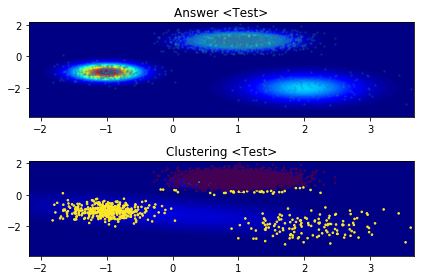

In [534]:
rvs = np.append(x_train, x_test, axis=0)
kde = stats.kde.gaussian_kde(rvs.T)

x_flat = np.r_[rvs[:,0].min():rvs[:,0].max():128j]  # rvs[:,0]を128分割した１次元配列
y_flat = np.r_[rvs[:,1].min():rvs[:,1].max():128j]  # rvs[:,0]を128分割した１次元配列

x,y = np.meshgrid(x_flat,y_flat)  # ヒートマップ表示用の２次元グリッド作成

grid_coords = np.append(x.reshape(-1,1),y.reshape(-1,1),axis=1)
# z = kde(grid_coords.T)  # ２次元グリッド 各点の確率密度を取得

plt.subplot(2, 1, 1)
plt.title("Answer <Test>")
mus = [[1, 1], [-1, -1], [2, -2]]
stds = [[0.2, 0.1], [0.1, 0.1], [0.3, 0.3]]

d2mv = [stats.multivariate_normal(mus[i], np.diag(stds[i])) for i in range(np.shape(mus)[0])]
# z = np.sum(d2mv[i].pdf(grid_coords) for i in range(np.size(d2mv)))
z = np.array([d2mv[i].pdf(grid_coords) for i in range(np.size(d2mv))]).max(axis=0)
z = z.reshape(128,128)

plt.contourf(x_flat, y_flat, z, 100, alpha=1, cmap='jet')
plt.scatter(x_test[:,0], x_test[:,1], marker='.', s=10, alpha=0.2)


plt.subplot(2, 1, 2)
plt.title("Clustering <Test>")
ms = model.means
cv = model.covs
d2mv = [stats.multivariate_normal(ms[:, i], cv[:,:,i]) for i in range(np.shape(ms)[1])]

z = np.array([d2mv[i].pdf(grid_coords) for i in range(np.size(d2mv))]).max(axis=0)
z = z.reshape(128,128)

plt.contourf(x_flat, y_flat, z, 100, alpha=1, cmap='jet')
# colorlist = ["r", "g", "b", "c", "m", "y", "k", "w"]
colorlist = ["k", "w","r"]
plt.scatter(x_test[:,0], x_test[:,1], c=labels, marker='.', s=10, alpha=1)



plt.tight_layout() 
plt.show()

/Users/masamitsuochiai/miniconda2/envs/py3env/lib/python3.6/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: Adding an axes using the same arguments as a previous axes currently reuses the earlier instance.  In a future version, a new instance will always be created and returned.  Meanwhile, this warning can be suppressed, and the future behavior ensured, by passing a unique label to each axes instance.
  warnings.warn(message, mplDeprecation, stacklevel=1)


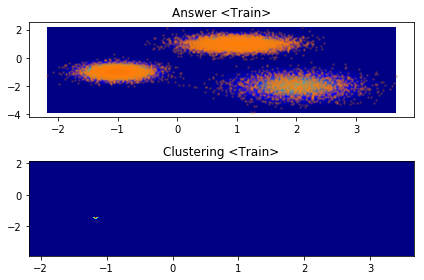

In [538]:
rvs = np.append(x_train, x_test, axis=0)
kde = stats.kde.gaussian_kde(rvs.T)

x_flat = np.r_[rvs[:,0].min():rvs[:,0].max():128j]  # rvs[:,0]を128分割した１次元配列
y_flat = np.r_[rvs[:,1].min():rvs[:,1].max():128j]  # rvs[:,0]を128分割した１次元配列

x,y = np.meshgrid(x_flat,y_flat)  # ヒートマップ表示用の２次元グリッド作成

grid_coords = np.append(x.reshape(-1,1),y.reshape(-1,1),axis=1)
# z = kde(grid_coords.T)  # ２次元グリッド 各点の確率密度を取得

plt.subplot(2, 1, 1)
plt.title("Answer <Train>")
mus = [[1, 1], [-1, -1], [2, -2]]
stds = [[0.2, 0.1], [0.1, 0.1], [0.3, 0.3]]

d2mv = [stats.multivariate_normal(mus[i], np.diag(stds[i])) for i in range(np.shape(mus)[0])]
# z = np.sum(d2mv[i].pdf(grid_coords) for i in range(np.size(d2mv)))
z = np.array([d2mv[i].pdf(grid_coords) for i in range(np.size(d2mv))]).max(axis=0)
z = z.reshape(128,128)

plt.contourf(x_flat, y_flat, z, 100, alpha=1, cmap='jet')
plt.scatter(x_train[:,0], x_train[:,1], marker='.', s=10, alpha=0.2)


plt.subplot(2, 1, 2)
plt.title("Clustering <Train>")
ms = model.means
cv = model.covs
d2mv = [stats.multivariate_normal(ms[:, i], cv[:,:,i]) for i in range(np.shape(ms)[1])]


z = np.array([d2mv[i].pdf(grid_coords) for i in range(np.size(d2mv))]).max(axis=0)
z = z.reshape(128,128)

plt.contourf(x_flat, y_flat, z, 100, alpha=1, cmap='jet')
# colorlist = ["r", "g", "b", "c", "m", "y", "k", "w"]
colorlist = ["k", "w","r"]
# plt.scatter(x_train[:,0], x_train[:,1], marker='.', s=10, alpha=0.2)



plt.tight_layout() 
plt.show()

# ★Gauss関数の検算用

In [474]:
X = np.array([[0.99692947, 0.9990971 ]])
# X = x_train[0:10,:]
ndim = 2
n_component = 2

means = np.ones((ndim, n_component))
# means = model.means
covs = np.repeat(10 * np.eye(ndim), n_component).reshape(ndim, ndim, n_component)
# covs = model.covs

def gauss_my(X, means, covs, n_component):  # 自作のGauss関数
    n_size, ndim = np.shape(X)
    a = lambda i: np.sqrt(np.linalg.det(covs[:,:,i]).T*(2*np.pi)**ndim)
    b1 = lambda i: X-means[:, i].reshape(1, -1)
    b2 = lambda i: np.linalg.inv(covs[:,:,i])
    b3 = lambda i: np.dot(b1(i), b2(i))
    b4 = lambda i: np.exp(-0.5 * np.diag(np.dot(b3(i), b1(i).T)))
    b = np.hstack([b4(i).reshape(-1, 1) / a(i).reshape(-1, 1) for i in range(n_component)])
    return b.reshape(n_size, n_component)


def gauss_or(X, means, covs, n_component):  # scipyによるGauss関数
    mn_lst = np.array([stats.multivariate_normal(mean=means[:, i], cov=covs[:,:,i]) for i in range(n_component)])
    return np.array([mn_lst[i].pdf(X) for i in range(n_component)]).T


print(math.isnan(gauss_my(X, means, covs, n_component).sum()))
print(np.shape(gauss_my(X, means, covs, n_component)))
print("--------------")
print(np.shape(gauss_or(X, means, covs, n_component)))

False
(1, 2)
--------------
(2,)


# ★Numpyの計算結果確認用

In [362]:
a1=np.array([[1,2, 2,3]]).reshape(2, 2)
a2=np.array([4,5,6]).reshape(1, -1)
a3=np.array([1,2,3,4,5,6]).reshape(2, 3)

In [372]:
# print(a1)
print(a2)
print(a3)
# print(a2.sum())
np.vstack([a1 * i] for i in a2.reshape(-1)).T

print(a3/a2.reshape(1,-1))

[[4 5 6]]
[[1 2 3]
 [4 5 6]]
[[0.25 0.4  0.5 ]
 [1.   1.   1.  ]]
